In [2]:
import sys
sys.path.append('../')
from xd import *
from utils import *
import esutil
import healpy as hp
from systematics import *
from systematics_module import *

%matplotlib inline

%load_ext autoreload
%autoreload 2

## systematic test 

In [3]:
import numpy as np
import healpy as hp

In [4]:
from systematics import sys_iteration, fitting_SP, sys_ngal

In [5]:
# calling catalog
#from systematics import GalaxyDensity_Systematics,loadSystematicMaps, chisquare_dof, MatchHPArea, SysMapBadRegionMask, callingEliGoldMask

def calling_sysMap( properties=None, kind='SPT', nside=4096, path = None ):
    # Calling maps
    from systematics import callingEliGoldMask,callingY1GoldMask
    GoldMask = callingEliGoldMask()
    #GoldMask = callingY1GoldMask(nside)
    
    MaskDic = {}
    for i,p in enumerate(properties):
        if p == 'NSTARS_allband':
            filename =  'y1a1_gold_1.0.2_stars_nside1024.fits'
            sysMap = loadSystematicMaps( filename = filename, property = p, filter = 'g', nside = 1024 , kind = kind, path = path)
            if kind is 'STRIPE82': sysMap = sysMap[sysMap['DEC'] > -3]
            elif kind is 'SPT': sysMap = sysMap[sysMap['DEC'] < -3]
            mapname = 'sys_'+p+'_'+'g'+'_'+kind
            MaskDic[mapname] = sysMap
            
        elif p == 'GE':
            sysMap = loadSystematicMaps( property = p, filter = 'g', nside = 512 , kind = kind, path = path)
            if kind is 'STRIPE82': sysMap = sysMap[sysMap['DEC'] > -3]
            elif kind is 'SPT': sysMap = sysMap[sysMap['DEC'] < -3]
            mapname = 'sys_'+p+'_'+'g'+'_'+kind
            MaskDic[mapname] = sysMap
            
         
        else :
            filter = ['g', 'r', 'i', 'z']
            
            if p =='EXPTIME':
                filename = ['Y1A1NEW_COADD_'+kind+'_band_'+f+'_nside4096_oversamp4_EXPTIME__total.fits.gz'\
                             for f in filter ]
            elif p =='DEPTH' :
                filename = ['Y1A1NEW_COADD_'+kind+'_band_'+f+'_nside4096_oversamp4_maglimit3__.fits.gz'\
                             for f in filter ]
            elif p == 'NSTARS' : 
                filename = ['Y1A1NEW_COADD_'+kind+'_band_'+f+'_nside4096_oversamp4_NSTARS_ACCEPTED_MEAN_coaddweights3_mean.fits.gz'\
                             for f in filter ]
            else : filename = [None for f in filter]

            for j,f in enumerate(filter):
                sysMap = loadSystematicMaps( filename = filename[j], property = p, filter = f, nside = nside , kind = kind, path = path)
                mapname = 'sys_'+p+'_'+f+'_'+kind
                keep = np.in1d(sysMap['PIXEL'], GoldMask['PIXEL'])
                MaskDic[mapname] = sysMap[keep]
                
    return MaskDic

In [26]:
def maskingCatalogSP(catalog=None, sysMap=None):
    
    
    exp_i_hpind = sysMap['sys_EXPTIME_i_SPT']['PIXEL'][(sysMap['sys_EXPTIME_i_SPT']['SIGNAL'] < 500)]
    fwhm_r_hpind = sysMap['sys_FWHM_r_SPT']['PIXEL'][(sysMap['sys_FWHM_r_SPT']['SIGNAL'] < 4.5)]
    #ge_hpind = sysMap['sys_GE_g_SPT']['PIXEL'][(sysMap['sys_GE_g_SPT']['SIGNAL'] < 0.09)]
    ge_hpind = sysMap['sys_GE_g_SPT']['PIXEL'][(sysMap['sys_GE_g_SPT']['SIGNAL'] < 100000)]
    #skybrite_g_hpind = sysMap['sys_SKYBRITE_g_SPT']['PIXEL'][(sysMap['sys_SKYBRITE_g_SPT']['SIGNAL'] < 170)]
    #skybrite_i_hpind = sysMap['sys_SKYBRITE_i_SPT']['PIXEL'][(sysMap['sys_SKYBRITE_i_SPT']['SIGNAL'] < 1400)]
    skybrite_g_hpind = sysMap['sys_SKYBRITE_g_SPT']['PIXEL'][(sysMap['sys_SKYBRITE_g_SPT']['SIGNAL'] < 1700000)]
    skybrite_i_hpind = sysMap['sys_SKYBRITE_i_SPT']['PIXEL'][(sysMap['sys_SKYBRITE_i_SPT']['SIGNAL'] < 14000000)]  
    
    all_mask1 = np.zeros( hp.nside2npix(4096), dtype=bool )
    all_mask2 = np.zeros( hp.nside2npix(4096),dtype=bool )
    all_mask3 = np.zeros( hp.nside2npix(4096),dtype=bool )
    all_mask4 = np.zeros( hp.nside2npix(4096),dtype=bool )
    
    all_mask512 = np.zeros( hp.nside2npix(512),dtype=bool )
    
    all_mask1[exp_i_hpind] = 1
    all_mask2[fwhm_r_hpind] = 1
    all_mask3[skybrite_g_hpind] = 1
    all_mask4[skybrite_i_hpind] = 1
    
    all_mask512[ge_hpind] = 1
    all_mask4096 = all_mask1 * all_mask2 * all_mask3* all_mask4


    all_ind4096 = np.arange( hp.nside2npix(4096) )
    all_ind512 = np.arange( hp.nside2npix(512) )
    goodindices4096 = all_ind4096[all_mask4096]
    goodindices512 = all_ind512[all_mask512]
  
    
    #goodindices = np.hstack([exp_i_hpind, fwhm_r_hpind, ge_hpind])
    
    #exp_mask =  (sysMap['sys_EXPTIME_i_SPT']['SIGNAL'] < 500) &  (sysMap['sys_EXPTIME_r_SPT']['SIGNAL'] < 500)
    #fwhm_mask = ((sysMap['sys_FWHM_g_SPT']['SIGNAL'] < 500) & (sysMap['sys_FWHM_r_SPT']['SIGNAL'] < 500) 
    #            & (sysMap['sys_FWHM_i_SPT']['SIGNAL'] < 500) & (sysMap['sys_FWHM_z_SPT']['SIGNAL'] < 500))

    fwhm_mask = (sysMap['sys_FWHM_r_SPT']['SIGNAL'] < 4.5) 
    skybrite_mask = (sysMap['sys_SKYBRITE_g_SPT']['SIGNAL'] < 160) & (sysMap['sys_SKYBRITE_i_SPT']['SIGNAL'] < 1400) \
    &(sysMap['sys_SKYBRITE_z_SPT']['SIGNAL'] < 3000) 
    
    #ge_mask = (sysMap['sys_GE_g_SPT']['SIGNAL'] < 0.08)  
    #all_mask = fwhm_mask*exp_mask*skybrite_mask
    #print 'exp mask ', 1. - np.sum(exp_mask) *1./exp_mask.size
    #print 'fwhm mask', 1. - np.sum(fwhm_mask) *1./fwhm_mask.size
    #print 'skybrite mask', 1. - np.sum(skybrite_mask) *1./skybrite_mask.size
    #print 'all mask', 1. - np.sum(fwhm_mask*exp_mask*skybrite_mask) *1./fwhm_mask.size   

    catHpInd4096 = hpRaDecToHEALPixel(catalog['RA'], catalog['DEC'], nside=4096, nest=False)
    catHpInd512 = hpRaDecToHEALPixel(catalog['RA'], catalog['DEC'], nside=512, nest=False)
    HpIdxInsys_mask4096 = np.in1d(catHpInd4096, goodindices4096)
    HpIdxInsys_mask512 = np.in1d(catHpInd512, goodindices512)
    
    HpIdxInsys_mask = HpIdxInsys_mask4096 * HpIdxInsys_mask512
    
    print HpIdxInsys_mask.size, np.sum(HpIdxInsys_mask)
    print 'mask ', np.sum(HpIdxInsys_mask) * 1./catalog.size
    return catalog[HpIdxInsys_mask]
    

In [8]:
# calling map 
GoldMask = callingEliGoldMask()
#GoldMask_st82 = Cuts.SpatialCuts(GoldMask, ra=320, ra2=360, dec=-2, dec2=2)
GoldMask_st82 = GoldMask[ GoldMask['DEC'] > -3.0 ]
GoldMask_spt = GoldMask[ GoldMask['DEC'] < -3.0 ]
#GoldMask_spt = cutcat20(GoldMask_spt)
#GoldMask_spt = Cuts.SpatialCuts(GoldMask_spt, ra=0, ra2 = 100, dec=-52, dec2 = -48)

pixarea = hp.nside2pixarea( 4096, degrees = True)
sptnpix = GoldMask_spt['PIXEL'].size #hp.get_map_size( GoldMask_spt['PIXEL'] )
st82npix =  GoldMask_st82['PIXEL'].size # hp.get_map_size( GoldMask_st82 )
SPTMaparea = pixarea * sptnpix
ST82Maparea = pixarea * st82npix

In [9]:
# import DMASS

dmass = fitsio.read('../output/n2_2/dmass_spt.fits')
#dmass = cutcat20(dmass)
cmass = fitsio.read('../output/n2/dmass_st82.fits')
print 'dmass sample size :', dmass.size
print 'cmass sample size :', cmass.size

dmass sample size : 112398
cmass sample size : 11593


In [11]:
#cmass_sgc = fitsio.read('/n/des/lee.5922/data/cmass_cat/galaxy_DR12v5_CMASS_South.fits.gz')
#cmass_ngc = fitsio.read('/n/des/lee.5922/data/cmass_cat/galaxy_DR12v5_CMASS_North.fits.gz')

In [14]:
#p.mean(cmass_sgc['WEIGHT_FKP']), np.mean(cmass_ngc['WEIGHT_FKP'])

(0.32607782, 0.3191604)

In [15]:
#rand_bg = uniform_random_on_sphere(dmass_spt2, size = 100 * dmass_spt2.size)
#rand_bg = Cuts.keepGoodRegion(rand_bg)
#rand_bg_train = uniform_random_on_sphere(clean_cmass_data_des, size = 100 * clean_cmass_data_des.size)
#rand_bg_train = Cuts.keepGoodRegion(rand_bg_train)

rand = uniform_random_on_sphere(dmass, size = 10 * dmass.size)
rand = Cuts.keepGoodRegion(rand)
#rand = Cuts.keepY1GoldRegion(rand)
rand = rand[ rand['DEC'] < -3.0 ]
#rand = cutcat20(rand)

rand2 = uniform_random_on_sphere(dmass, size = 50 * dmass.size)
rand2 = Cuts.keepGoodRegion(rand2)
#rand = Cuts.keepY1GoldRegion(rand)
rand2 = rand2[ rand2['DEC'] < -3.0 ]
#rand2 = cutcat20(rand2)

rand_cmass = uniform_random_on_sphere(cmass, size = 200 * cmass.size)
rand_cmass = Cuts.keepGoodRegion(rand_cmass)
rand_cmass = rand_cmass[ rand_cmass['DEC'] > -3.0 ]

rand2_cmass = uniform_random_on_sphere(cmass, size = 500 * cmass.size)
rand2_cmass = Cuts.keepGoodRegion(rand2_cmass)
rand2_cmass = rand2_cmass[ rand2_cmass['DEC'] > -3.0 ]

print rand.size, dmass.size
print rand_cmass.size, cmass.size
#rand_train = uniform_random_on_sphere(clean_cmass_data_des, size = 10 * clean_cmass_data_des.size)
#rand_train = Cuts.keepGoodRegion(rand_train)

509890 112398
187746 11593


In [33]:
kind = 'SPT'
FullArea = SPTMaparea
#properties = ['DEPTH','EXPTIME']
#properties = ['DEPTH', 'EXPTIME', 'AIRMASS', 'SKYBRITE', 'FWHM', 'NSTARS']
properties = ['DEPTH', 'EXPTIME', 'AIRMASS', 'SKYBRITE', 'FWHM', 'NSTARS_allband', 'GE']
#properties = ['FWHM']
suffix='no_weight'
# calculating galaxy density and weights iterately

In [17]:
sysMap = calling_sysMap( properties=properties, kind='SPT', nside=4096 )


PATH =  /n/des/lee.5922/data/systematic_maps/Y1A1NEW_COADD_SPT/nside4096_oversamp4/
Y1A1NEW_COADD_SPT_band_g_nside4096_oversamp4_maglimit3__.fits.gz
NSIDE = 4096
ORDERING = RING in fits file
INDXSCHM = EXPLICIT

PATH =  /n/des/lee.5922/data/systematic_maps/Y1A1NEW_COADD_SPT/nside4096_oversamp4/
Y1A1NEW_COADD_SPT_band_r_nside4096_oversamp4_maglimit3__.fits.gz
NSIDE = 4096
ORDERING = RING in fits file
INDXSCHM = EXPLICIT

PATH =  /n/des/lee.5922/data/systematic_maps/Y1A1NEW_COADD_SPT/nside4096_oversamp4/
Y1A1NEW_COADD_SPT_band_i_nside4096_oversamp4_maglimit3__.fits.gz
NSIDE = 4096
ORDERING = RING in fits file
INDXSCHM = EXPLICIT

PATH =  /n/des/lee.5922/data/systematic_maps/Y1A1NEW_COADD_SPT/nside4096_oversamp4/
Y1A1NEW_COADD_SPT_band_z_nside4096_oversamp4_maglimit3__.fits.gz
NSIDE = 4096
ORDERING = RING in fits file
INDXSCHM = EXPLICIT

PATH =  /n/des/lee.5922/data/systematic_maps/Y1A1NEW_COADD_SPT/nside4096_oversamp4/
Y1A1NEW_COADD_SPT_band_g_nside4096_oversamp4_EXPTIME__total.fits.gz

In [32]:
#sys_nstar = calling_sysMap( properties=['NSTARS_allband'], kind='SPT', nside=4096 )
#sysMap['sys_NSTARS_allband_g_SPT'] = sys_nstar['sys_NSTARS_allband_g_SPT']

In [27]:
dmass_masked = maskingCatalogSP(catalog=dmass, sysMap=sysMap)
rand_masked = maskingCatalogSP(catalog=rand, sysMap=sysMap)
rand2_masked = maskingCatalogSP(catalog=rand2, sysMap=sysMap)

112398 108272
mask  0.9632911617644442
509890 493766
mask  0.9683774931848046
2550940 2469911
mask  0.9682356307870824


In [28]:
inputdir = '../data_txt/systematics/4th/'
figoutdir = '../data_txt/systematics/4th/figure/'
#os.system('mkdir '+inputdir)
#os.system('mkdir '+figoutdir)
#os.system('mkdir '+inputdir+'/weights/')
#cp ../data_txt/systematics/2nd/systematic*_no_weight.txt ../data_txt/systematics/3rd/.

In [34]:
sys_ngal(cat1 = dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2 = rand2_masked, sysmap = sysMap, 
         FullArea = SPTMaparea, properties = properties, kind='SPT', nbins =15, 
         reweight= None, nside = 4096,
         suffix='no_weight', outdir=inputdir)

saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_no_weight.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_no_weight.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_no_weight.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_no_weight.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_g_SPT_no_weight.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_r_SPT_no_weight.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_i_SPT_no_weight.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_z_SPT_no_weight.txt
saving data to  ../data_txt/systematics/4th/systematic_AIRMASS_g_SPT_no_weight.txt
saving data to  ../data_txt/systematics/4th/systematic_AIRMASS_r_SPT_no_weight.txt
saving data to  ../data_txt/systematics/4th/systematic_AIRMASS_i_SPT_no_weight.txt
saving data to  ../data_txt/systematics/4th/systematic_AIRMASS_z_SPT_no_weight.txt
saving data 

saving fig to  ../data_txt/systematics/4th/figure/systematic_DEPTH_SPT_no_weight.png
saving fig to  ../data_txt/systematics/4th/figure/systematic_EXPTIME_SPT_no_weight.png
saving fig to  ../data_txt/systematics/4th/figure/systematic_AIRMASS_SPT_no_weight.png
saving fig to  ../data_txt/systematics/4th/figure/systematic_SKYBRITE_SPT_no_weight.png
saving fig to  ../data_txt/systematics/4th/figure/systematic_FWHM_SPT_no_weight.png
saving fig to  ../data_txt/systematics/4th/figure/systematic_NSTARS_allband_SPT_no_weight.png
saving fig to  ../data_txt/systematics/4th/figure/systematic_GE_SPT_no_weight.png


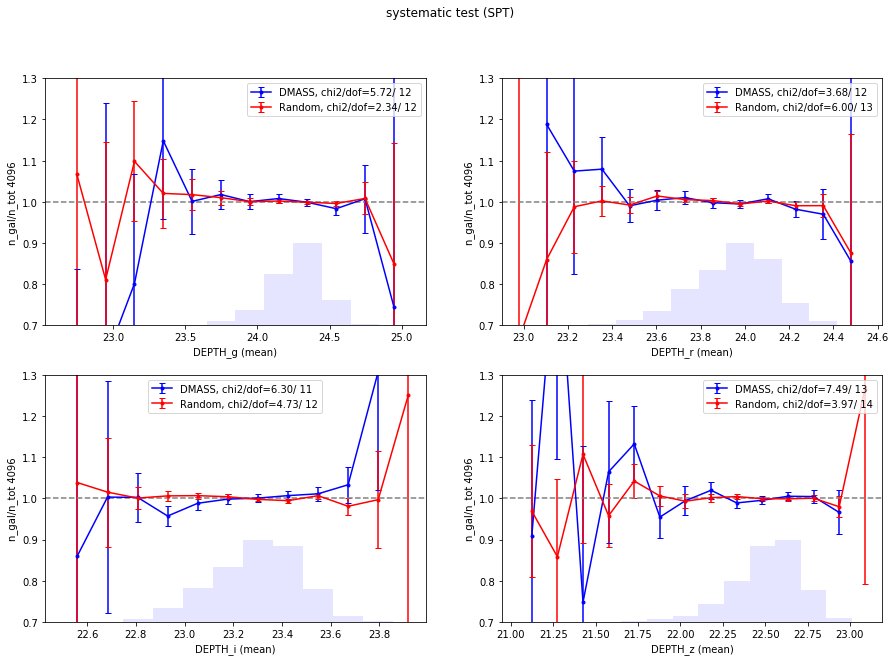

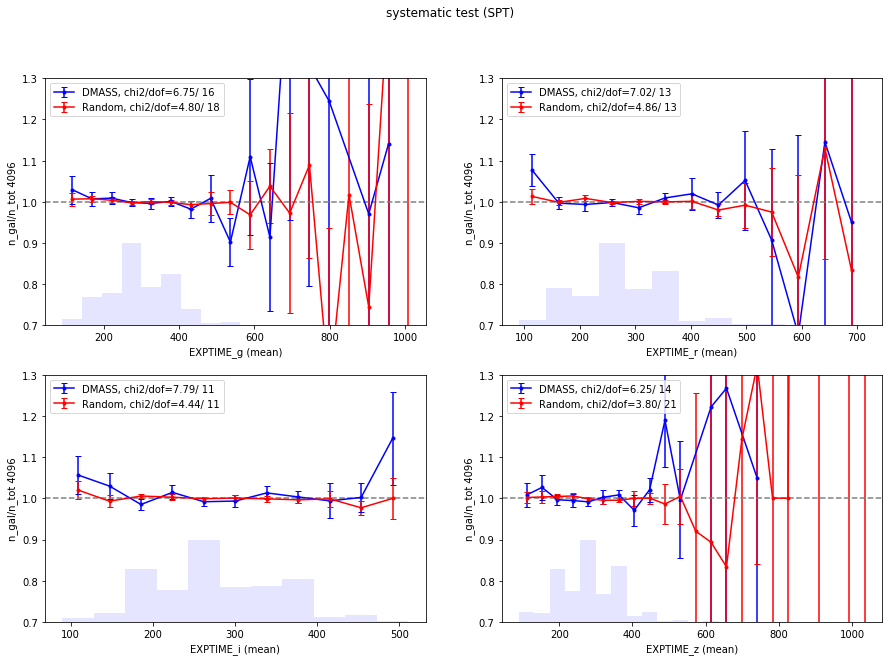

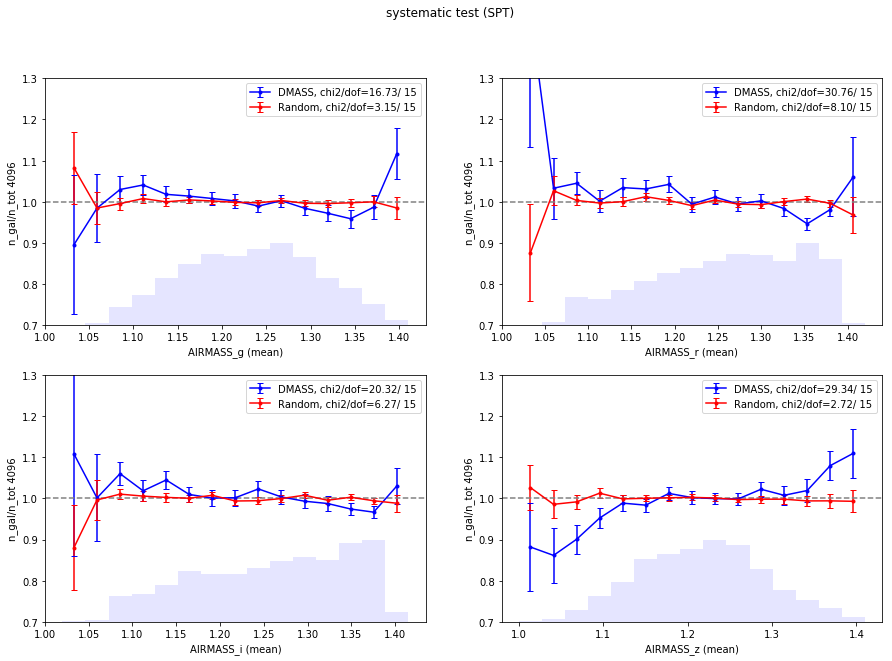

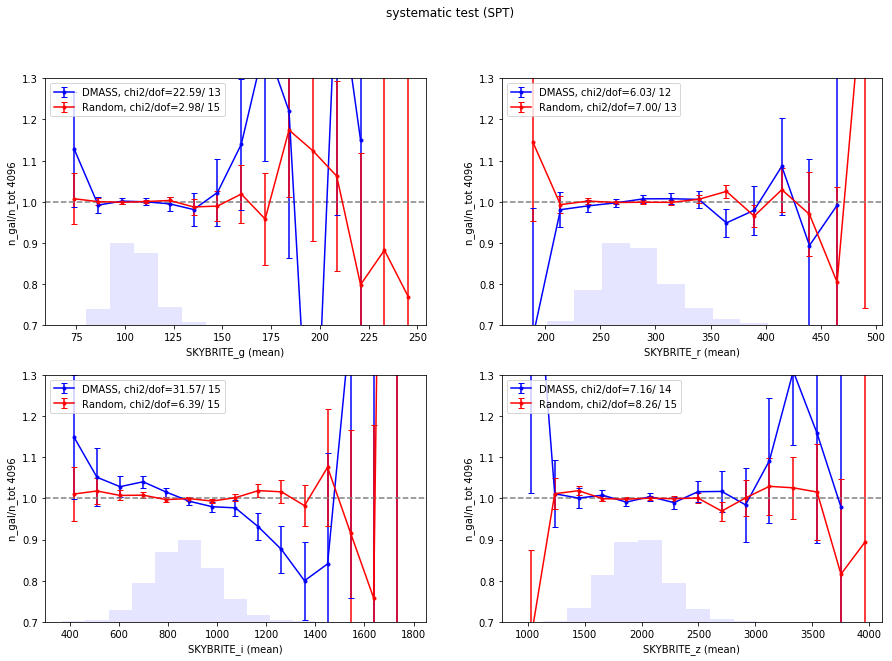

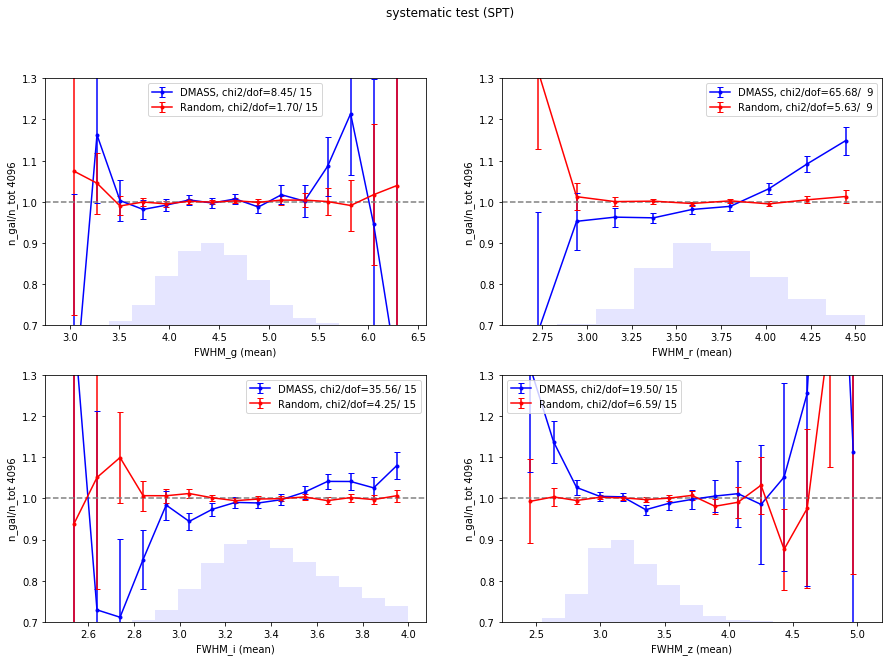

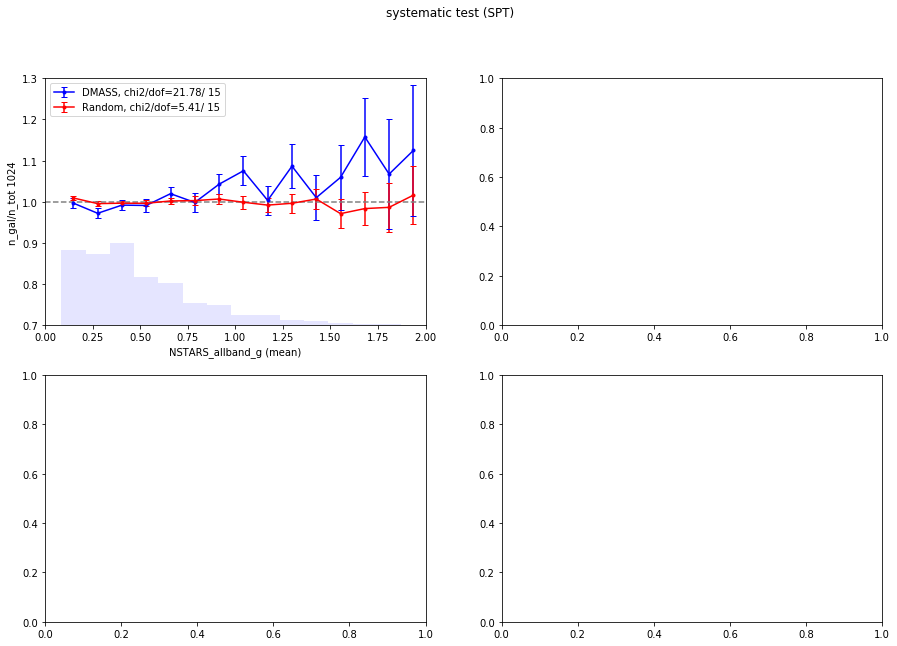

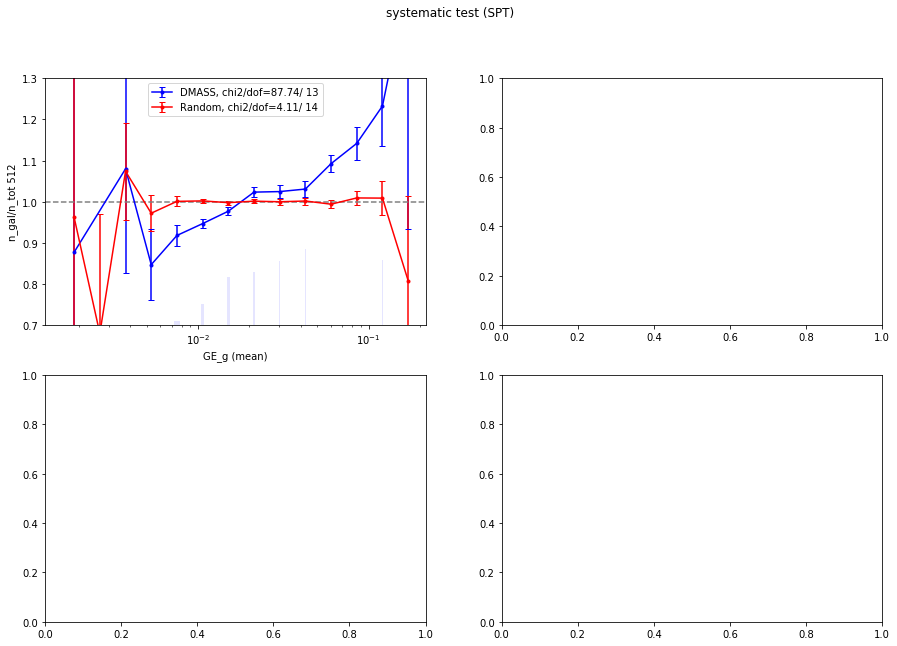

In [37]:
from systematics_module.contCorrection import doVisualization_ngal

for p in properties : 
    doVisualization_ngal(property = p, nside = 4096, kind = kind, suffix='no_weight', \
                         inputdir=inputdir, outdir=figoutdir)

chi2_null =  21.778518563677956
chi2_mod. =  10.188101728396207
Delta chi2 (sample) = 11.590416835281749
output save to  ../data_txt/systematics/4th/systematic_NSTARS_allband_g_SPT_no_weight.txt.model

chi2_null =  87.73554134200364
chi2_mod. =  7.898186213009346
Delta chi2 (sample) = 79.83735512899429
output save to  ../data_txt/systematics/4th/systematic_GE_g_SPT_no_weight.txt.model

chi2_null =  5.715908628583887
chi2_mod. =  4.673720860347582
Delta chi2 (sample) = 1.042187768236305
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_no_weight.txt.model

chi2_null =  3.6751189521080327
chi2_mod. =  3.0601508404775086
Delta chi2 (sample) = 0.6149681116305241
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_no_weight.txt.model

chi2_null =  6.30188008356699
chi2_mod. =  2.339843528528319
Delta chi2 (sample) = 3.9620365550386714
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_no_weight.txt.model

chi2_null =  7.48697283077753
chi2_mod

(['GE_g',
  'FWHM_r',
  'FWHM_i',
  'SKYBRITE_i',
  'AIRMASS_r',
  'AIRMASS_z',
  'AIRMASS_i',
  'NSTARS_allband_g',
  'AIRMASS_g',
  'FWHM_z',
  'DEPTH_i',
  'EXPTIME_g',
  'DEPTH_g',
  'FWHM_g',
  'DEPTH_r',
  'SKYBRITE_g',
  'EXPTIME_z',
  'EXPTIME_i',
  'SKYBRITE_z',
  'SKYBRITE_r',
  'DEPTH_z',
  'EXPTIME_r'],
 [79.83735512899429,
  53.49617865476577,
  28.509744706065348,
  26.760437131711505,
  18.367289560103742,
  17.471874037287286,
  13.953920005412595,
  11.590416835281749,
  7.180282678905282,
  5.015956513125536,
  3.9620365550386714,
  1.8176606759773017,
  1.042187768236305,
  0.8288005497627875,
  0.6149681116305241,
  0.45263595633948484,
  0.2764250508388004,
  0.13316766113053813,
  0.12007363708290963,
  0.11243766010556655,
  0.010894676698766759,
  0.005140852971523557])

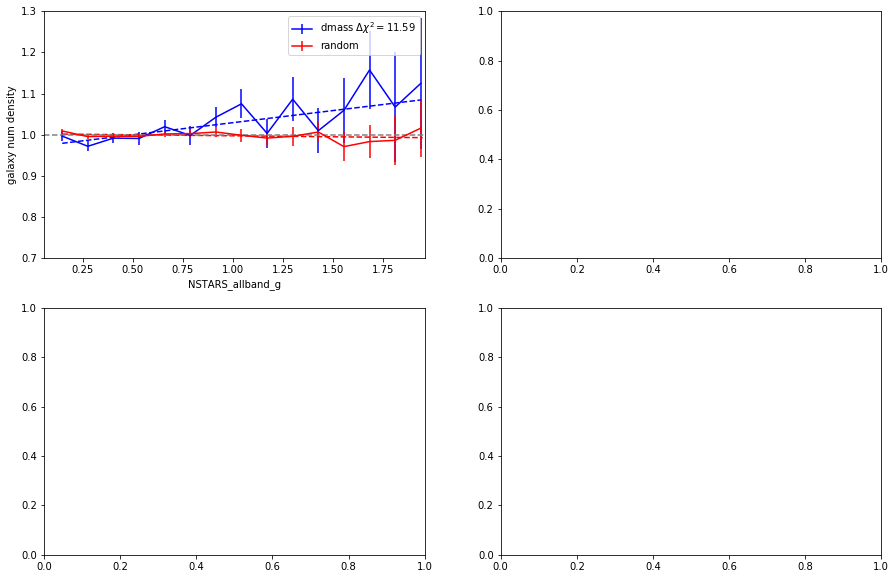

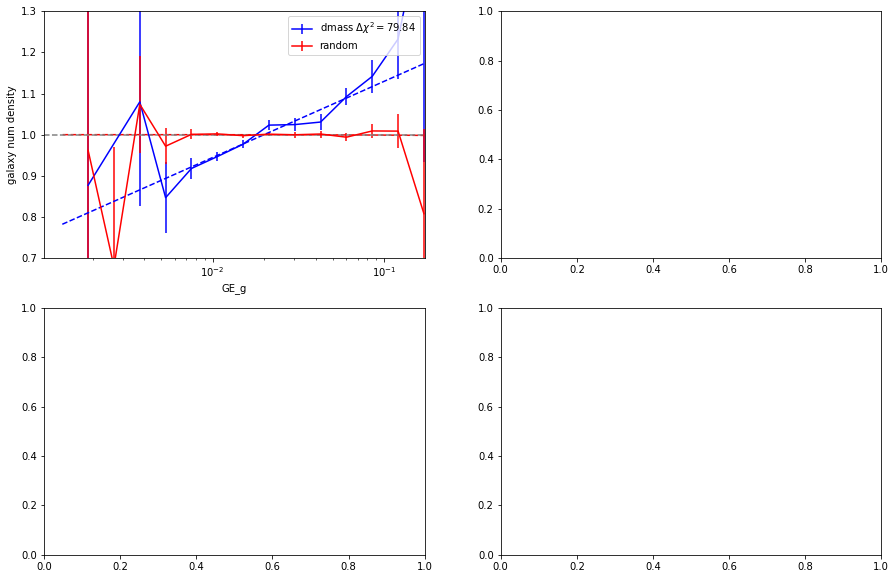

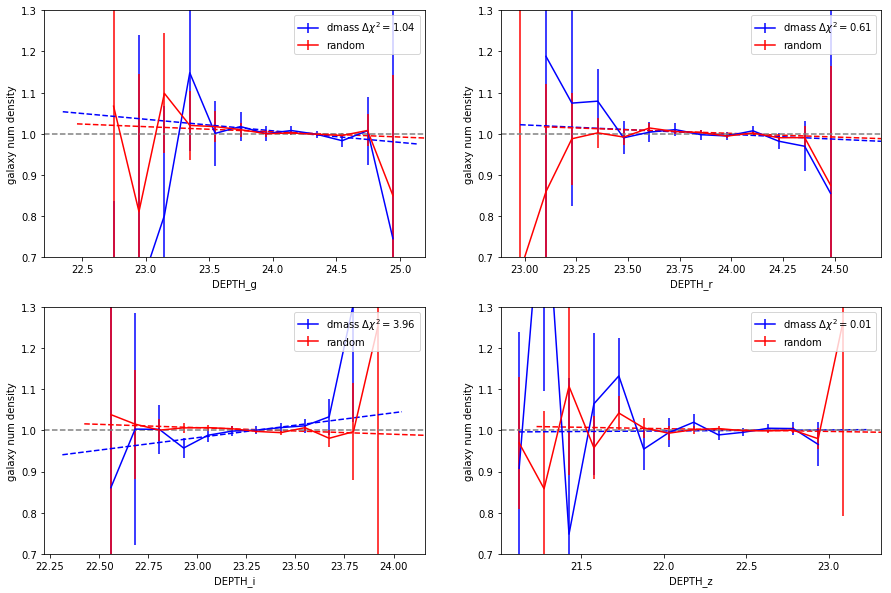

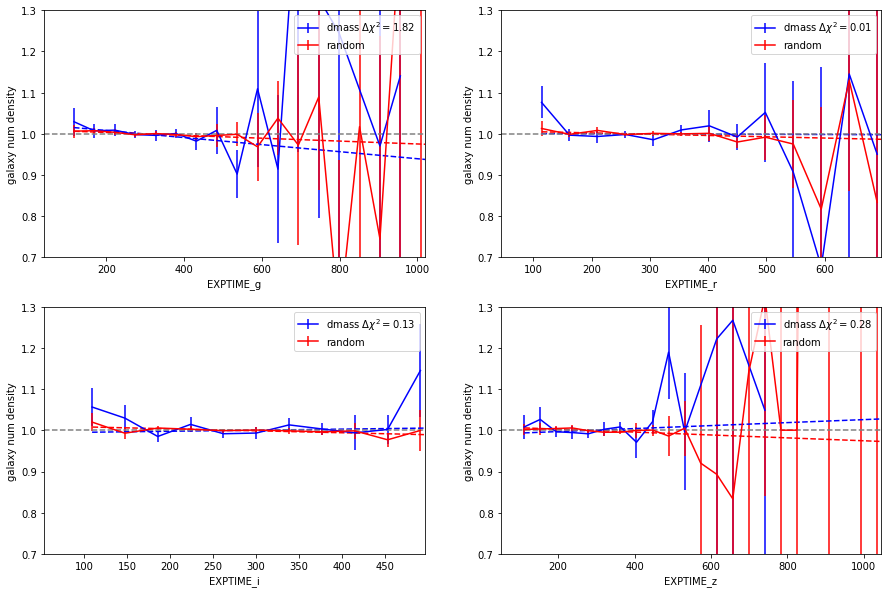

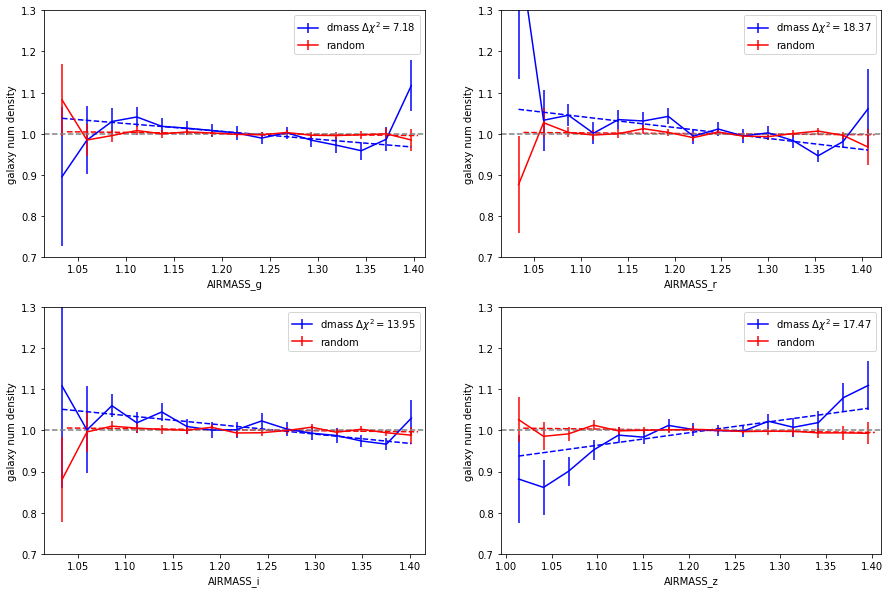

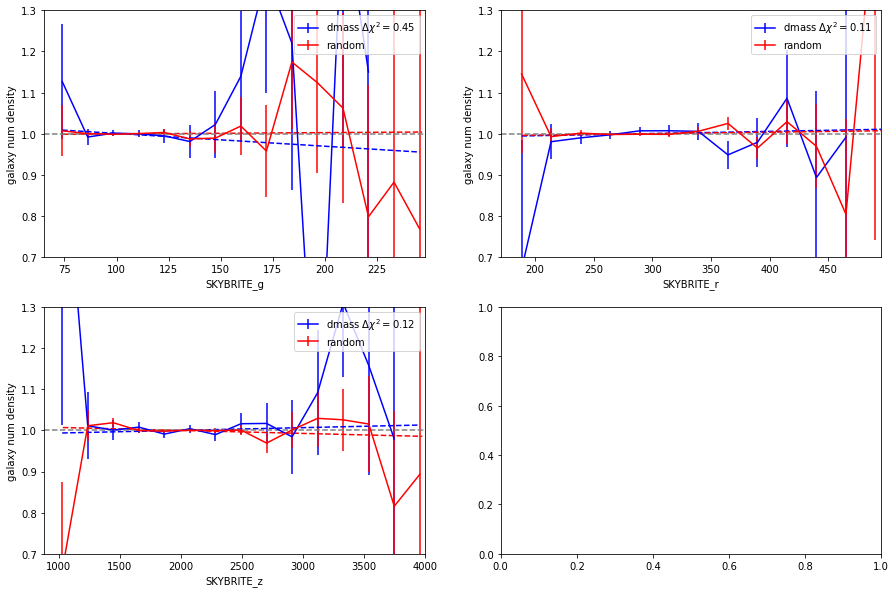

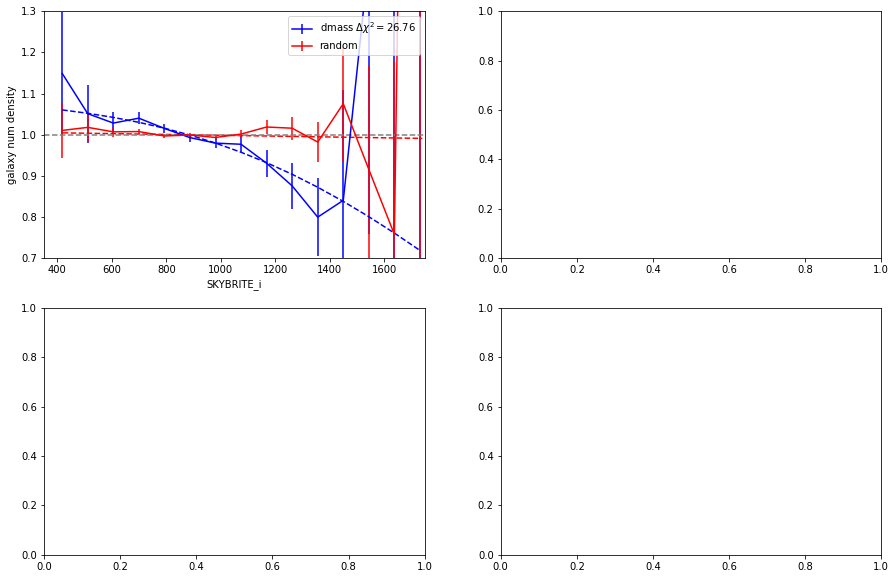

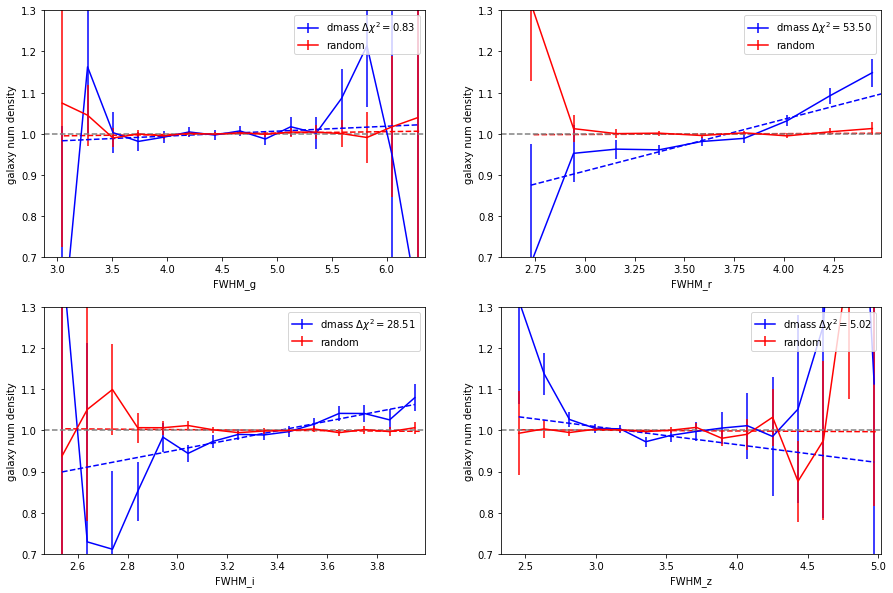

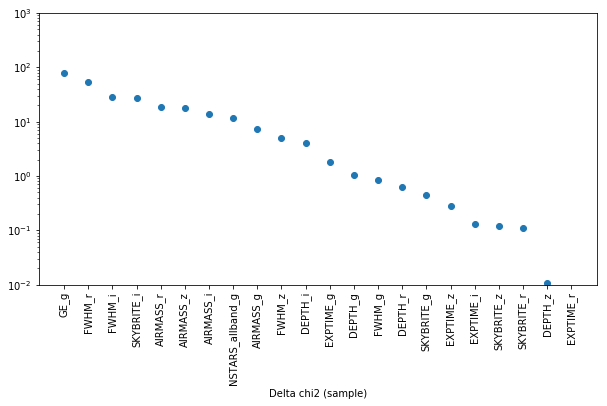

In [36]:
filters = ['g']
fitting_SP( property = ['NSTARS_allband'], filter=filters, kind = 'SPT', suffix='no_weight', plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=filters, kind = 'SPT', suffix='no_weight', plot=True, function = 'log',
                path = inputdir )

filters = ['g', 'r', 'i', 'z']
fitting_SP( property = ['DEPTH'], filter=filters, kind = 'SPT', suffix='no_weight', plot=True, function = 'linear',
                path = inputdir )

filters = ['g', 'r', 'i', 'z']
fitting_SP( property = ['EXPTIME'], filter=filters, kind = 'SPT', suffix='no_weight', plot=True, function = 'linear',
                path = inputdir )

filters = ['g', 'r', 'i', 'z']
fitting_SP( property = ['AIRMASS'], filter=filters, kind = 'SPT', suffix='no_weight', plot=True, function = 'linear',
                path = inputdir )


filters = ['g', 'r', 'z']
fitting_SP( property = ['SKYBRITE'], filter=filters, kind = 'SPT', suffix='no_weight', plot=True, function = 'linear',
                path = inputdir )


filters = ['i']
fitting_SP( property = ['SKYBRITE'], filter=filters, kind = 'SPT', suffix='no_weight', plot=True, function = 'errftn',
                path = inputdir )


filters = ['g', 'r', 'i', 'z']
fitting_SP( property = ['FWHM'], filter=filters, kind = 'SPT', suffix='no_weight', plot=True, function = 'linear',
                path = inputdir )

plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, suffix='no_weight', 
                path = inputdir, deltachi2=True)


# Correction ! 

### Galactic Extinction

In [41]:
weightDic = {}
weightDic['noweight'] = np.ones(dmass_masked.size)
all_weight = weightDic['noweight']
suffix = 'no_weight'
nextweight = 'FWHM_r'

----------------------------------
initialize function  FWHM_r
linear
108272
store weight  FWHM_r
save weight to fits ../data_txt/systematics/4th//weights/wg_fwhm_r_SPT.fits
suffix =  wg_fwhm_r
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_g_SPT_wg_fwhm_r.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_r_SPT_wg_fwhm_r.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_i_SPT_wg_fwhm_r.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_z_SPT_wg_fwhm_r.txt
saving data to  ../data_txt/systematics/4th/systematic_AIRMASS_g_SPT_wg_fwhm_r.txt
saving data to  ../data_txt/systematics/4th/systematic_AIRMASS_r_SP

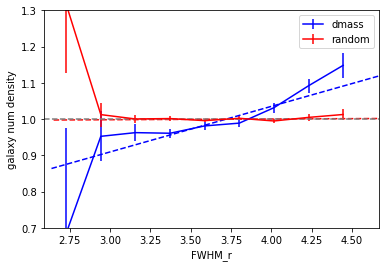

In [42]:
sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=1024, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  6.438970518662606
chi2_mod. =  4.53262440223443
Delta chi2 (sample) = 1.9063461164281756
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r.txt.model

chi2_null =  5.227808382516456
chi2_mod. =  3.1069555690879147
Delta chi2 (sample) = 2.1208528134285416
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r.txt.model

chi2_null =  4.398306183193479
chi2_mod. =  2.53574581956483
Delta chi2 (sample) = 1.8625603636286487
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r.txt.model

chi2_null =  7.4913701180545935
chi2_mod. =  7.387575825180433
Delta chi2 (sample) = 0.1037942928741602
output save to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r.txt.model

chi2_null =  7.31481468480535
chi2_mod. =  4.958892504115993
Delta chi2 (sample) = 2.3559221806893573
output save to  ../data_txt/systematics/4th/systematic_EXPTIME_g_SPT_wg_fwhm_r.txt.model

chi2_null =  7.491933777261178
chi2_mod. =  

(['GE_g',
  'AIRMASS_z',
  'SKYBRITE_i',
  'NSTARS_allband_g',
  'AIRMASS_r',
  'AIRMASS_i',
  'FWHM_i',
  'FWHM_z',
  'AIRMASS_g',
  'EXPTIME_g',
  'SKYBRITE_r',
  'DEPTH_r',
  'DEPTH_g',
  'DEPTH_i',
  'SKYBRITE_z',
  'FWHM_g',
  'EXPTIME_r',
  'DEPTH_z',
  'EXPTIME_z',
  'FWHM_r',
  'EXPTIME_i',
  'SKYBRITE_g'],
 [90.68011815727198,
  19.49237244248841,
  17.750912076201327,
  13.163828457958653,
  10.271814129448932,
  9.995362620506583,
  7.858882243580525,
  6.516261982222744,
  4.2112208769576664,
  2.3559221806893573,
  2.2931924350320996,
  2.1208528134285416,
  1.9063461164281756,
  1.8625603636286487,
  0.8304088489574459,
  0.7074968904495247,
  0.3283413271707589,
  0.1037942928741602,
  0.08724869435171367,
  0.08434273336291653,
  0.0392060577538027,
  0.014993839094760375])

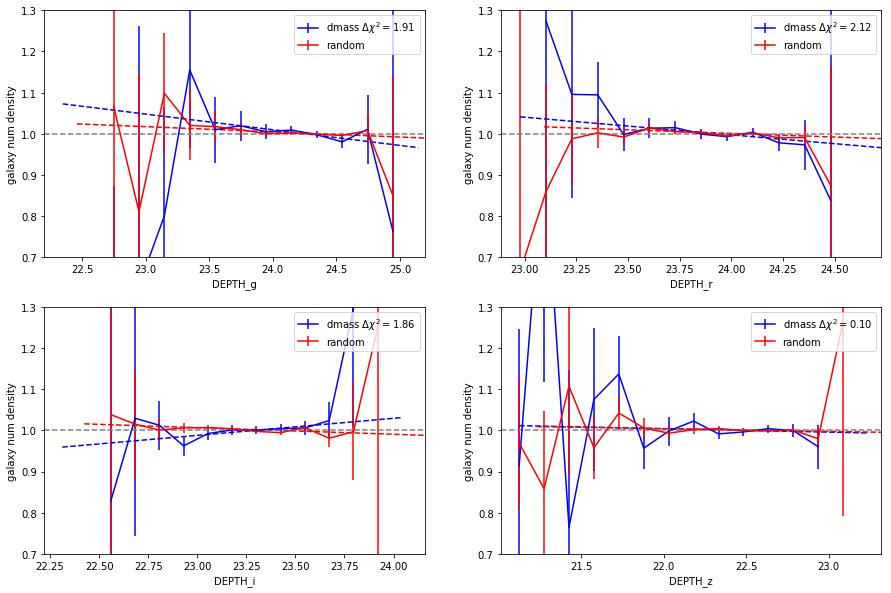

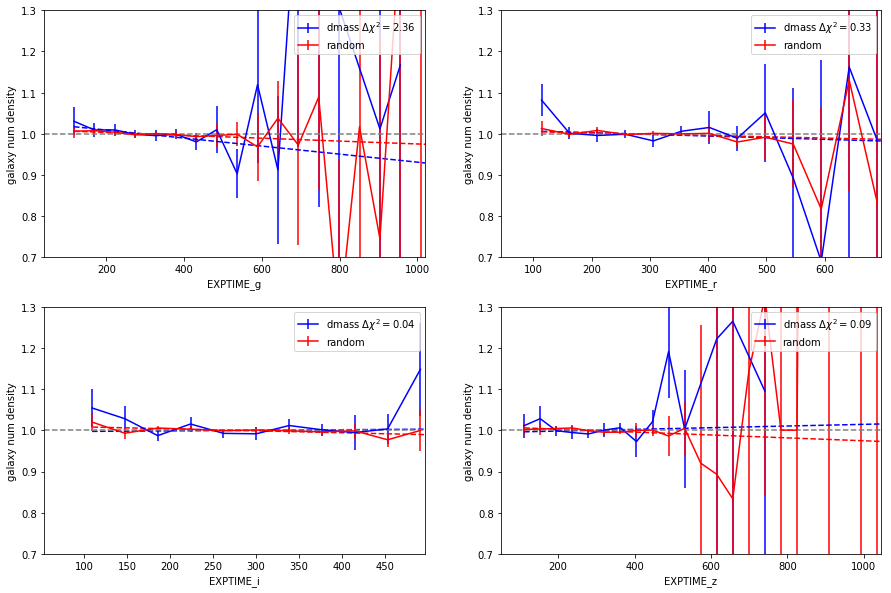

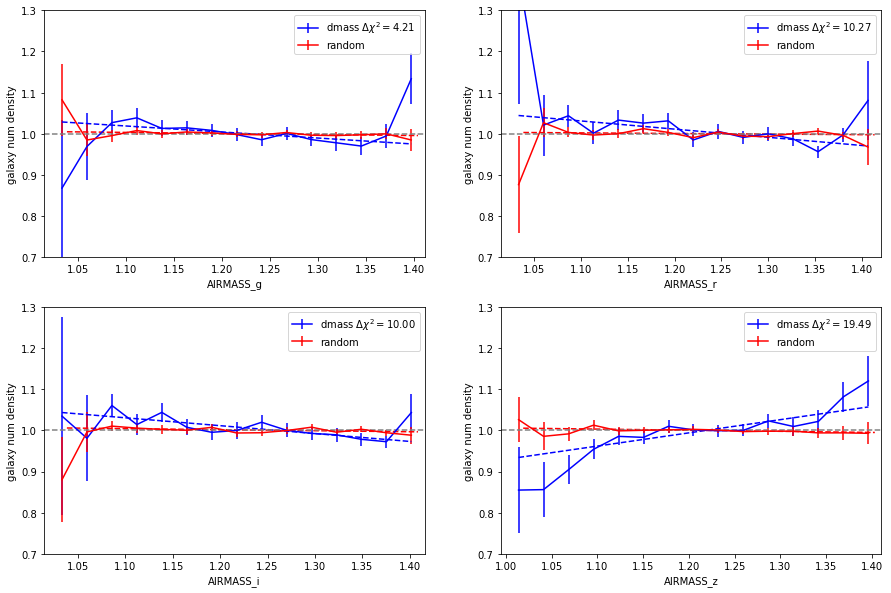

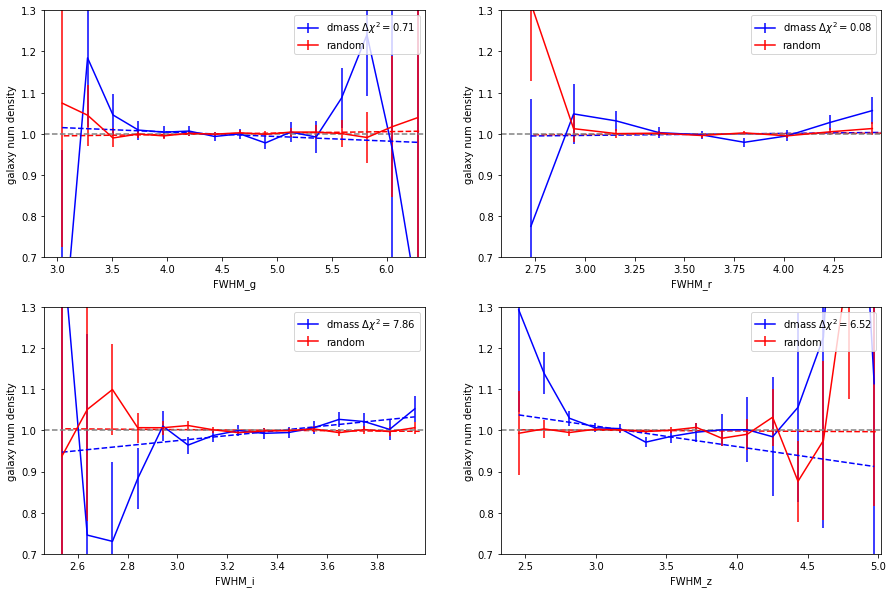

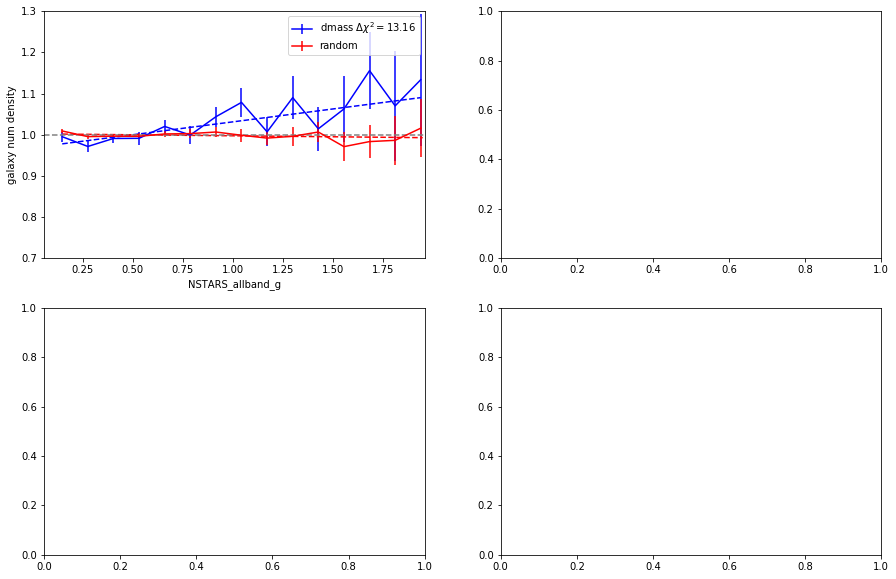

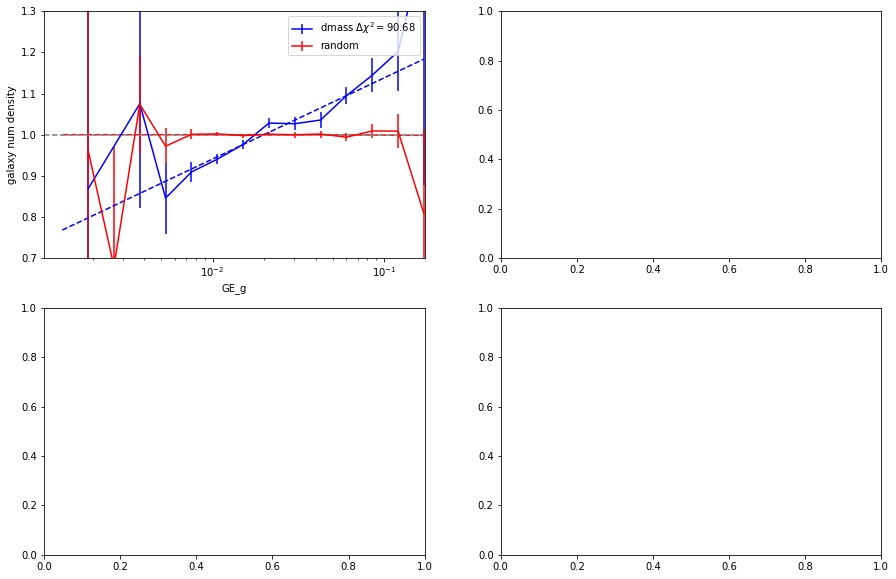

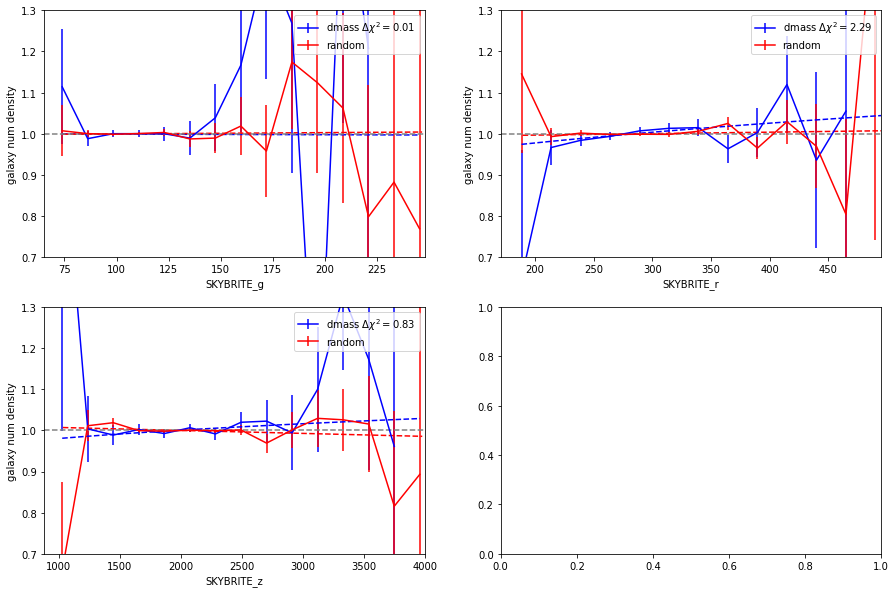

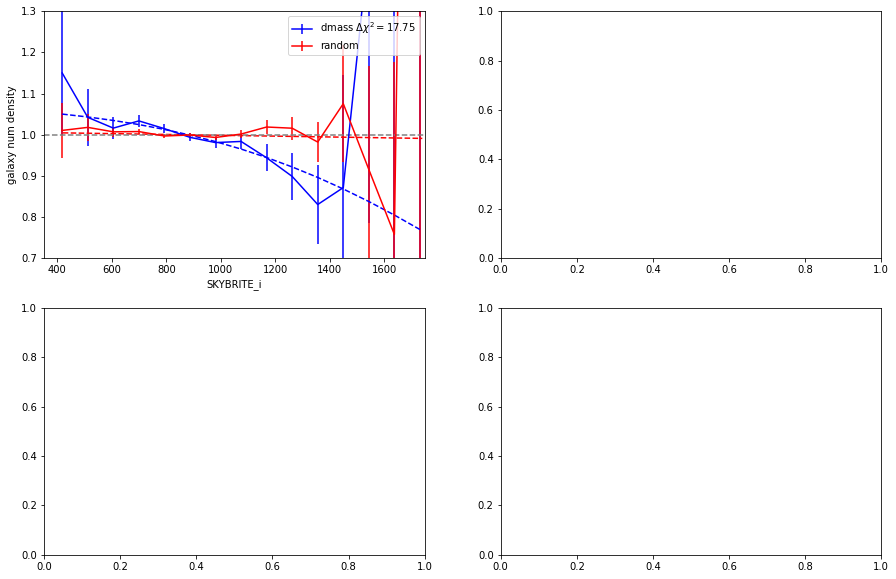

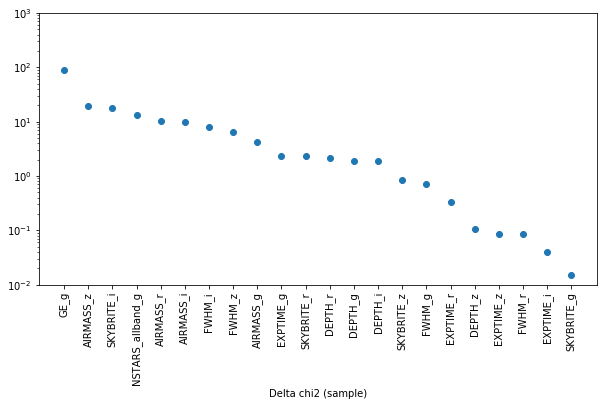

In [44]:
suffix = 'wg_fwhm_r'

filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)


In [45]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r']
suffix = 'wg_fwhm_r'
nextweight = 'AIRMASS_z'

----------------------------------
initialize function  AIRMASS_z
linear
108272
store weight  AIRMASS_z
save weight to fits ../data_txt/systematics/4th//weights/wg_airmass_z_SPT.fits
suffix =  wg_fwhm_r_airmass_z
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_g_SPT_wg_fwhm_r_airmass_z.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_r_SPT_wg_fwhm_r_airmass_z.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_i_SPT_wg_fwhm_r_airmass_z.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_z_SPT_wg_fwhm_r_airmass_z.txt
saving data to  ../data_txt/systematics/4th/systema

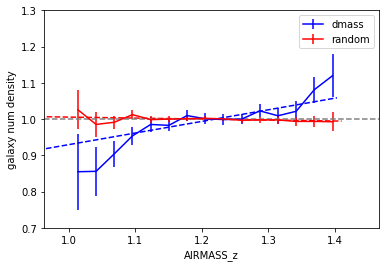

In [46]:
sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  7.467749086625962
chi2_mod. =  4.998430540634316
Delta chi2 (sample) = 2.469318545991646
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z.txt.model

chi2_null =  6.375981047629544
chi2_mod. =  2.7186743855950053
Delta chi2 (sample) = 3.657306662034539
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z.txt.model

chi2_null =  4.444543782289693
chi2_mod. =  2.532159840448956
Delta chi2 (sample) = 1.9123839418407371
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z.txt.model

chi2_null =  7.062997597765654
chi2_mod. =  6.584770665915236
Delta chi2 (sample) = 0.4782269318504184
output save to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z.txt.model

chi2_null =  7.742171483488454
chi2_mod. =  4.886267878559274
Delta chi2 (sample) = 2.8559036049291793
output save to  ../data_txt/systematics/4th/systematic_EXPTIME_g_SPT_wg_fwhm_r_airmass_z.txt.m

(['GE_g',
  'AIRMASS_i',
  'AIRMASS_r',
  'NSTARS_allband_g',
  'SKYBRITE_i',
  'AIRMASS_g',
  'FWHM_i',
  'FWHM_z',
  'DEPTH_r',
  'SKYBRITE_r',
  'EXPTIME_g',
  'DEPTH_g',
  'DEPTH_i',
  'SKYBRITE_z',
  'EXPTIME_r',
  'DEPTH_z',
  'AIRMASS_z',
  'FWHM_r',
  'FWHM_g',
  'SKYBRITE_g',
  'EXPTIME_z',
  'EXPTIME_i'],
 [100.5322252383604,
  29.736433781384395,
  28.304465983792475,
  24.995774469837833,
  24.874906867067974,
  13.613743417057542,
  9.952466455502194,
  4.554406208408695,
  3.657306662034539,
  3.651744413927612,
  2.8559036049291793,
  2.469318545991646,
  1.9123839418407371,
  1.1520579737377323,
  0.6654014109965019,
  0.4782269318504184,
  0.3841983704109708,
  0.2691192621408991,
  0.2649650796732015,
  0.19966221013810426,
  0.037021803717969703,
  0.0013381114397645888])

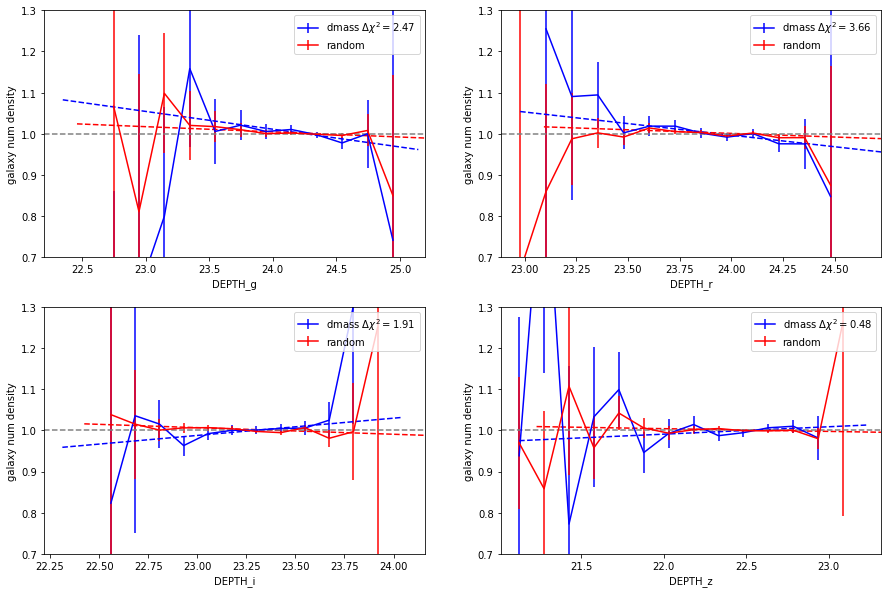

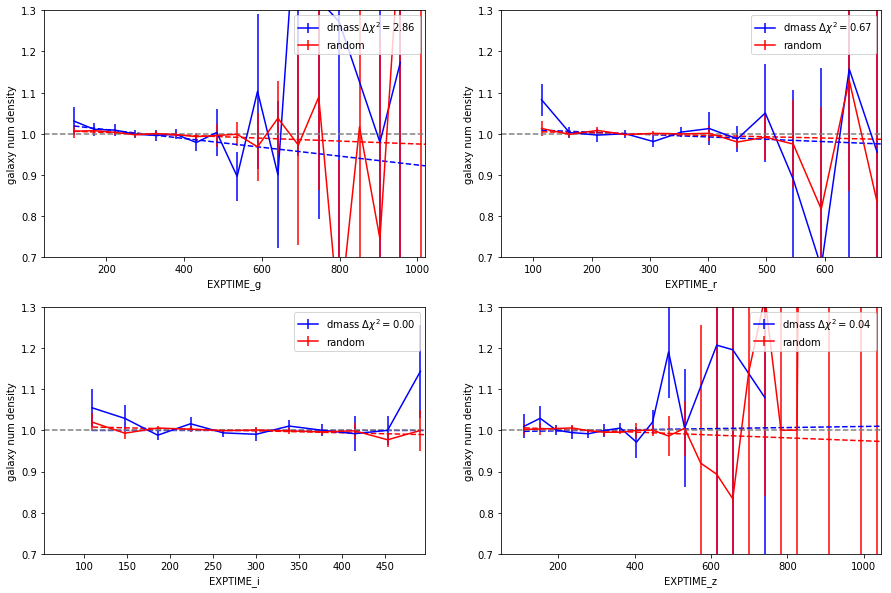

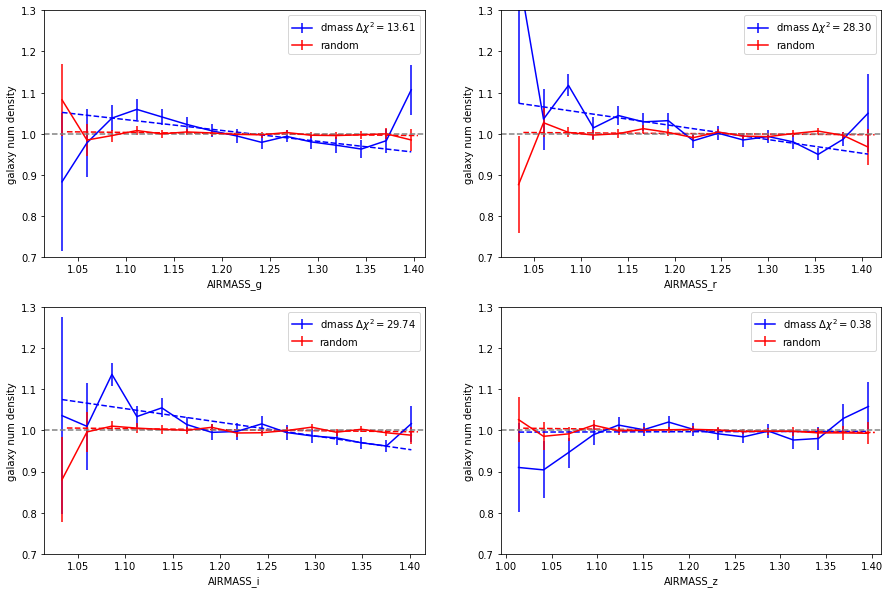

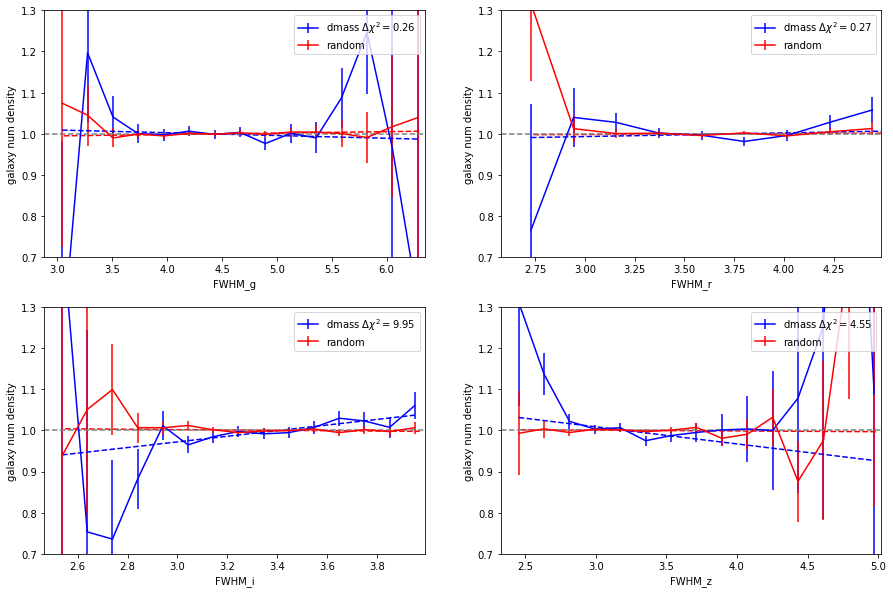

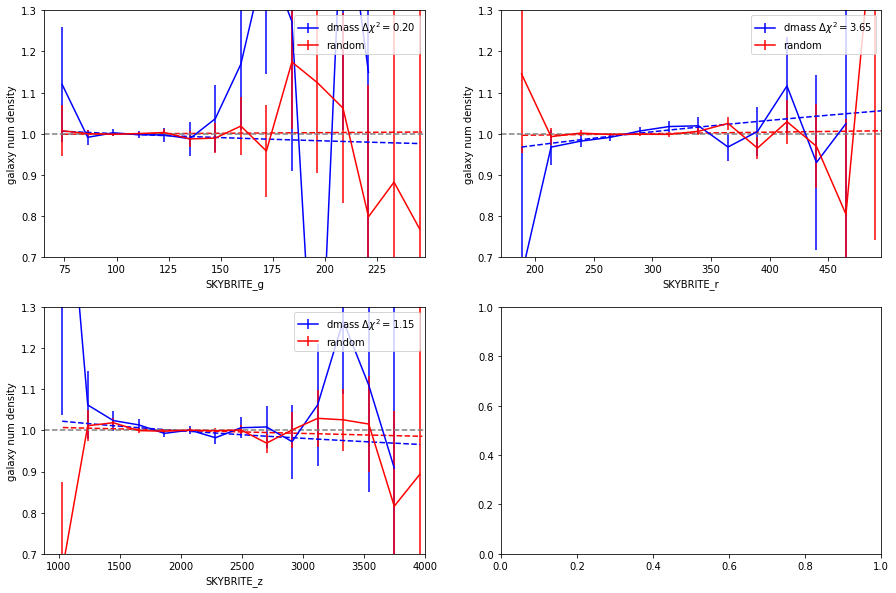

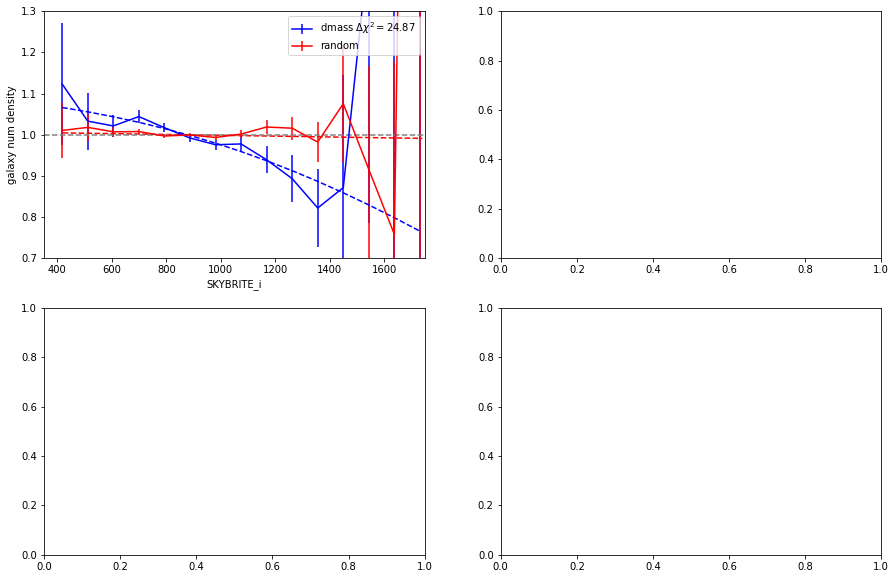

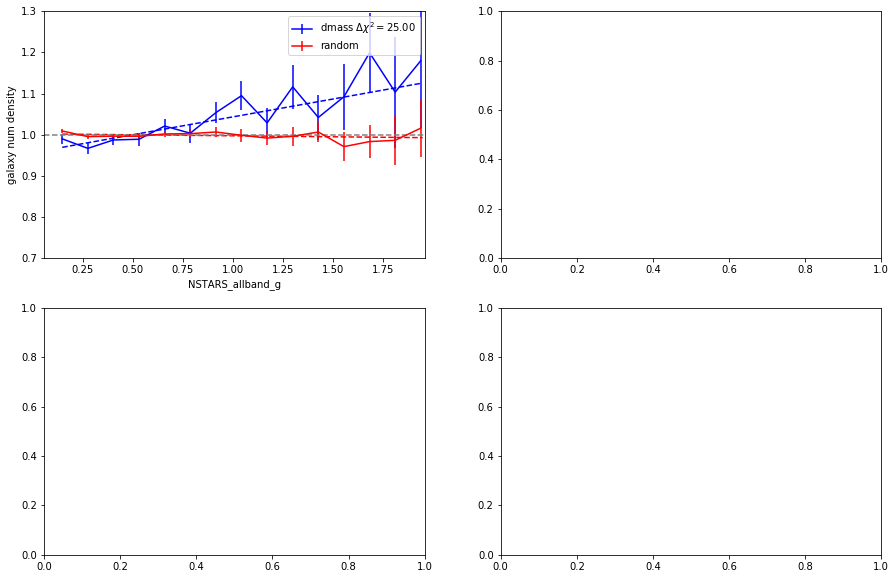

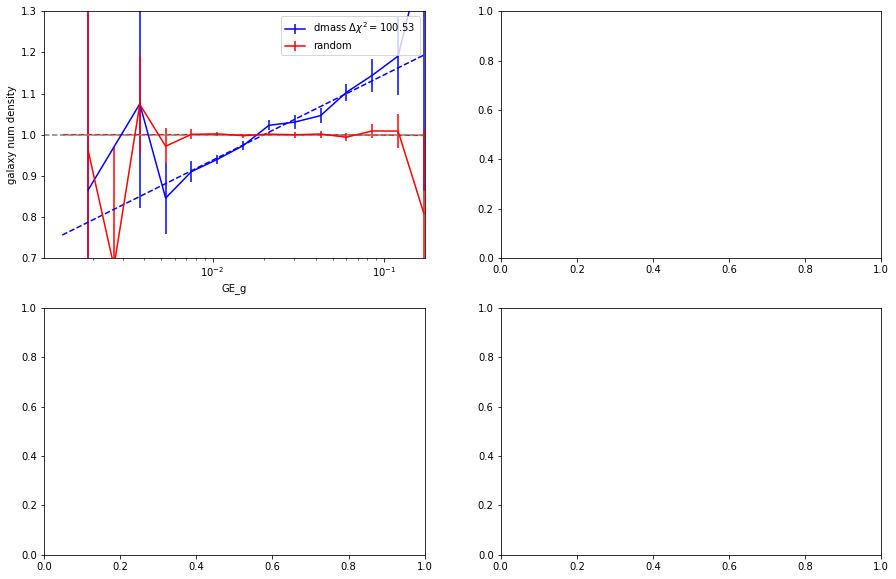

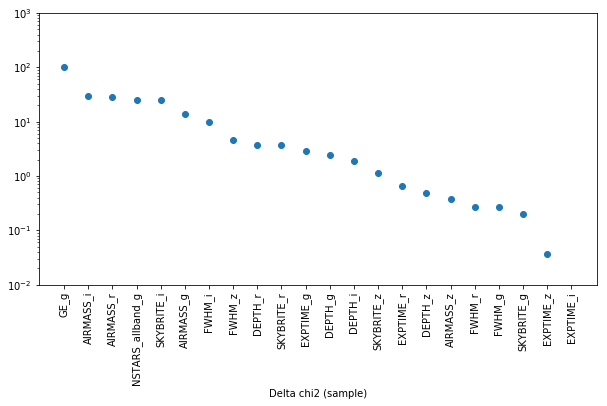

In [47]:
suffix = 'wg_fwhm_r_airmass_z'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)




----------------------------------
initialize function  AIRMASS_i
linear
108272
store weight  AIRMASS_i
save weight to fits ../data_txt/systematics/4th//weights/wg_airmass_i_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_g_SPT_wg_fwhm_r_airmass_z_airmass_i.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_r_SPT_wg_fwhm_r_airmass_z_airmass_i.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_i_SPT_wg_fwhm_r_airmass_z_airmass_i.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_z

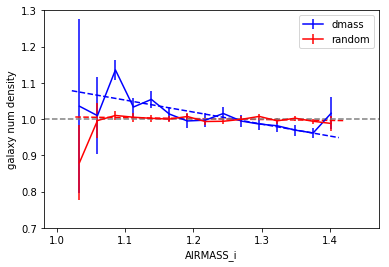

In [48]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z']
suffix = 'wg_fwhm_r_airmass_z'
nextweight = 'AIRMASS_i'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  5.709037169749803
chi2_mod. =  4.711461323618549
Delta chi2 (sample) = 0.9975758461312543
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i.txt.model

chi2_null =  4.416673173660439
chi2_mod. =  2.970759363196902
Delta chi2 (sample) = 1.4459138104635372
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i.txt.model

chi2_null =  3.0227048401784167
chi2_mod. =  2.423693047835566
Delta chi2 (sample) = 0.5990117923428508
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i.txt.model

chi2_null =  6.9249830960141
chi2_mod. =  6.826411141548885
Delta chi2 (sample) = 0.09857195446521505
output save to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i.txt.model

chi2_null =  5.8404646378961385
chi2_mod. =  4.8107683115672515
Delta chi2 (sample) = 1.029696326328887
output save to  ../data_txt/systematics/4th/systemat

(['GE_g',
  'NSTARS_allband_g',
  'SKYBRITE_i',
  'AIRMASS_z',
  'FWHM_i',
  'SKYBRITE_r',
  'FWHM_z',
  'FWHM_g',
  'DEPTH_r',
  'AIRMASS_r',
  'EXPTIME_g',
  'DEPTH_g',
  'SKYBRITE_g',
  'DEPTH_i',
  'EXPTIME_z',
  'AIRMASS_g',
  'SKYBRITE_z',
  'EXPTIME_i',
  'DEPTH_z',
  'EXPTIME_r',
  'FWHM_r',
  'AIRMASS_i'],
 [80.78269061136669,
  10.79355199126348,
  7.469460527627292,
  3.824340791628762,
  3.518333170435529,
  3.2510351678346936,
  2.3960857314838044,
  2.111065771906132,
  1.4459138104635372,
  1.345610423854529,
  1.029696326328887,
  0.9975758461312543,
  0.8592373996617333,
  0.5990117923428508,
  0.3866483586960836,
  0.2761508929600982,
  0.224615981301997,
  0.21162786935571276,
  0.09857195446521505,
  0.0720766920983209,
  0.01310642935287909,
  0.007293191144908562])

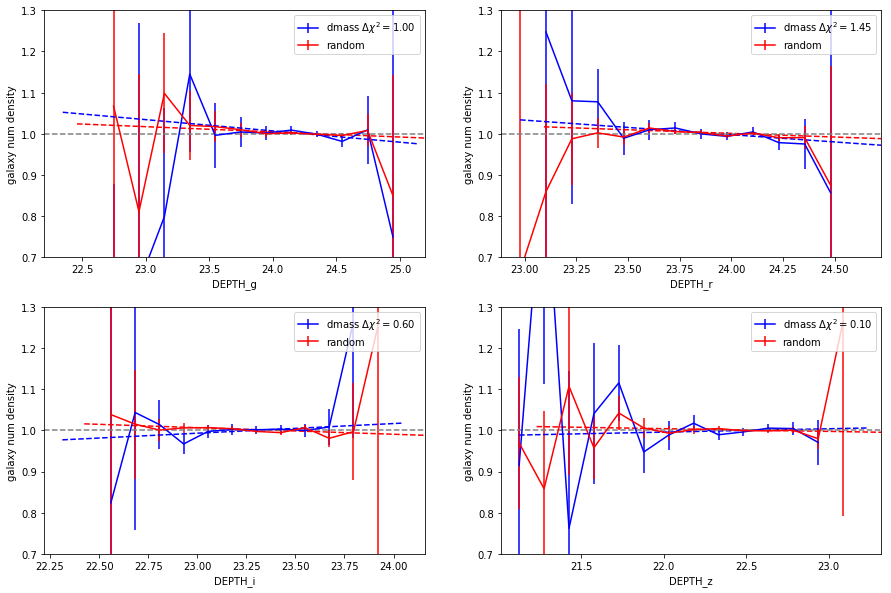

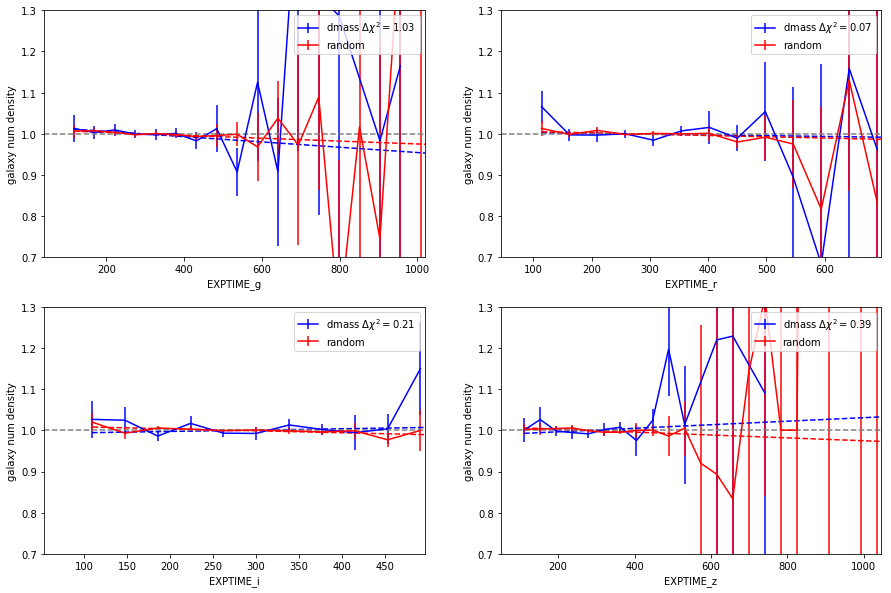

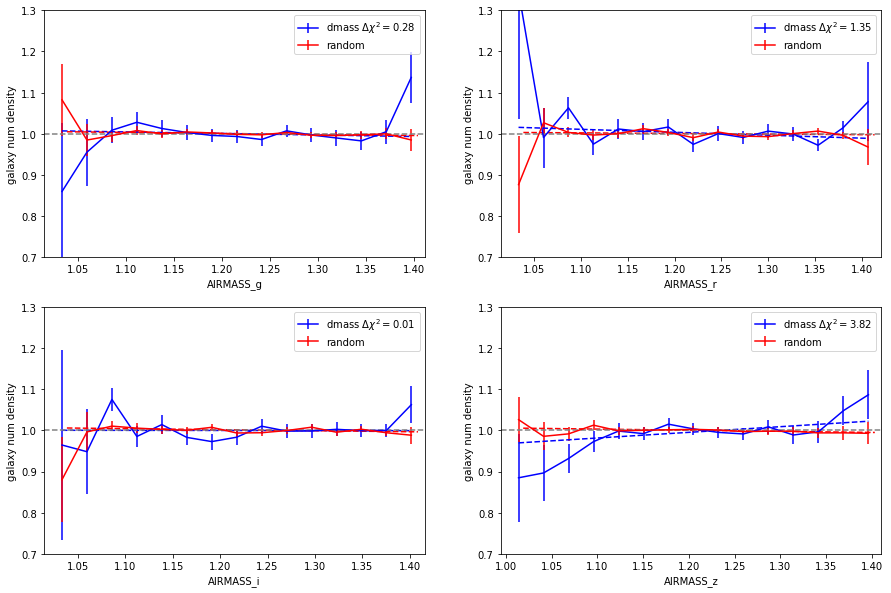

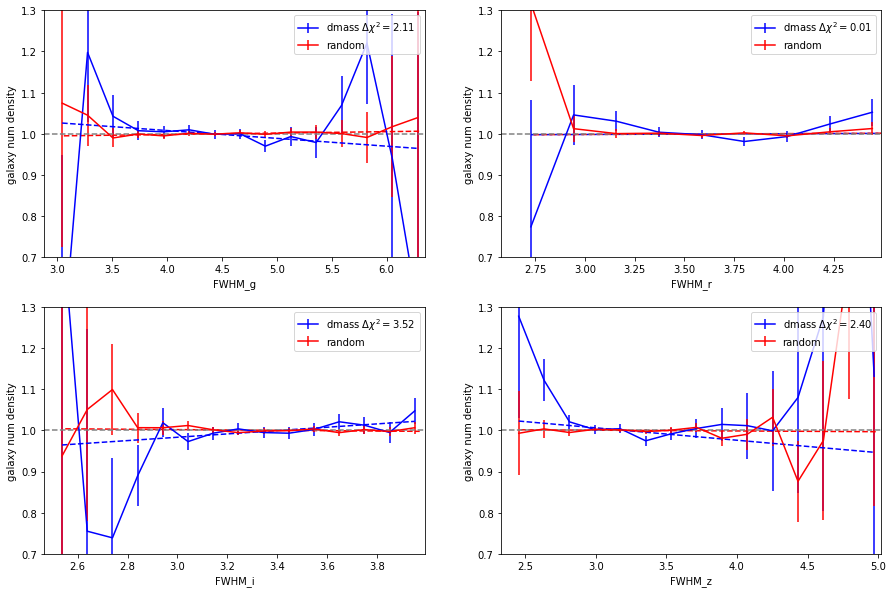

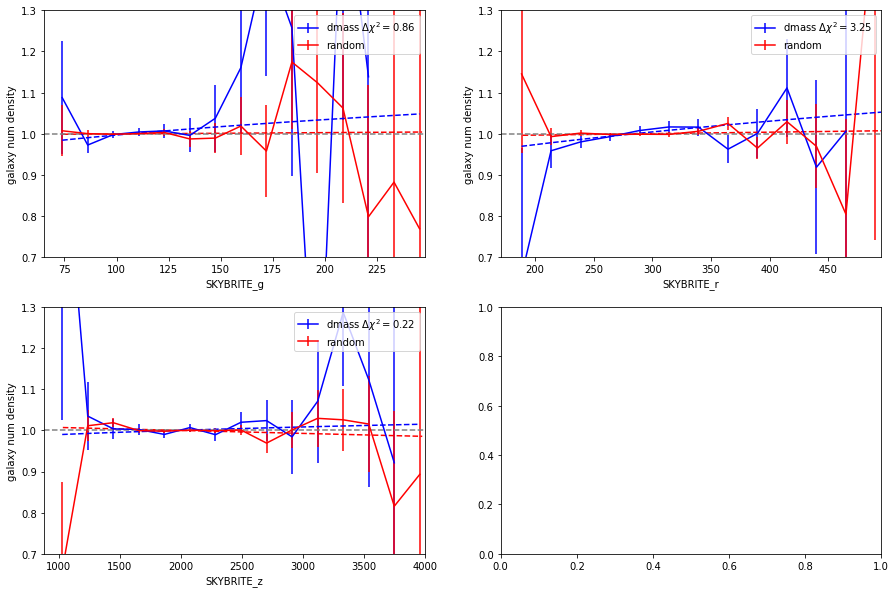

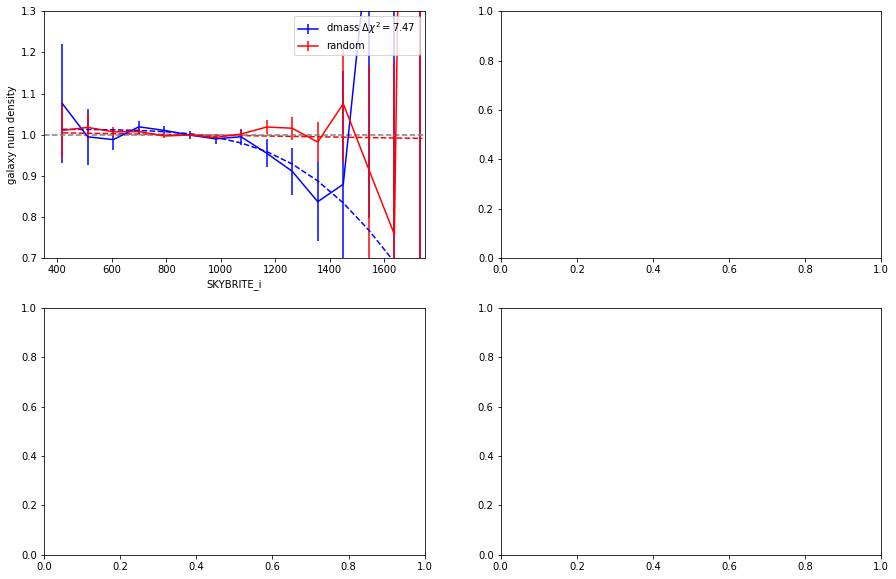

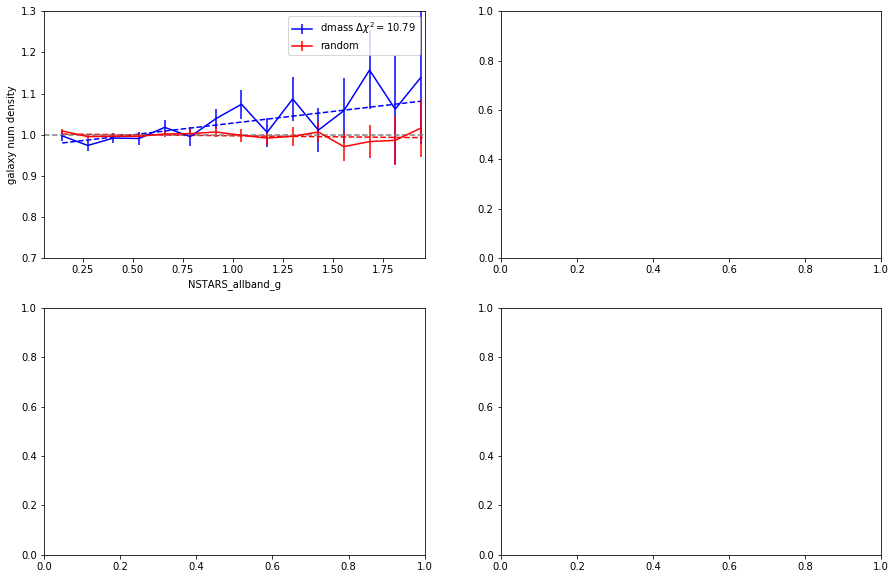

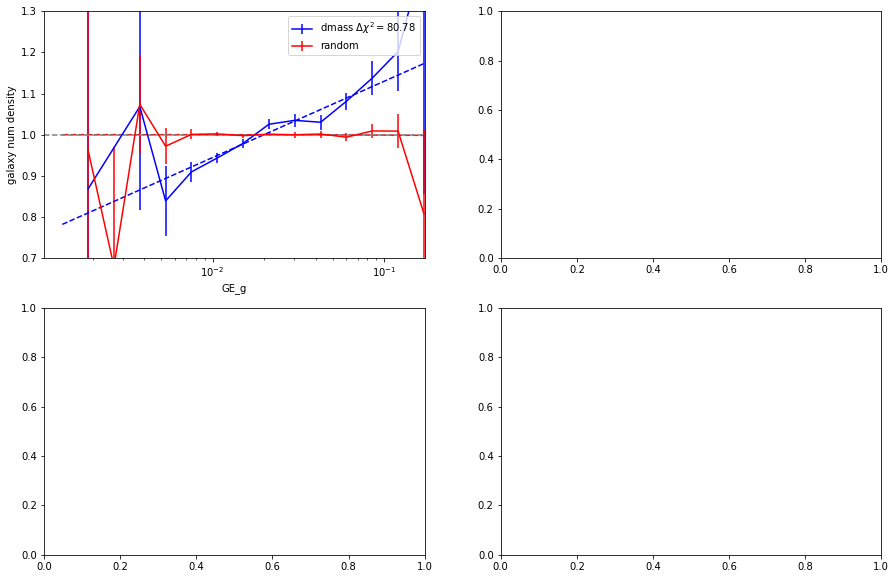

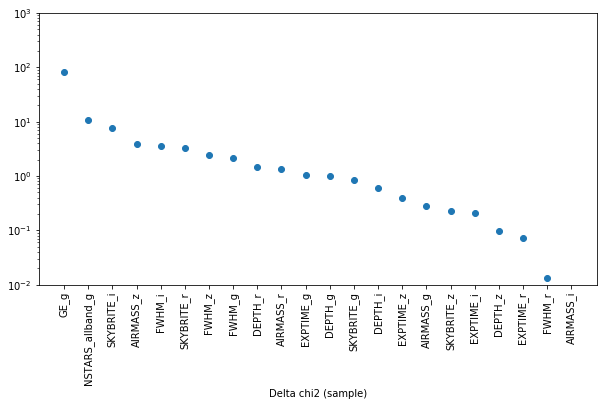

In [49]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)






In [50]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i']
suffix = 'wg_fwhm_r_airmass_z_airmass_i'
nextweight = 'SKYBRITE_i'

----------------------------------
initialize function  SKYBRITE_i
errftn
108272
store weight  SKYBRITE_i
save weight to fits ../data_txt/systematics/4th//weights/wg_skybrite_i_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_i_SPT_wg_fwhm_r_airmass_

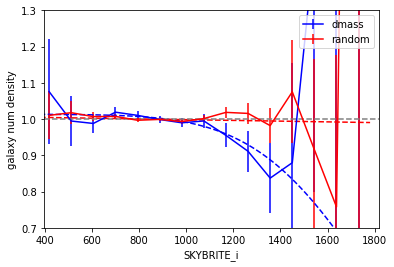

In [51]:
sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='errftn', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  5.79233605211583
chi2_mod. =  4.75831253945238
Delta chi2 (sample) = 1.0340235126634498
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i.txt.model

chi2_null =  4.77567780025624
chi2_mod. =  2.9890406708345303
Delta chi2 (sample) = 1.7866371294217096
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i.txt.model

chi2_null =  2.007653330604868
chi2_mod. =  1.9521949342734226
Delta chi2 (sample) = 0.055458396331445226
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i.txt.model

chi2_null =  6.710682429311009
chi2_mod. =  6.706273331549667
Delta chi2 (sample) = 0.004409097761342018
output save to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i.txt.model

chi2_null =  5.748058023089601
chi2_mod. =  4.841578072177041
Delta chi2 (sample) = 0.9064799509125594
output

(['GE_g',
  'NSTARS_allband_g',
  'SKYBRITE_r',
  'AIRMASS_z',
  'FWHM_g',
  'SKYBRITE_g',
  'FWHM_z',
  'DEPTH_r',
  'FWHM_i',
  'SKYBRITE_z',
  'DEPTH_g',
  'EXPTIME_g',
  'AIRMASS_i',
  'EXPTIME_z',
  'AIRMASS_r',
  'EXPTIME_i',
  'EXPTIME_r',
  'DEPTH_i',
  'FWHM_r',
  'DEPTH_z',
  'AIRMASS_g',
  'SKYBRITE_i'],
 [75.69584722381632,
  7.636821053053923,
  5.340052513085456,
  4.719727386177025,
  2.7809694986077176,
  2.320217579637742,
  1.897183868893757,
  1.7866371294217096,
  1.7003438391659147,
  1.0798651128334038,
  1.0340235126634498,
  0.9064799509125594,
  0.7145211732681584,
  0.3391203186356826,
  0.13942083225065183,
  0.130092287786999,
  0.10046998724777012,
  0.055458396331445226,
  0.05012346128173206,
  0.004409097761342018,
  0.003123186996370819,
  0.001302935230711455])

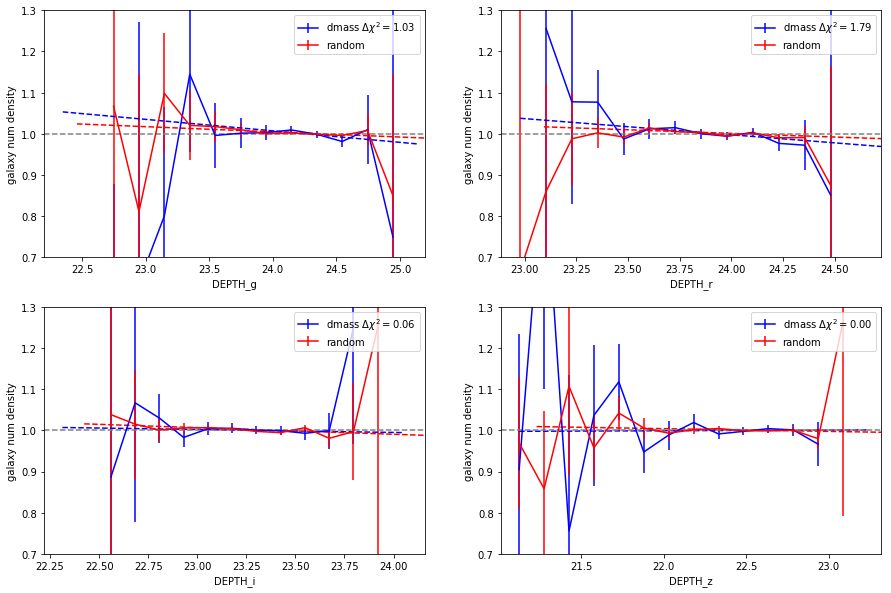

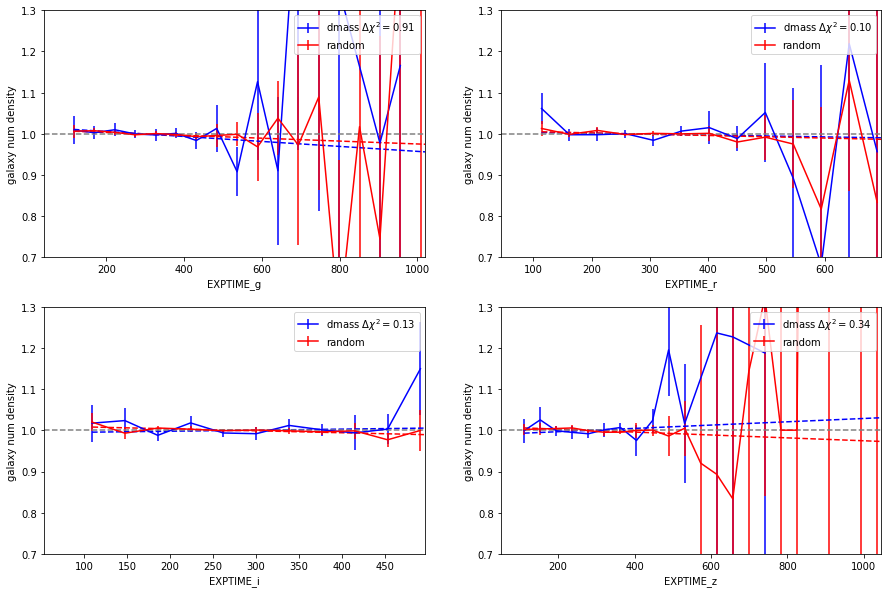

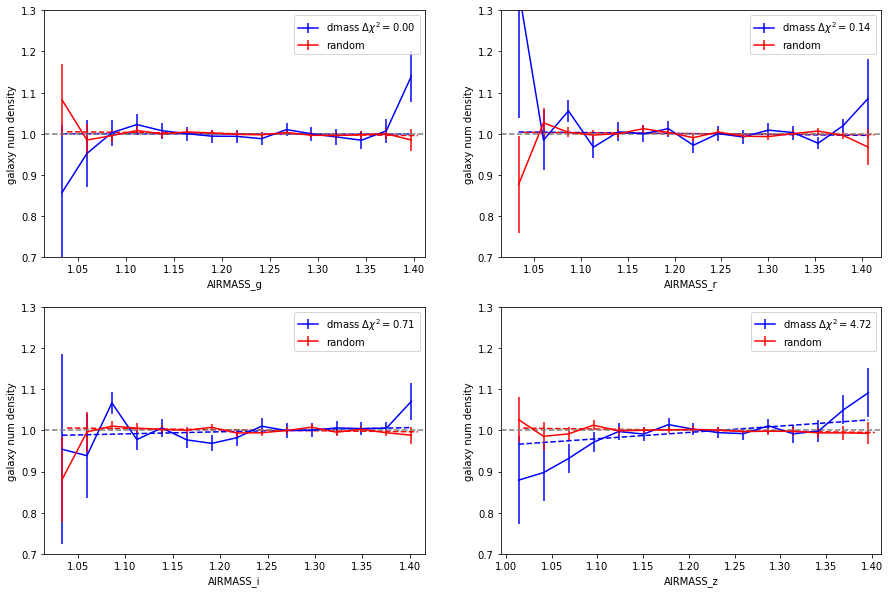

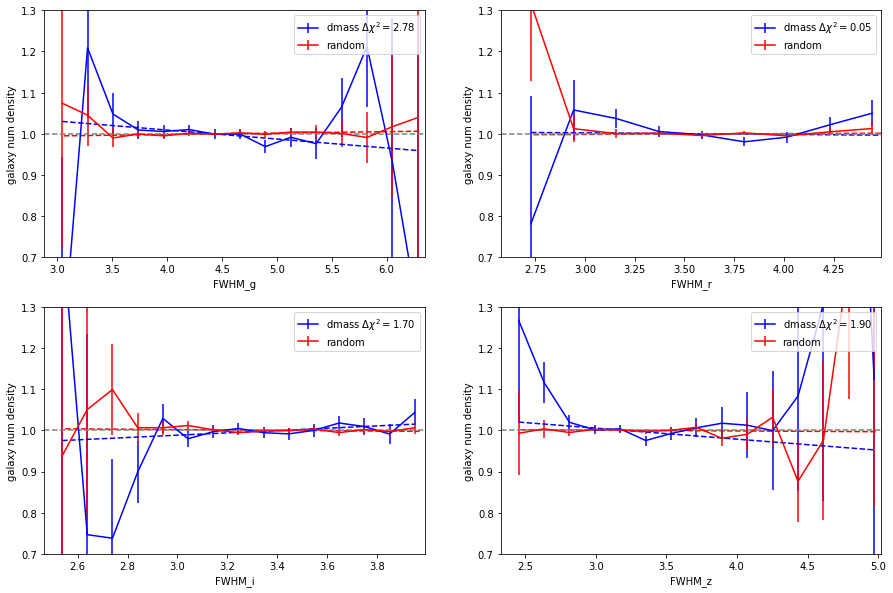

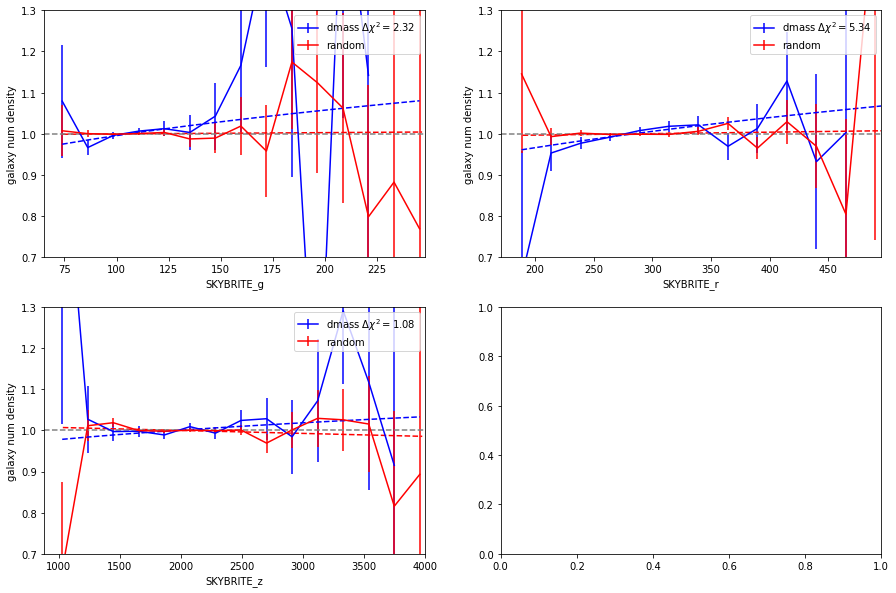

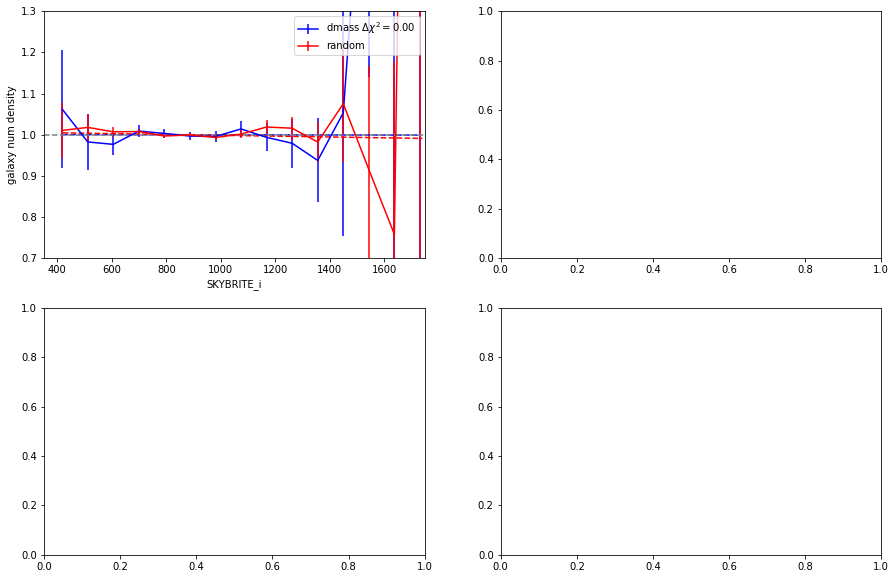

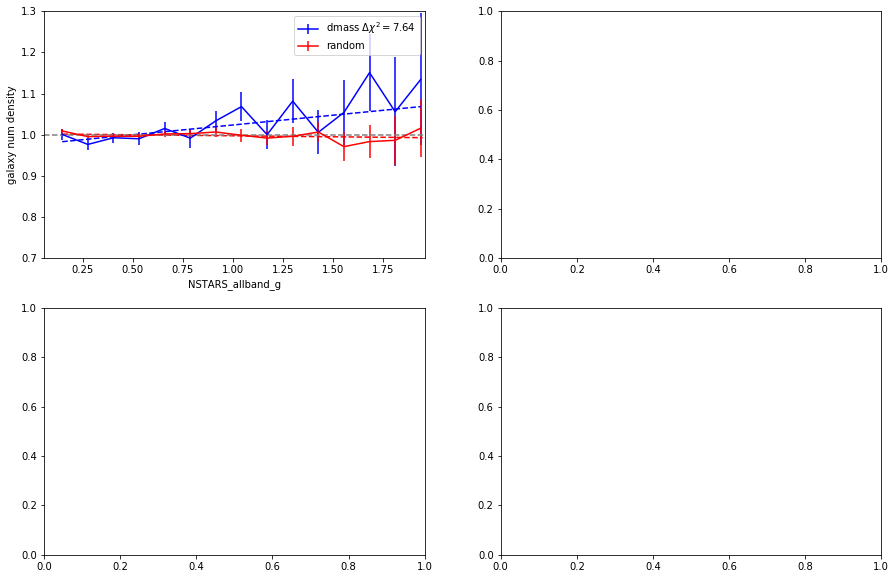

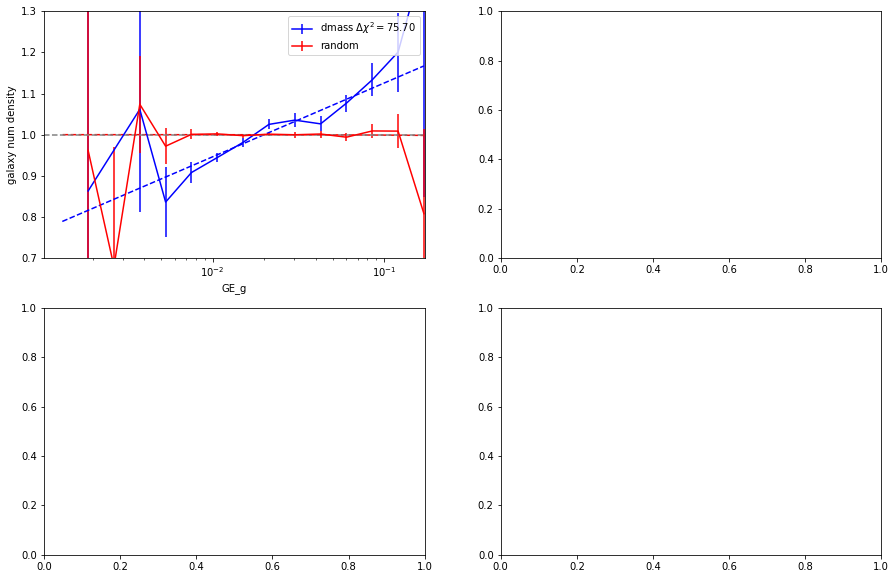

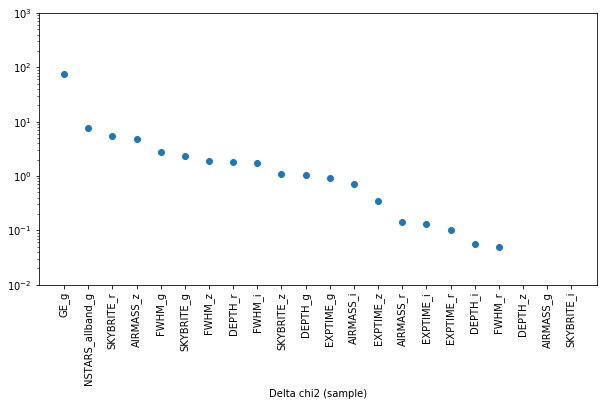

In [52]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)


----------------------------------
initialize function  SKYBRITE_r
linear
108272
store weight  SKYBRITE_r
save weight to fits ../data_txt/systematics/4th//weights/wg_skybrite_r_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r.txt
saving dat

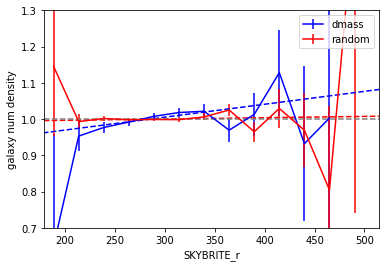

In [57]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] *\
* weightDic['AIRMASS_i']*weightDic['SKYBRITE_i']
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i'
nextweight = 'SKYBRITE_r'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  6.538791622006795
chi2_mod. =  5.110042158900722
Delta chi2 (sample) = 1.4287494631060733
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r.txt.model

chi2_null =  3.6487304826394986
chi2_mod. =  2.4764404096261847
Delta chi2 (sample) = 1.172290073013314
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r.txt.model

chi2_null =  3.0520078246655293
chi2_mod. =  2.182438319587898
Delta chi2 (sample) = 0.8695695050776315
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r.txt.model

chi2_null =  6.928305809315397
chi2_mod. =  6.384840677889118
Delta chi2 (sample) = 0.5434651314262791
output save to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r.txt.model

chi2_null =  6.932046122187085
chi2_mod. =  4.86591128038345
Delta

(['GE_g',
  'AIRMASS_r',
  'AIRMASS_i',
  'NSTARS_allband_g',
  'SKYBRITE_i',
  'AIRMASS_g',
  'FWHM_i',
  'FWHM_z',
  'EXPTIME_g',
  'DEPTH_g',
  'DEPTH_r',
  'FWHM_g',
  'DEPTH_i',
  'DEPTH_z',
  'SKYBRITE_z',
  'AIRMASS_z',
  'EXPTIME_r',
  'FWHM_r',
  'SKYBRITE_g',
  'EXPTIME_z',
  'EXPTIME_i',
  'SKYBRITE_r'],
 [92.48297203489511,
  21.37855975570612,
  19.97294402627808,
  19.230046670186717,
  10.171196049849891,
  9.280653943763012,
  6.466007003482265,
  4.3408350673691505,
  2.0661348418036347,
  1.4287494631060733,
  1.172290073013314,
  0.9761513598972726,
  0.8695695050776315,
  0.5434651314262791,
  0.504627986688889,
  0.4407135475108568,
  0.34361598825847484,
  0.2850945605954429,
  0.2847439033533661,
  0.14529471131231997,
  0.04014990679595343,
  0.03614436571561441])

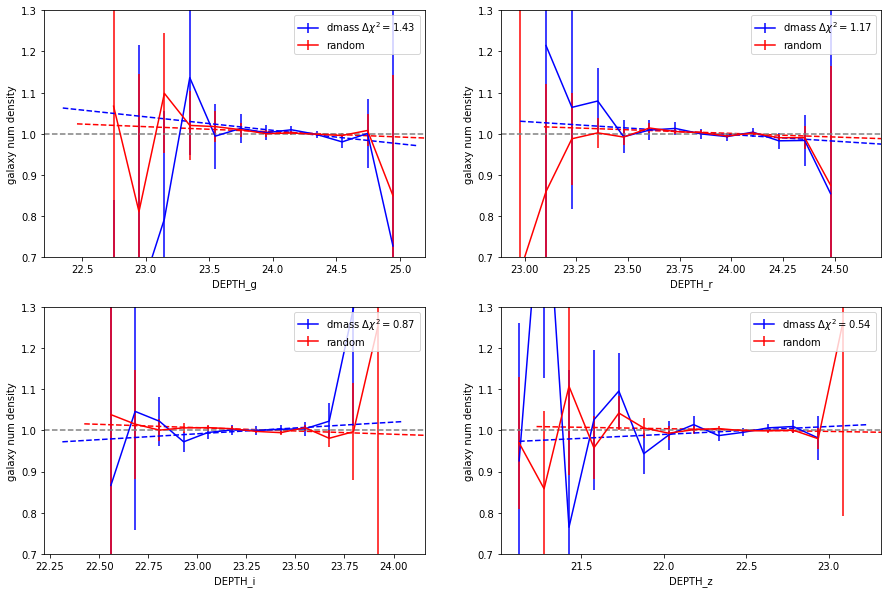

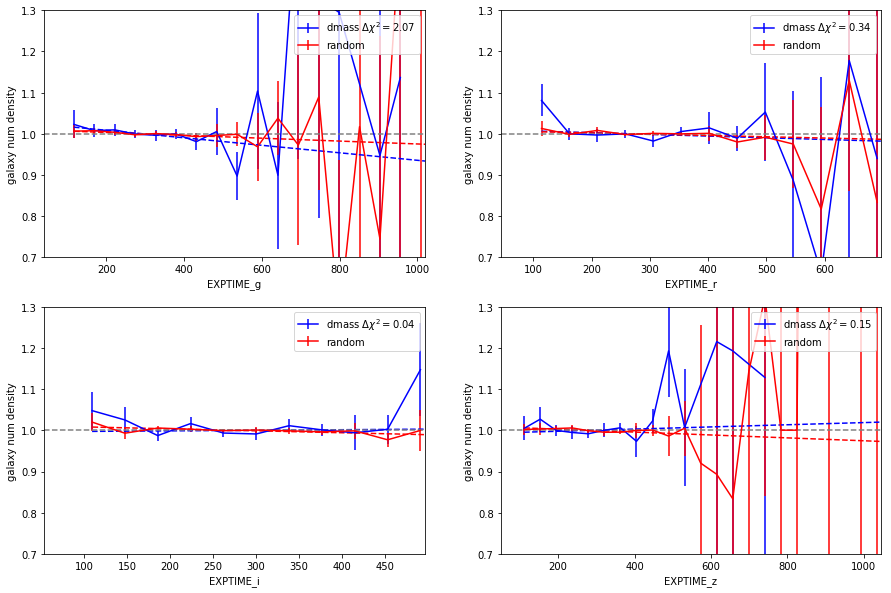

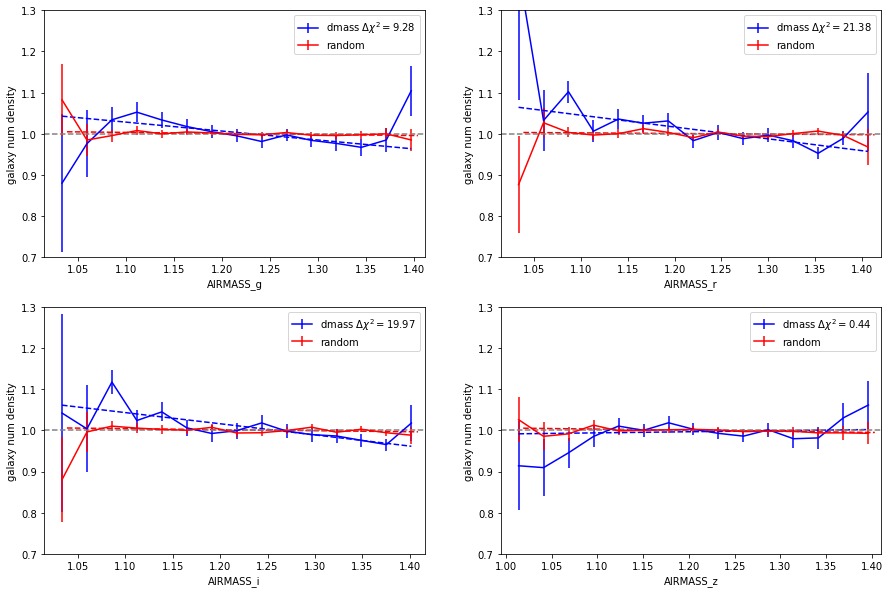

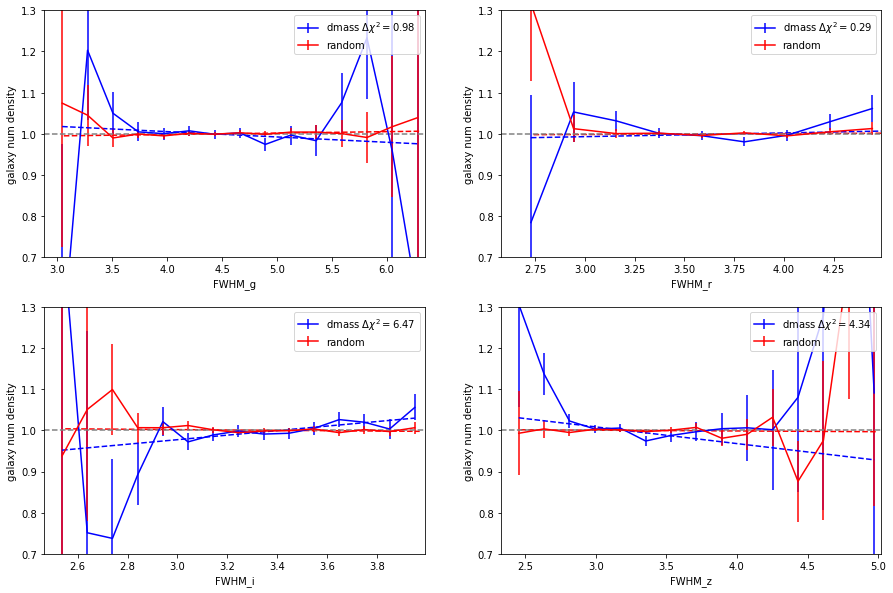

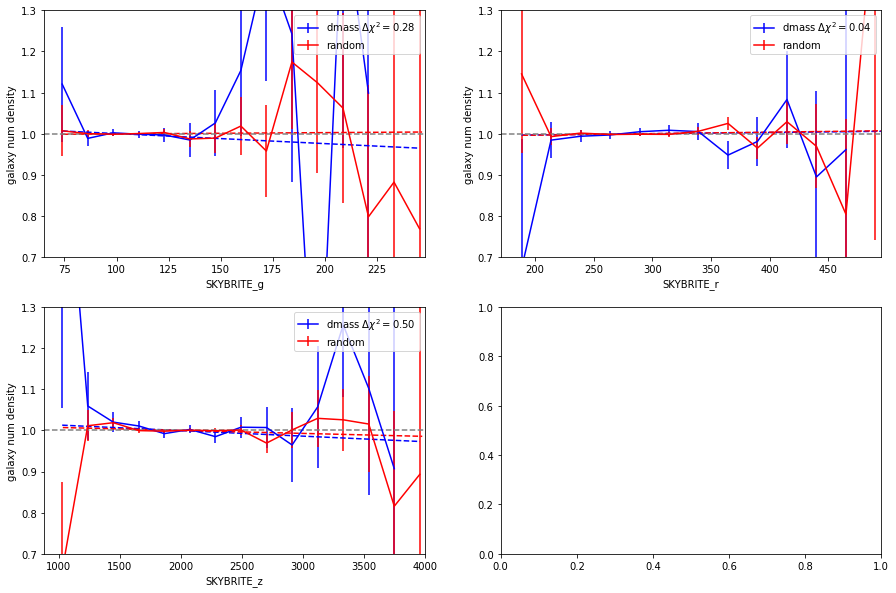

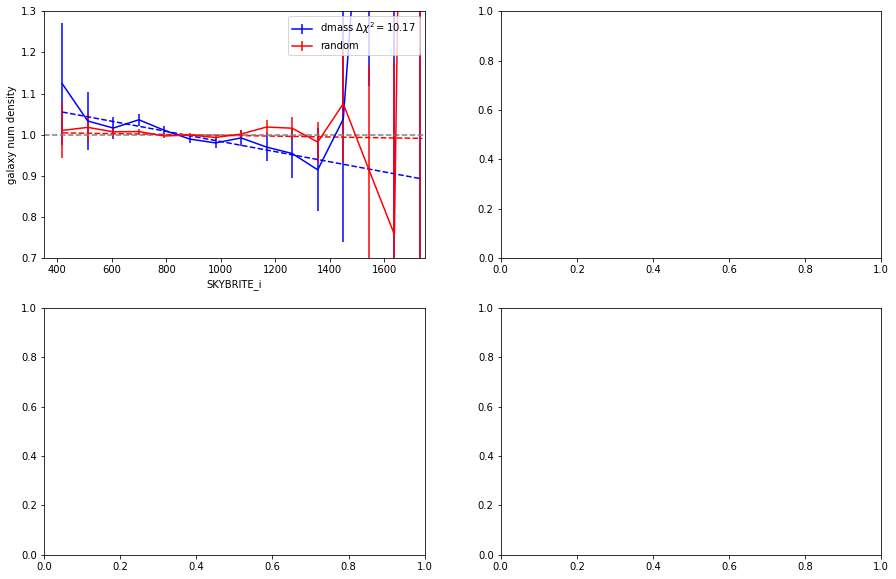

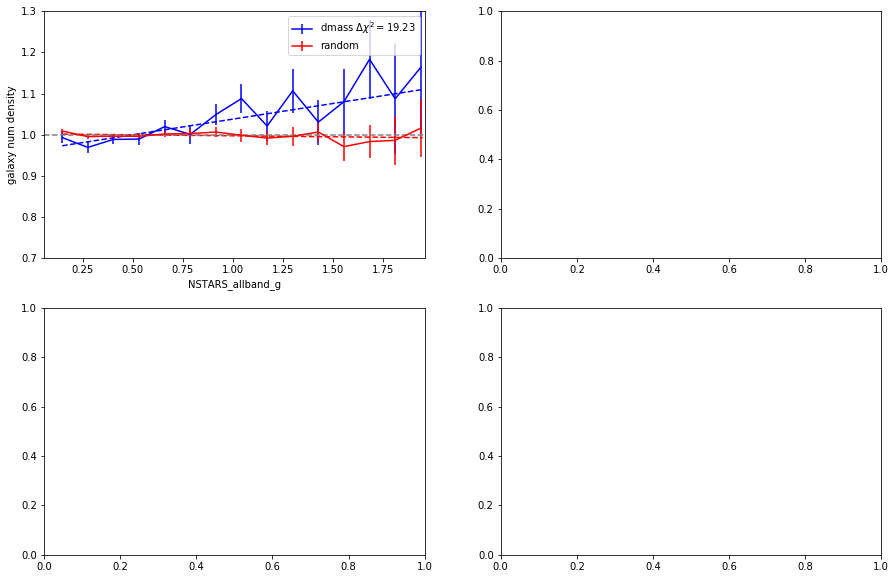

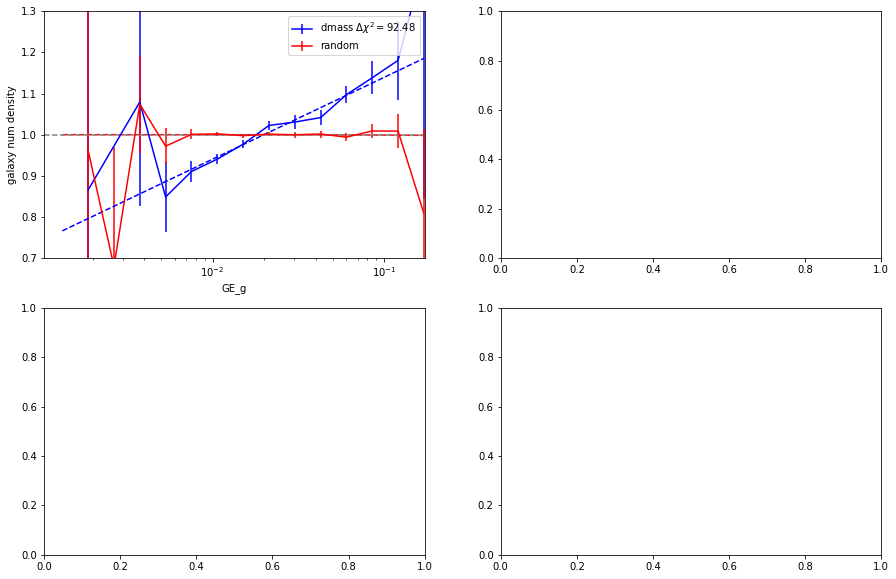

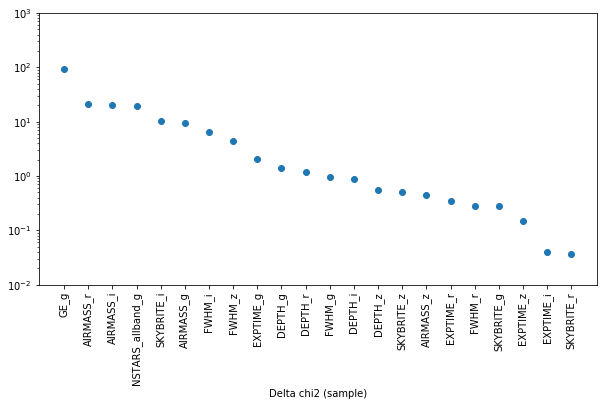

In [62]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)



In [60]:
suffix

'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r'

----------------------------------
initialize function  AIRMASS_r
linear
108272
store weight  AIRMASS_r
save weight to fits ../data_txt/systematics/4th//weights/wg_airmass_r_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_r_SPT_wg_fwhm_r

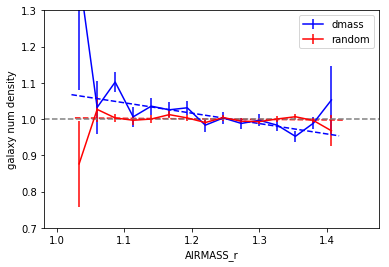

In [63]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i'] *\
* weightDic['SKYBRITE_i'] * weightDic['SKYBRITE_r'] 
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r'
nextweight = 'AIRMASS_r'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  4.659773170548106
chi2_mod. =  4.602996371724819
Delta chi2 (sample) = 0.05677679882328679
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r.txt.model

chi2_null =  3.112696578795147
chi2_mod. =  3.1007859118492016
Delta chi2 (sample) = 0.011910666945945447
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r.txt.model

chi2_null =  3.525165552529197
chi2_mod. =  2.6410326326990146
Delta chi2 (sample) = 0.8841329198301824
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r.txt.model

chi2_null =  7.329651555701717
chi2_mod. =  7.223762275904415
Delta chi2 (sample) = 0.10588927979730212
output save to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r.txt.model

chi2_null =  5.1523895

(['GE_g',
  'AIRMASS_i',
  'AIRMASS_z',
  'AIRMASS_r',
  'AIRMASS_g',
  'FWHM_g',
  'SKYBRITE_i',
  'NSTARS_allband_g',
  'SKYBRITE_z',
  'SKYBRITE_g',
  'EXPTIME_z',
  'FWHM_i',
  'EXPTIME_i',
  'FWHM_z',
  'DEPTH_i',
  'EXPTIME_r',
  'EXPTIME_g',
  'DEPTH_z',
  'FWHM_r',
  'DEPTH_g',
  'DEPTH_r',
  'SKYBRITE_r'],
 [62.511820244742275,
  12.428351557023625,
  10.875926919699342,
  10.678542941057403,
  6.215332806154191,
  5.862860262512973,
  3.757579446330774,
  3.070814654675363,
  2.003111128370481,
  1.9621571763461922,
  1.4990363115814374,
  1.4509695708044932,
  1.2535513988301554,
  1.0841341542359029,
  0.8841329198301824,
  0.15905620412631993,
  0.11232978239228597,
  0.10588927979730212,
  0.07654557364092085,
  0.05677679882328679,
  0.011910666945945447,
  0.00269864239680917])

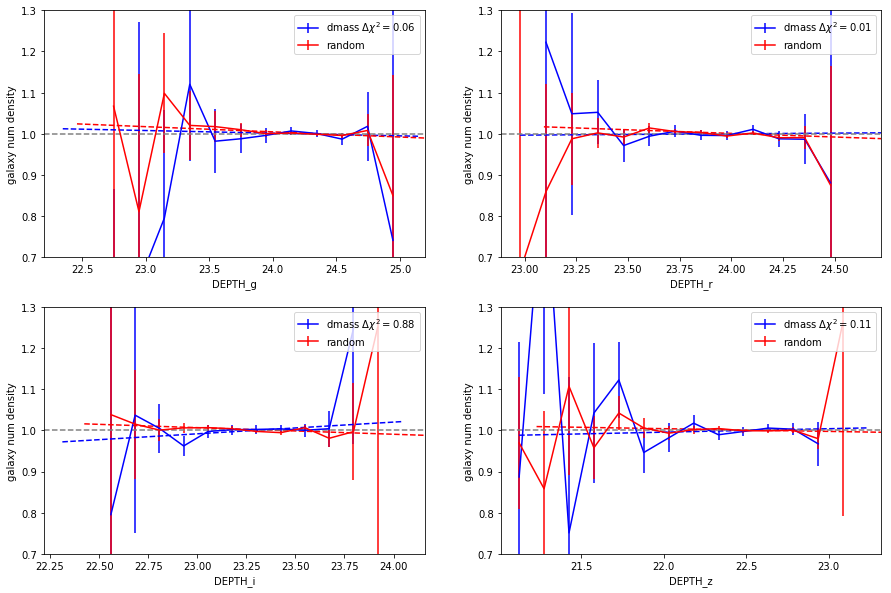

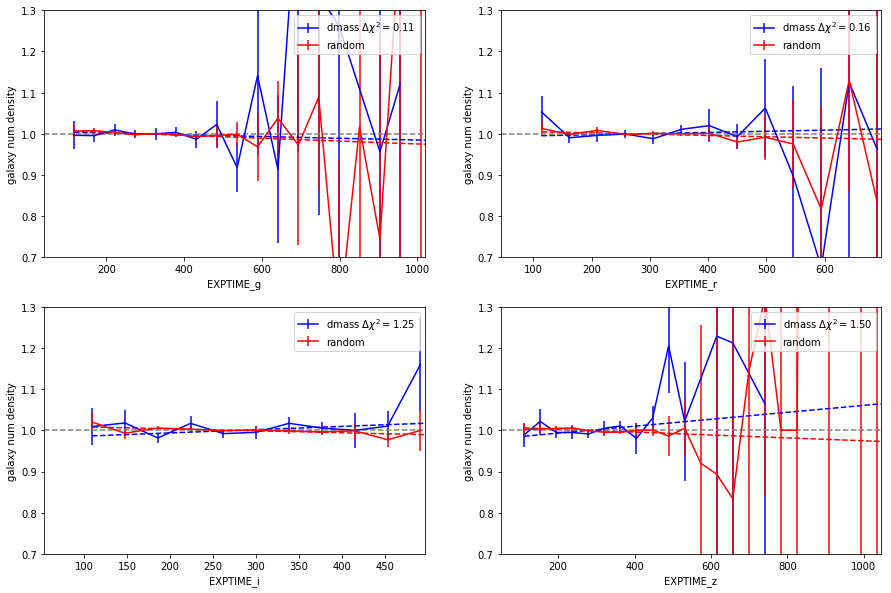

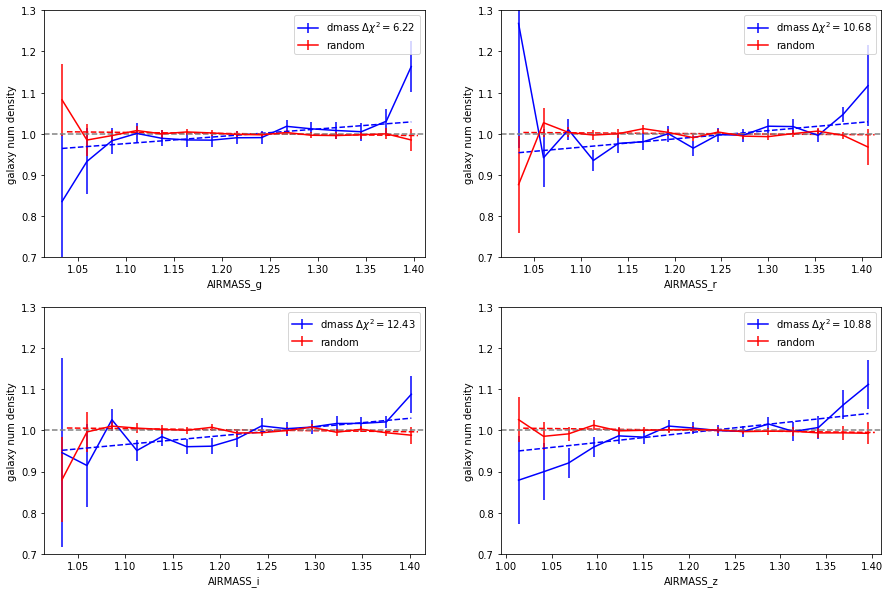

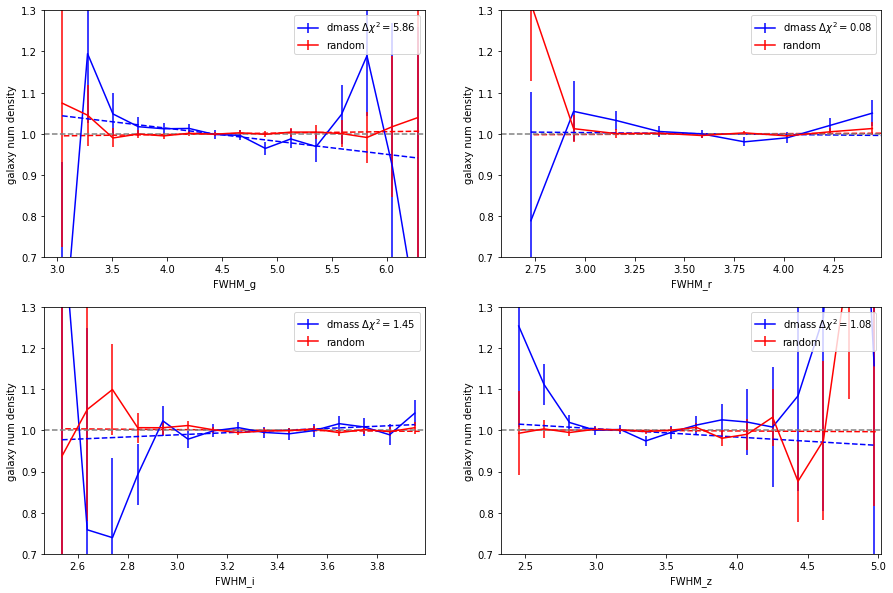

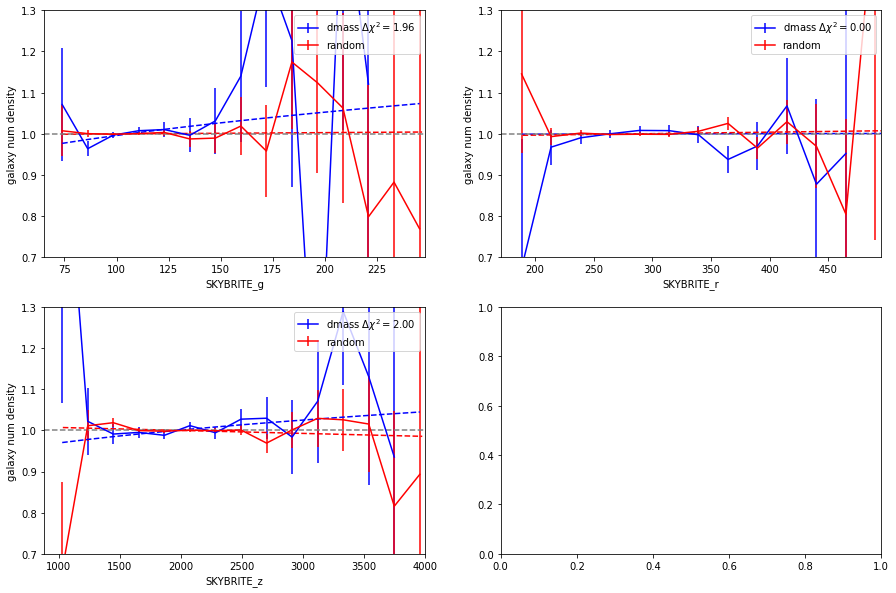

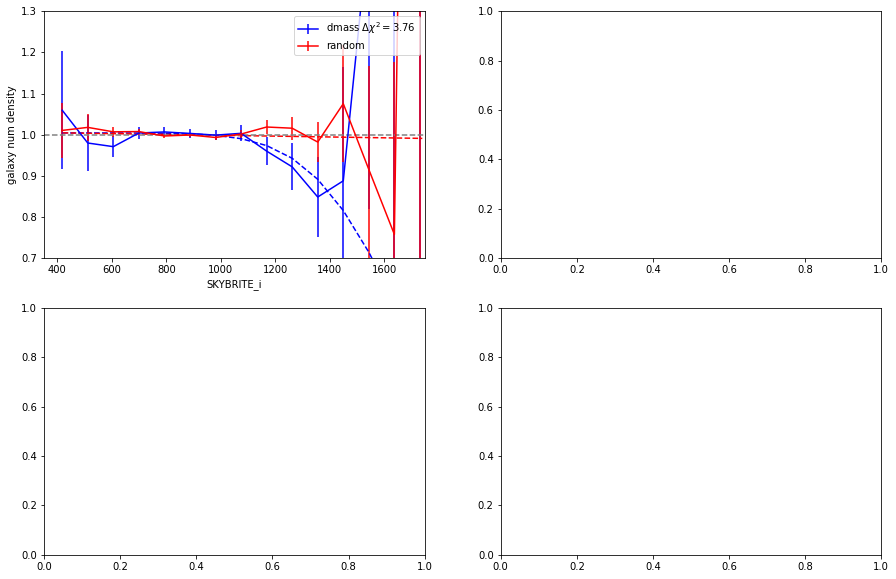

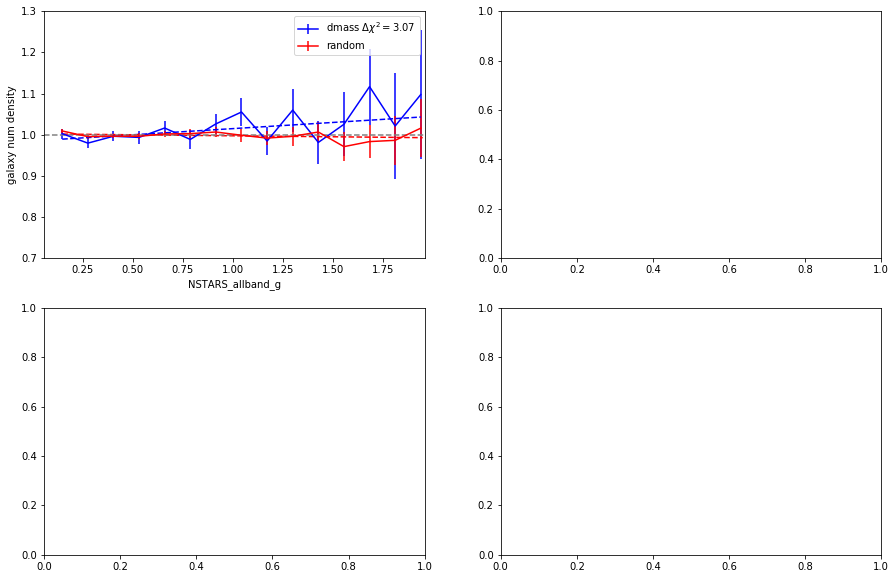

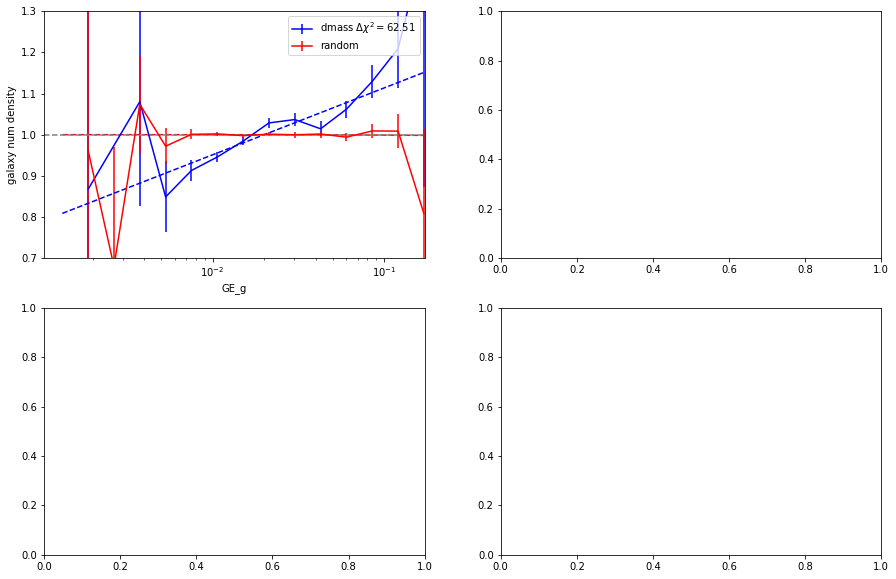

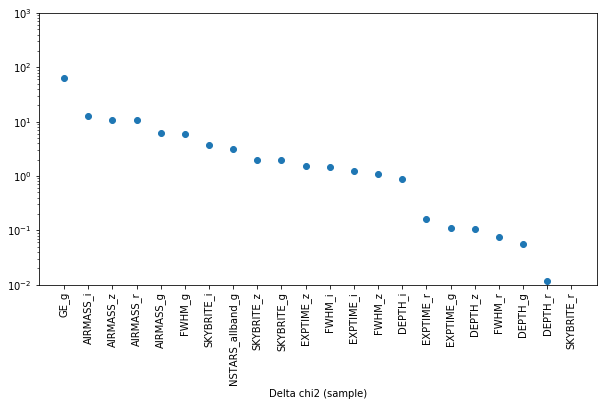

In [64]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)




In [65]:
suffix

'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r'

----------------------------------
initialize function  AIRMASS_g
linear
108272
store weight  AIRMASS_g
save weight to fits ../data_txt/systematics/4th//weights/wg_airmass_g_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g.txt
saving data to  ../data_txt/systematics/4th/systematic_EXPTIME_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g.txt
saving data to  ..

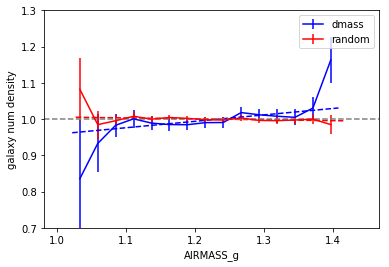

In [66]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i'] *\
* weightDic['SKYBRITE_i']* weightDic['SKYBRITE_r']  * weightDic['AIRMASS_r'] 
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r'
nextweight = 'AIRMASS_g'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  4.572689806862009
chi2_mod. =  4.538955927852669
Delta chi2 (sample) = 0.03373387900933977
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g.txt.model

chi2_null =  2.8336573949369943
chi2_mod. =  2.812088104086565
Delta chi2 (sample) = 0.021569290850429468
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g.txt.model

chi2_null =  3.5153666516304716
chi2_mod. =  2.4621218991317866
Delta chi2 (sample) = 1.053244752498685
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g.txt.model

chi2_null =  7.515567062458323
chi2_mod. =  7.218994229737263
Delta chi2 (sample) = 0.2965728327210595
output save to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airm

(['GE_g',
  'AIRMASS_z',
  'SKYBRITE_i',
  'NSTARS_allband_g',
  'AIRMASS_i',
  'FWHM_g',
  'AIRMASS_r',
  'FWHM_i',
  'FWHM_z',
  'EXPTIME_z',
  'DEPTH_i',
  'SKYBRITE_z',
  'EXPTIME_i',
  'SKYBRITE_g',
  'DEPTH_z',
  'EXPTIME_g',
  'EXPTIME_r',
  'DEPTH_g',
  'DEPTH_r',
  'SKYBRITE_r',
  'FWHM_r',
  'AIRMASS_g'],
 [64.56257514937488,
  7.351252629136365,
  5.082467565185495,
  4.451247871875724,
  4.4145477715932895,
  3.3229637455033423,
  2.815759393710186,
  2.1369067525172074,
  1.6196529775224615,
  1.35370766399258,
  1.053244752498685,
  0.8674123572969474,
  0.7886115374548206,
  0.3341561652126579,
  0.2965728327210595,
  0.21794375423546164,
  0.035678167824249485,
  0.03373387900933977,
  0.021569290850429468,
  0.019020903395462696,
  0.0047519234841271185,
  0.0016657253242033931])

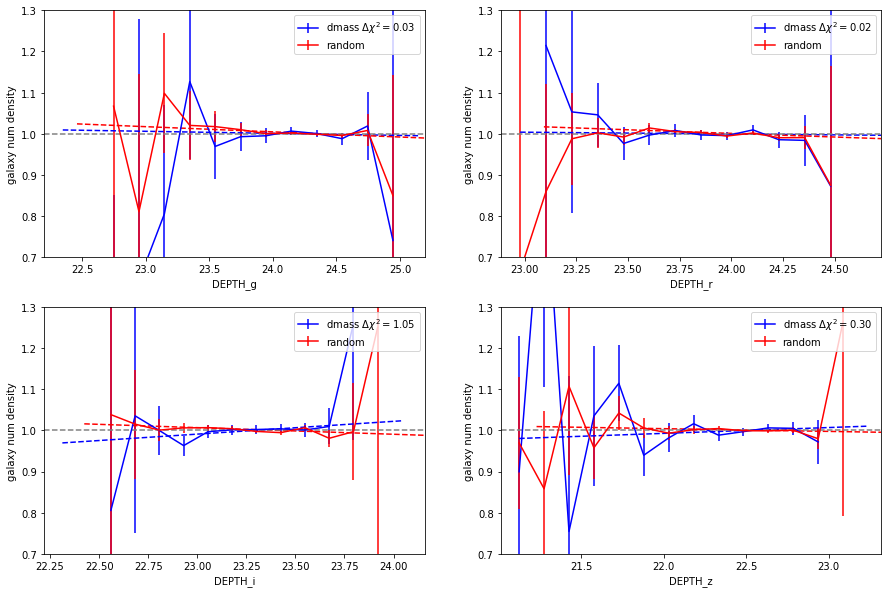

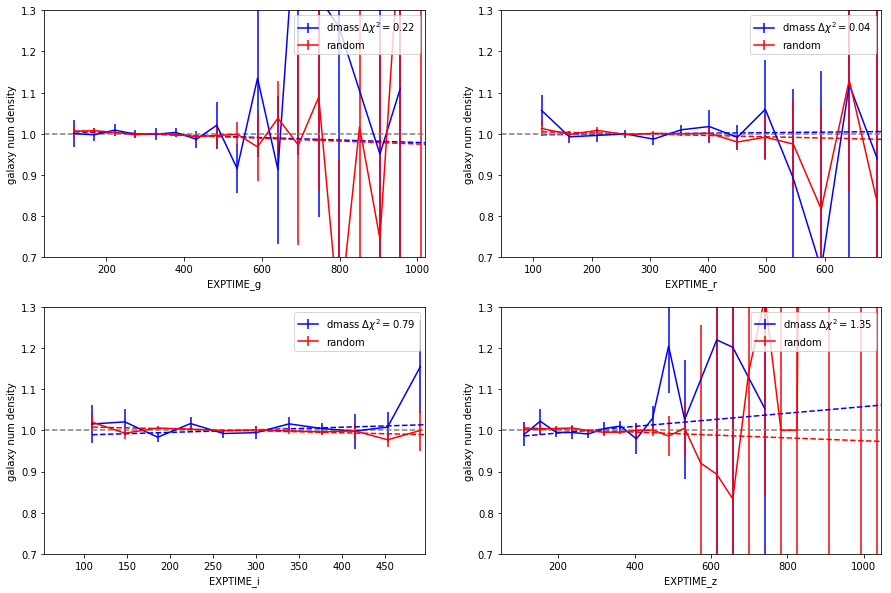

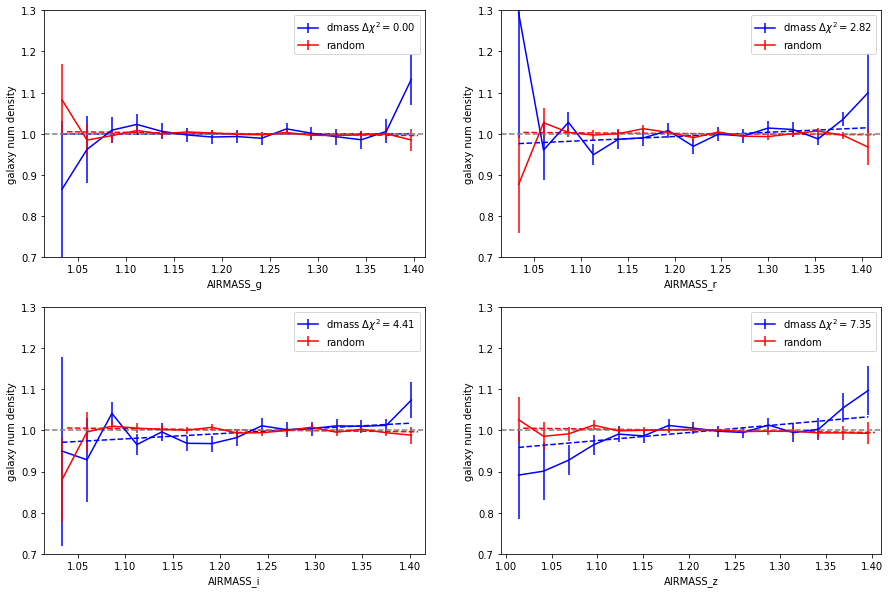

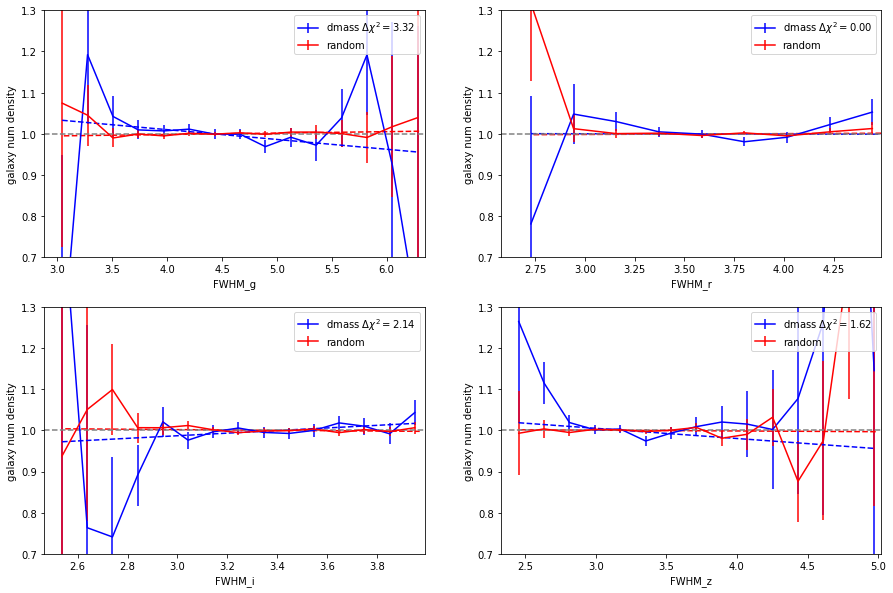

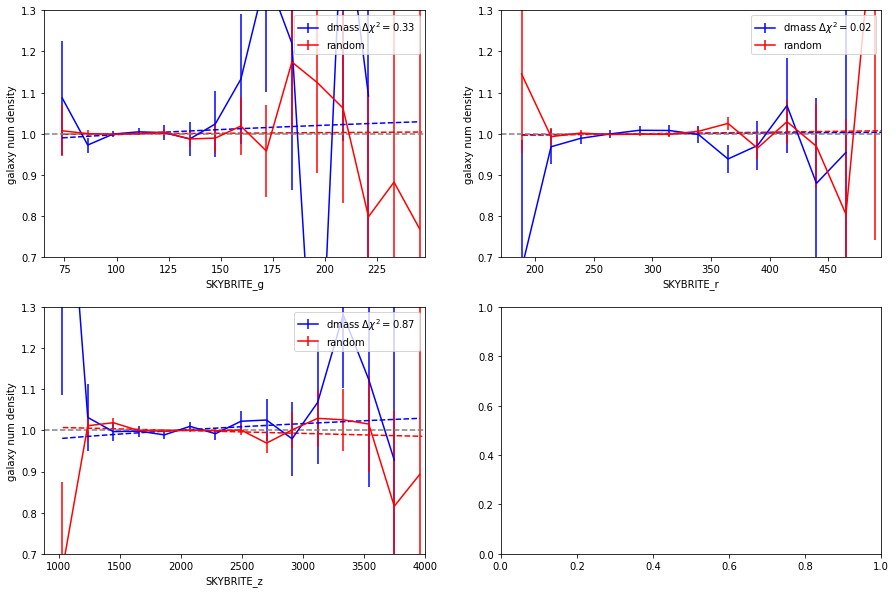

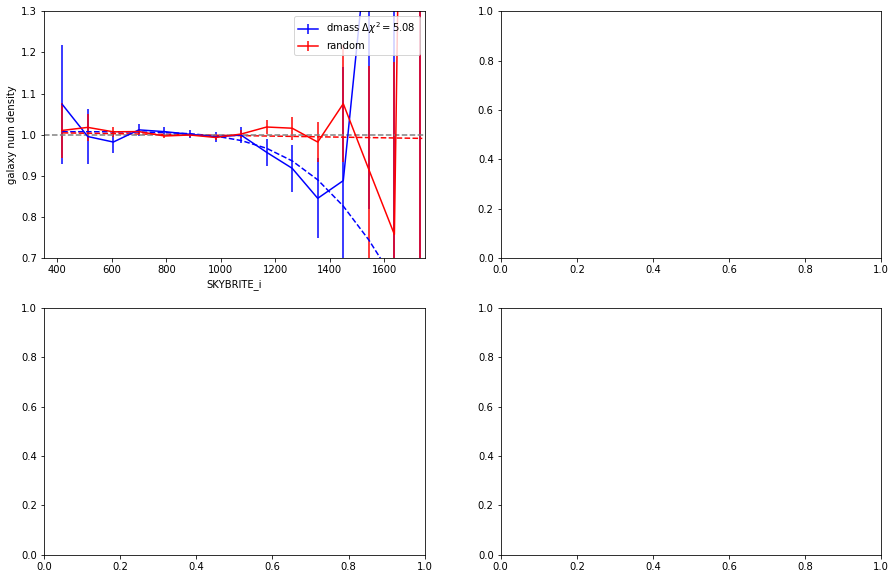

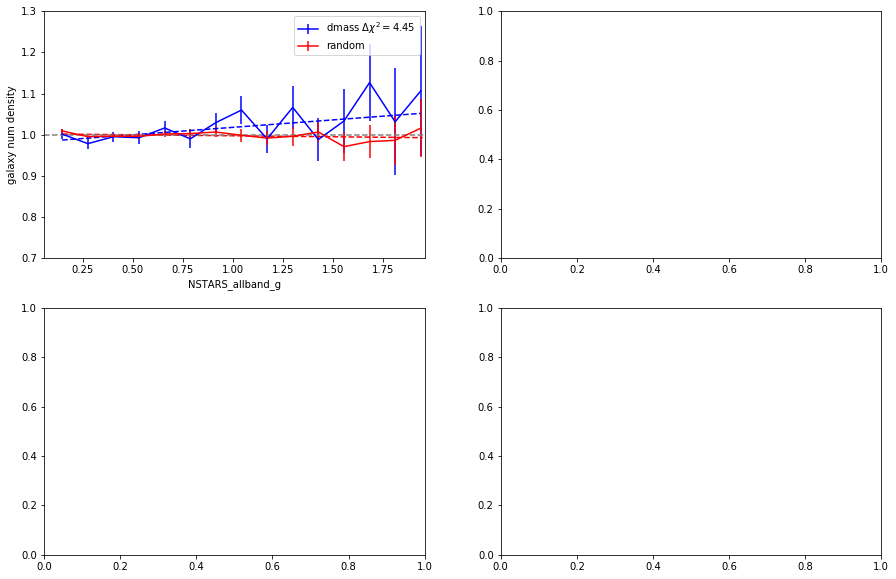

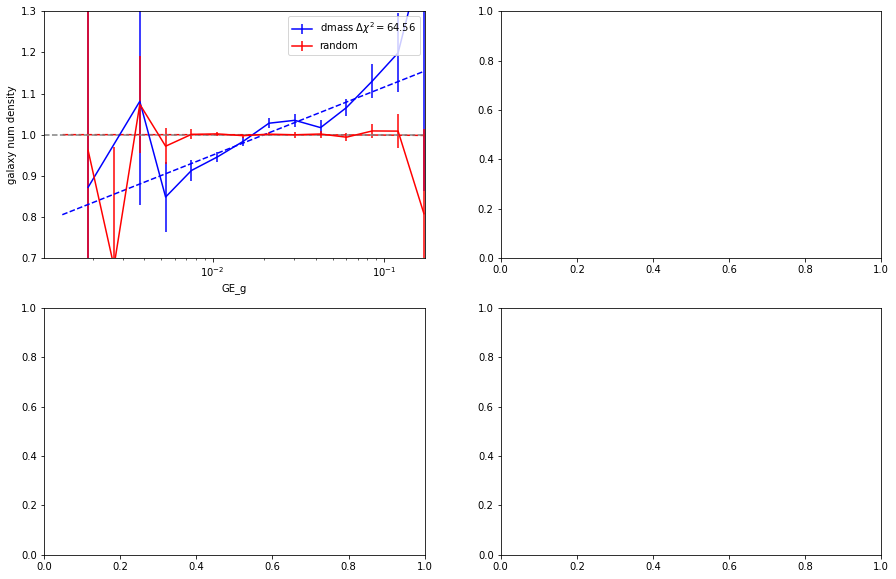

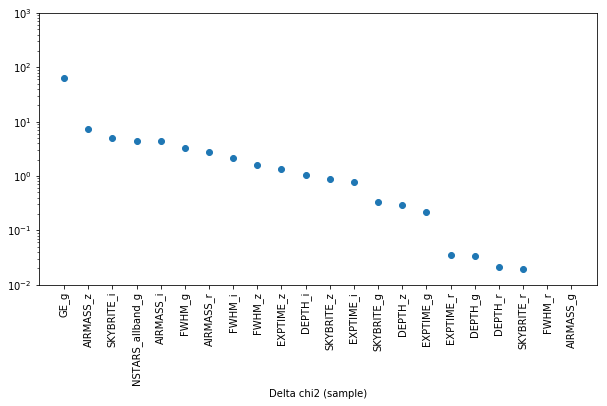

In [67]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)





In [68]:
suffix

'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g'

----------------------------------
initialize function  NSTARS_allband_g
linear
108272
store weight  NSTARS_allband_g
save weight to fits ../data_txt/systematics/4th//weights/wg_nstars_allband_g_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g.txt
saving data to  ../data_txt/systematics/4th/systematic_EX

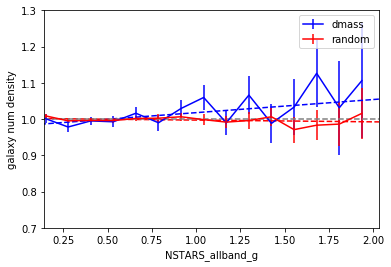

In [69]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i'] *\
* weightDic['SKYBRITE_i']* weightDic['SKYBRITE_r']  * weightDic['AIRMASS_r']  * weightDic['AIRMASS_g'] 
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g'
nextweight = 'NSTARS_allband_g'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  5.2436517670870195
chi2_mod. =  5.117916141599797
Delta chi2 (sample) = 0.1257356254872226
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g.txt.model

chi2_null =  4.334316277600976
chi2_mod. =  3.4253693141660353
Delta chi2 (sample) = 0.908946963434941
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g.txt.model

chi2_null =  12.353538989006216
chi2_mod. =  2.759574500380099
Delta chi2 (sample) = 9.593964488626117
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g.txt.model

chi2_null =  11.400342106333559
chi2_mod. =  7.156907100813118
Delta chi2 (sample) = 4.243435005520441
output save to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z

(['GE_g',
  'SKYBRITE_i',
  'DEPTH_i',
  'EXPTIME_i',
  'EXPTIME_z',
  'AIRMASS_z',
  'DEPTH_z',
  'FWHM_g',
  'AIRMASS_i',
  'FWHM_z',
  'EXPTIME_r',
  'FWHM_i',
  'AIRMASS_r',
  'DEPTH_r',
  'SKYBRITE_r',
  'DEPTH_g',
  'SKYBRITE_z',
  'SKYBRITE_g',
  'FWHM_r',
  'EXPTIME_g',
  'AIRMASS_g',
  'NSTARS_allband_g'],
 [85.89339751984683,
  14.756401031700154,
  9.593964488626117,
  5.509185290884341,
  4.626784860260788,
  4.263368195223579,
  4.243435005520441,
  3.2555616958184324,
  2.5543562491055116,
  1.4289144879205864,
  1.4073861377494739,
  1.3408378345903227,
  1.0690565718083889,
  0.908946963434941,
  0.5522535139880151,
  0.1257356254872226,
  0.04800995228080662,
  0.01746285002766257,
  0.00682522012563247,
  0.005794536435864472,
  0.00366425470416587,
  0.002436147352742779])

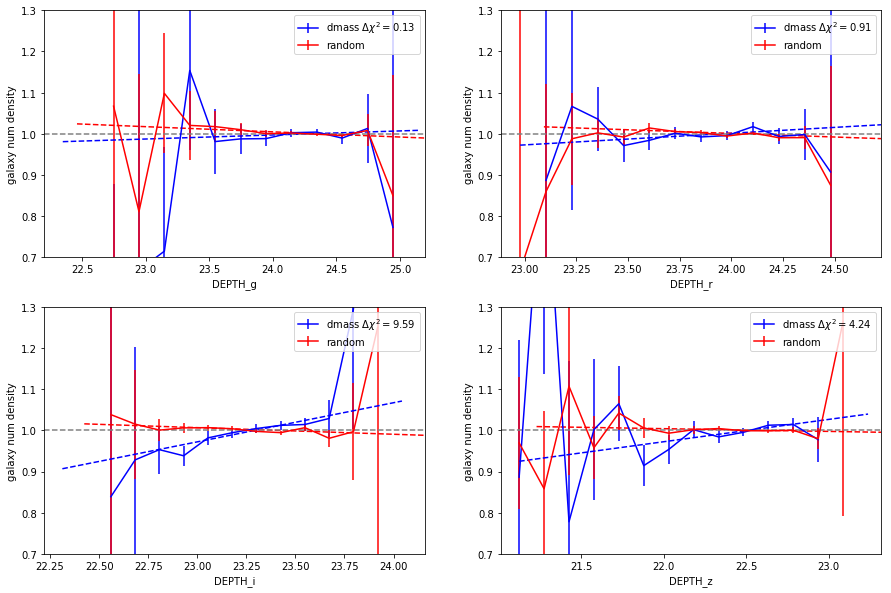

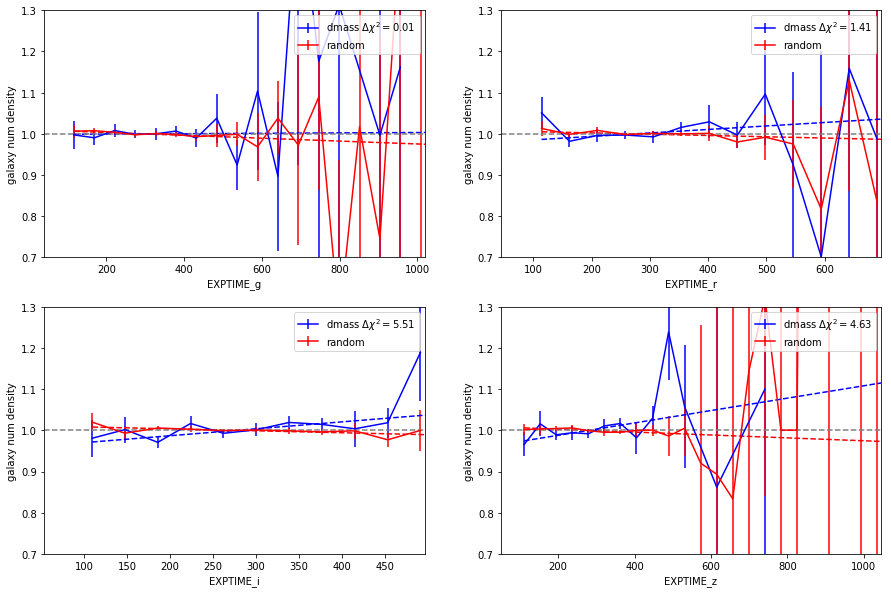

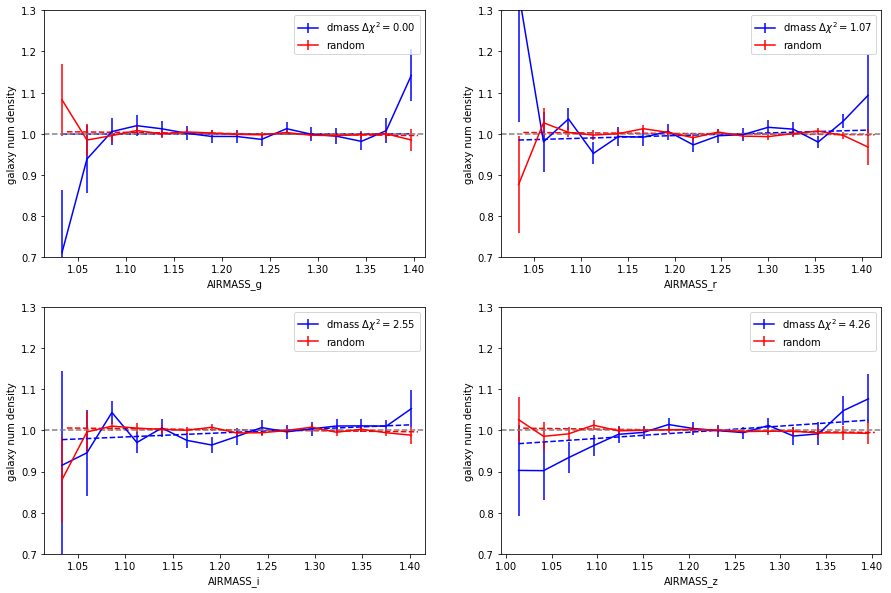

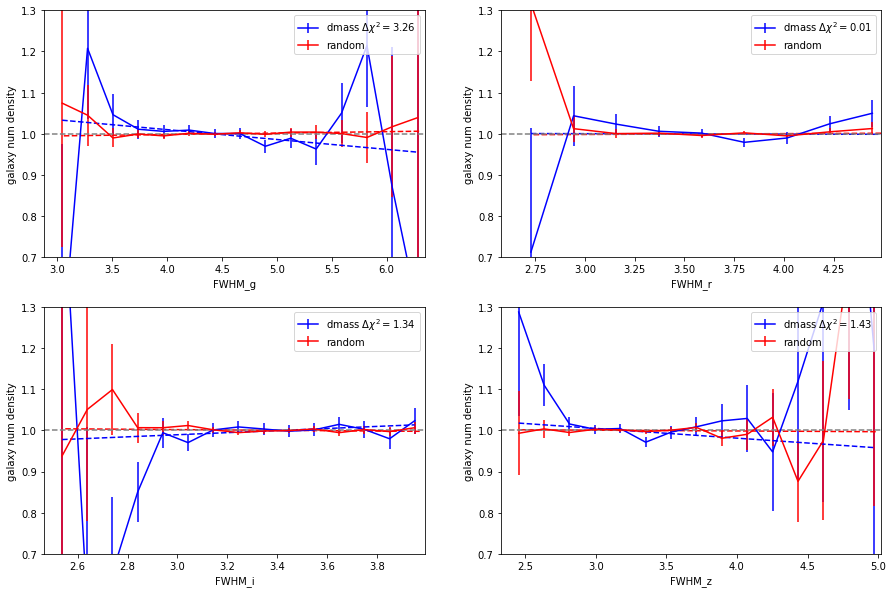

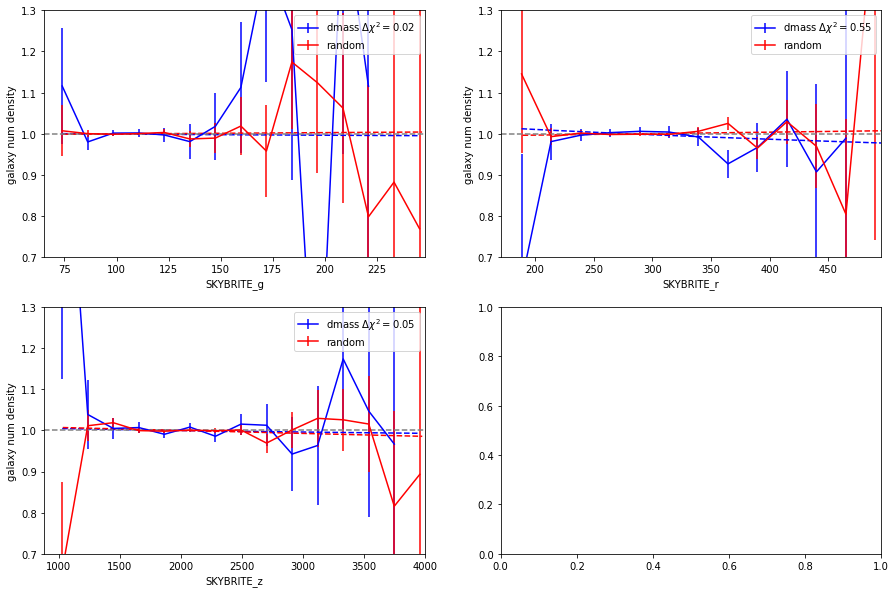

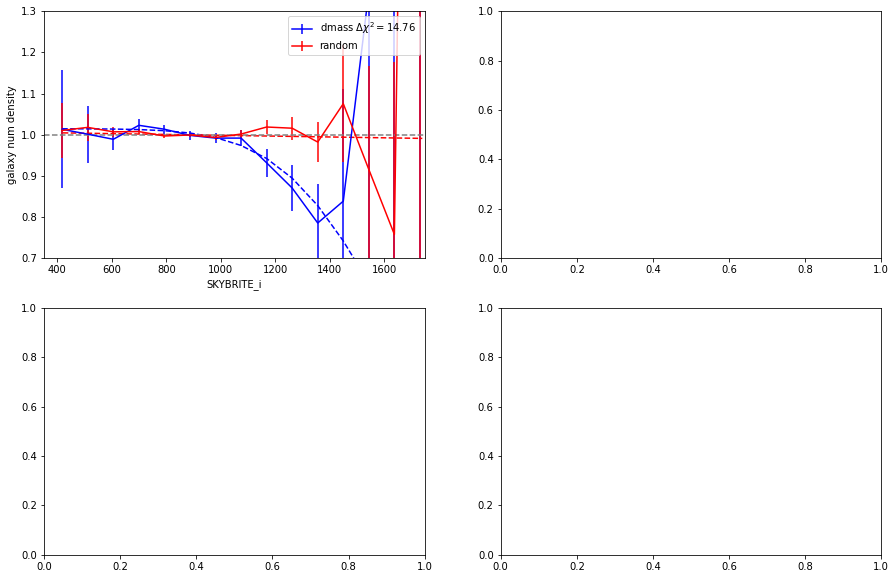

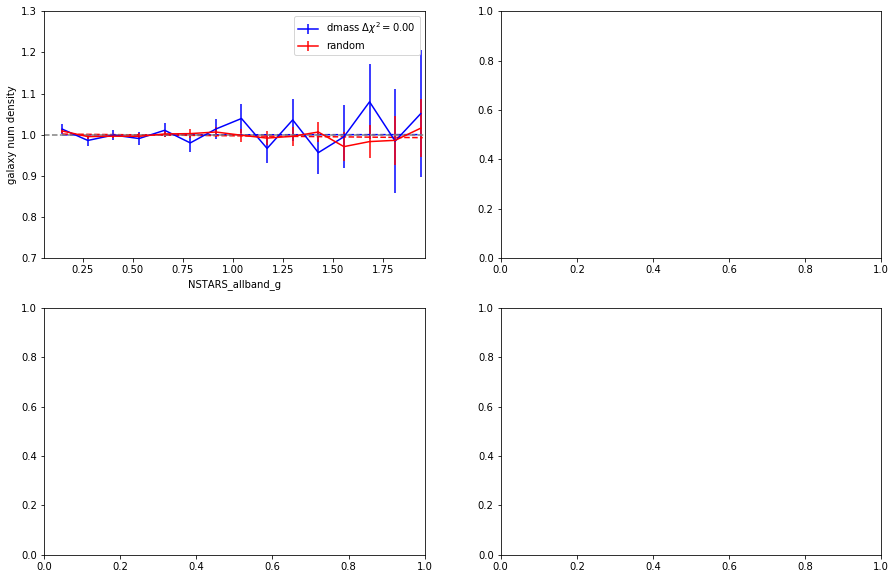

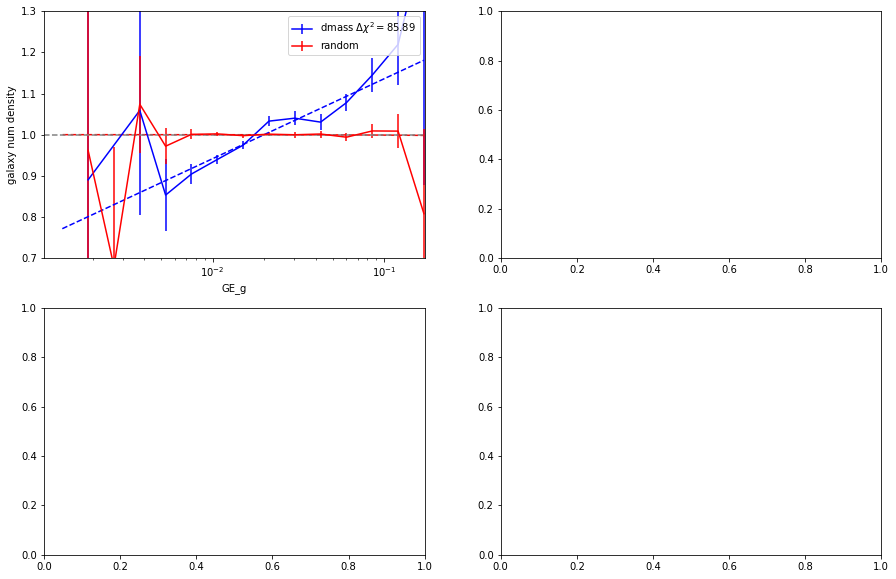

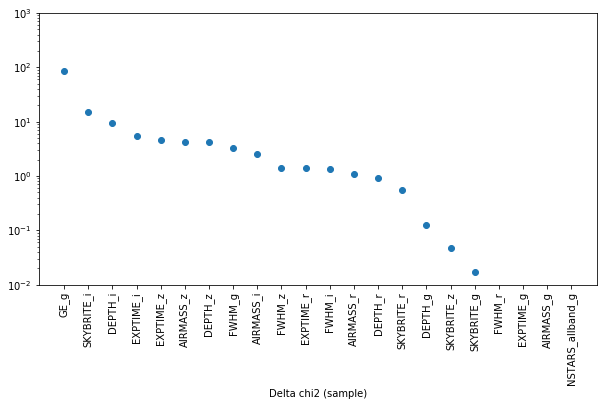

In [72]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)






----------------------------------
initialize function  DEPTH_i
linear
108272
store weight  DEPTH_i
save weight to fits ../data_txt/systematics/4th//weights/wg_depth_i_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i.txt
saving data to  ../data_txt/systematics/4th/

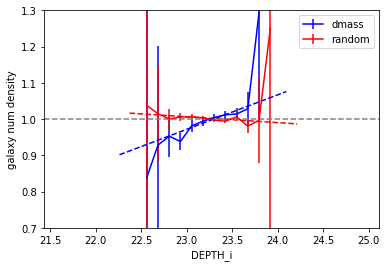

In [73]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i'] *\
* weightDic['SKYBRITE_i']* weightDic['SKYBRITE_r']  * weightDic['AIRMASS_r']  * weightDic['AIRMASS_g'] \
* weightDic['NSTARS_allband_g'] 
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g'
nextweight = 'DEPTH_i'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  7.618468080848328
chi2_mod. =  5.838590126216283
Delta chi2 (sample) = 1.7798779546320453
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i.txt.model

chi2_null =  4.6330563559316875
chi2_mod. =  3.215418975354285
Delta chi2 (sample) = 1.4176373805774025
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i.txt.model

chi2_null =  2.7327573716227036
chi2_mod. =  2.716598507096309
Delta chi2 (sample) = 0.01615886452639481
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i.txt.model

chi2_null =  7.203029440735001
chi2_mod. =  7.126503237945375
Delta chi2 (sample) = 0.0765262027896263
output save to  ../data_txt/systematics/4th/systematic_DEPTH

(['GE_g',
  'SKYBRITE_i',
  'AIRMASS_z',
  'AIRMASS_i',
  'EXPTIME_g',
  'FWHM_g',
  'DEPTH_g',
  'AIRMASS_r',
  'FWHM_z',
  'DEPTH_r',
  'EXPTIME_r',
  'FWHM_i',
  'SKYBRITE_g',
  'NSTARS_allband_g',
  'FWHM_r',
  'SKYBRITE_z',
  'DEPTH_z',
  'EXPTIME_z',
  'EXPTIME_i',
  'DEPTH_i',
  'AIRMASS_g',
  'SKYBRITE_r'],
 [82.0003827998952,
  7.705383382188393,
  4.219619553058678,
  3.745198103405823,
  2.9082644396201047,
  2.8605170053582807,
  1.7798779546320453,
  1.5946168609006541,
  1.5423177790613583,
  1.4176373805774025,
  0.8217816293310678,
  0.5989368543943243,
  0.2059778210877461,
  0.15090954791448752,
  0.10661047980753757,
  0.07837141221210864,
  0.0765262027896263,
  0.06758931952104241,
  0.017761278606090336,
  0.01615886452639481,
  0.008905996718322484,
  0.0009375037059795588])

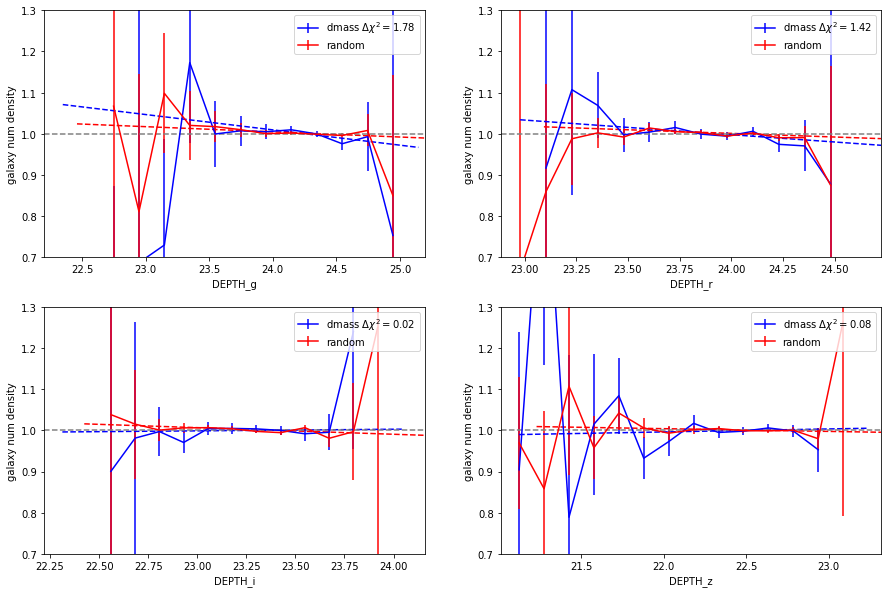

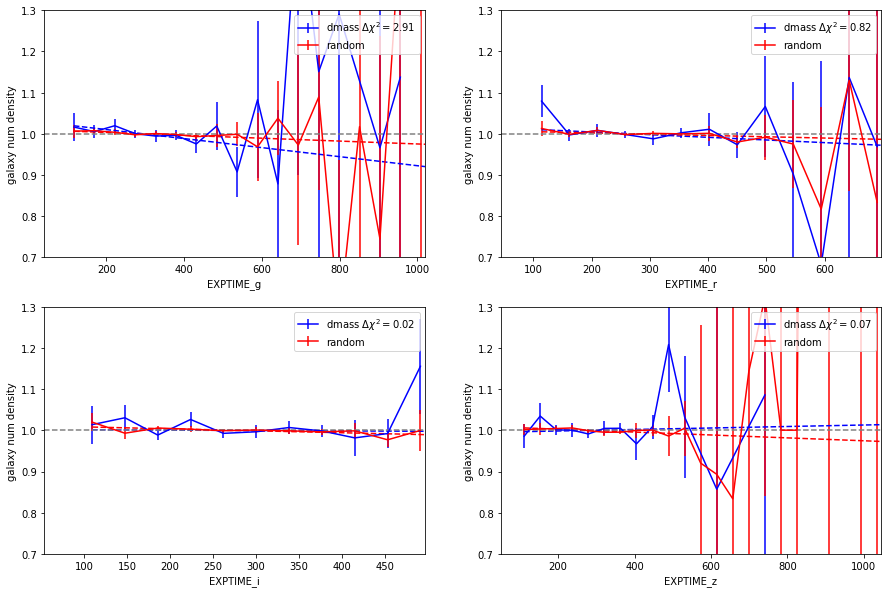

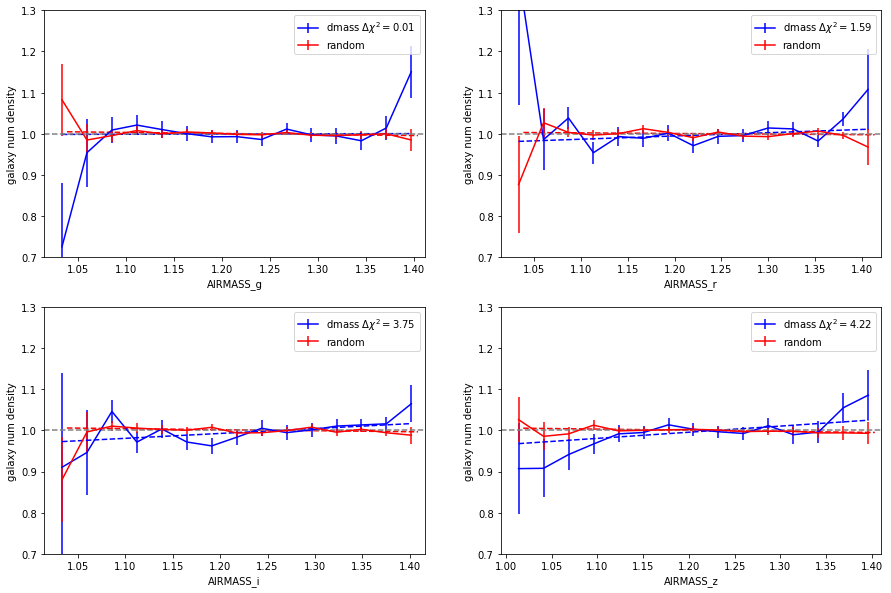

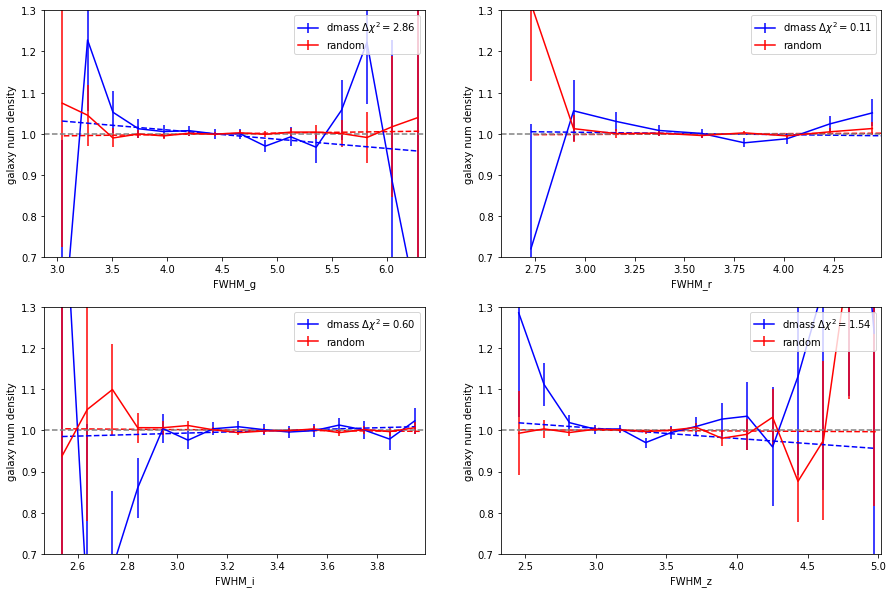

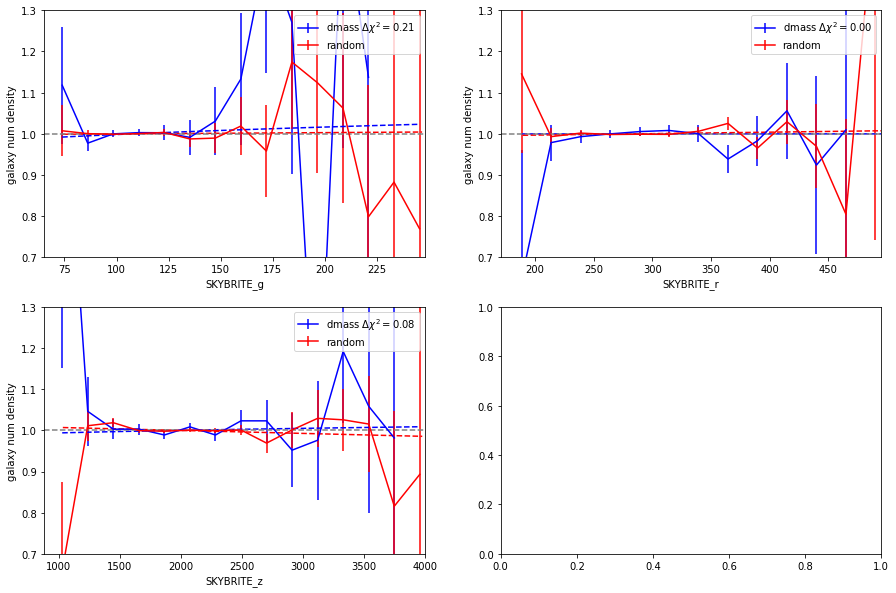

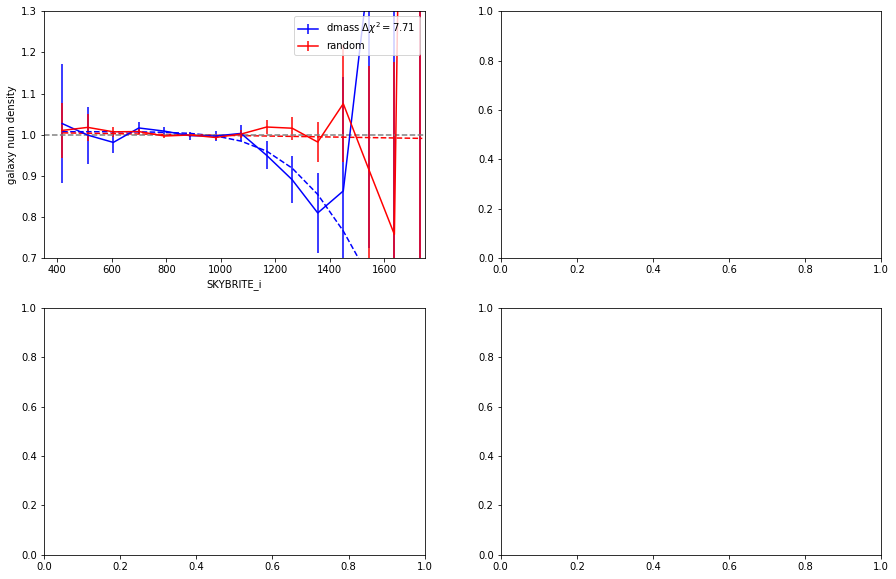

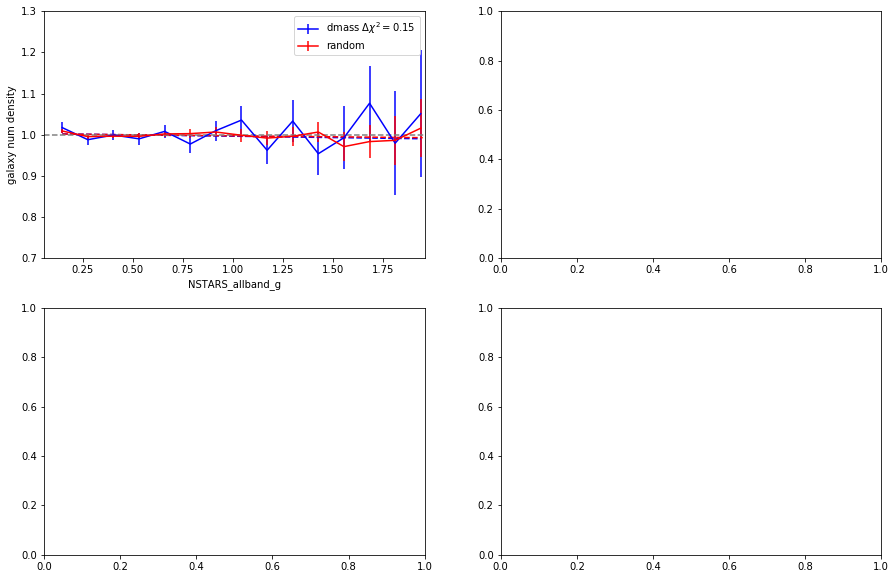

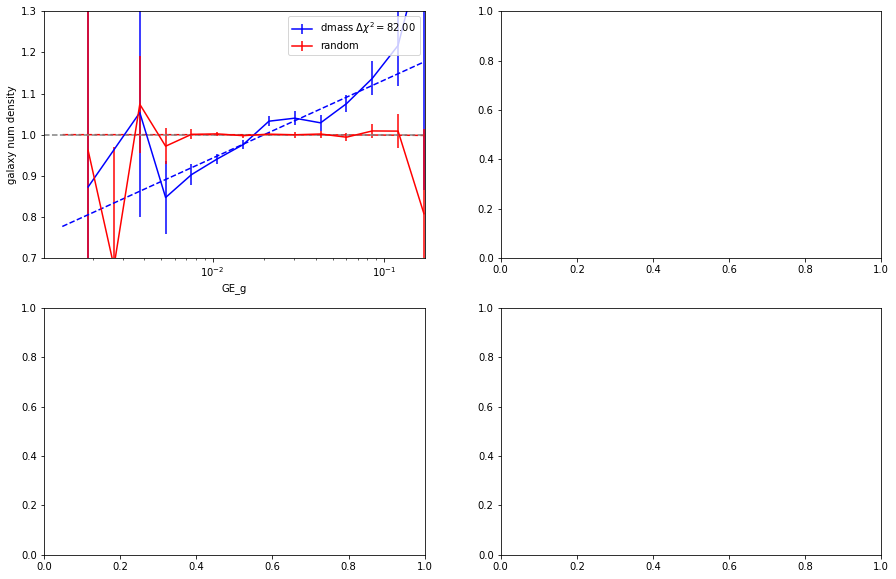

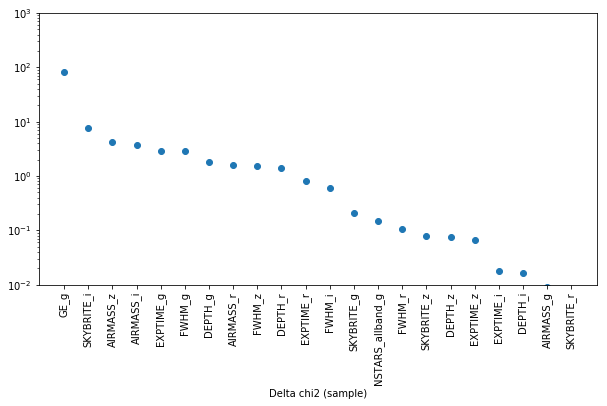

In [74]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)


In [77]:
suffix

'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i'

----------------------------------
initialize function  EXPTIME_g
linear
108272
store weight  EXPTIME_g
save weight to fits ../data_txt/systematics/4th//weights/wg_exptime_g_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_ex

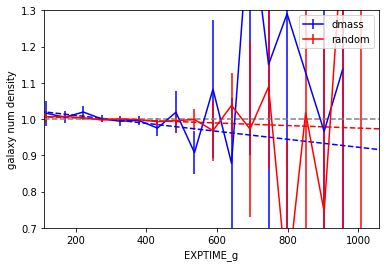

In [78]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i'] *\
* weightDic['SKYBRITE_i']* weightDic['SKYBRITE_r']  * weightDic['AIRMASS_r']  * weightDic['AIRMASS_g'] \
* weightDic['NSTARS_allband_g'] * weightDic['DEPTH_i'] 
#suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g'
nextweight = 'EXPTIME_g'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  5.0163663021903515
chi2_mod. =  5.0099613657575075
Delta chi2 (sample) = 0.006404936432844011
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g.txt.model

chi2_null =  3.309354622288894
chi2_mod. =  3.303683062892283
Delta chi2 (sample) = 0.0056715593966112365
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g.txt.model

chi2_null =  3.569880785653184
chi2_mod. =  2.3568724138910255
Delta chi2 (sample) = 1.2130083717621583
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g.txt.model

chi2_null =  8.380461428718588
chi2_mod. =  6.980819074856761
Delta chi2 (sample) = 1.399642353861827
output save to  ../data_tx

(['GE_g',
  'SKYBRITE_i',
  'AIRMASS_i',
  'AIRMASS_z',
  'FWHM_g',
  'AIRMASS_r',
  'EXPTIME_z',
  'FWHM_z',
  'DEPTH_z',
  'DEPTH_i',
  'EXPTIME_i',
  'FWHM_i',
  'SKYBRITE_g',
  'NSTARS_allband_g',
  'EXPTIME_r',
  'SKYBRITE_z',
  'FWHM_r',
  'AIRMASS_g',
  'SKYBRITE_r',
  'DEPTH_g',
  'DEPTH_r',
  'EXPTIME_g'],
 [82.50207359288731,
  7.691142449481179,
  4.609409979942818,
  4.59853145441917,
  2.373847767933487,
  2.096751128238509,
  1.920764571486104,
  1.54395558221203,
  1.399642353861827,
  1.2130083717621583,
  1.1786340784995142,
  0.6058623827638829,
  0.17708410018227738,
  0.14984067974381965,
  0.11336443765911319,
  0.09000513172781144,
  0.08052098103062022,
  0.0381971089946429,
  0.01849798792368862,
  0.006404936432844011,
  0.0056715593966112365,
  0.0035811951413524667])

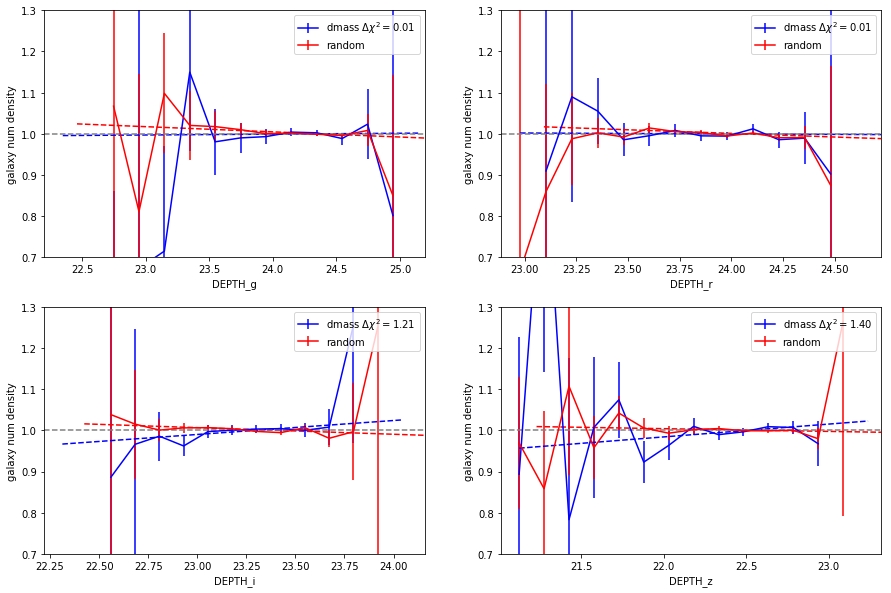

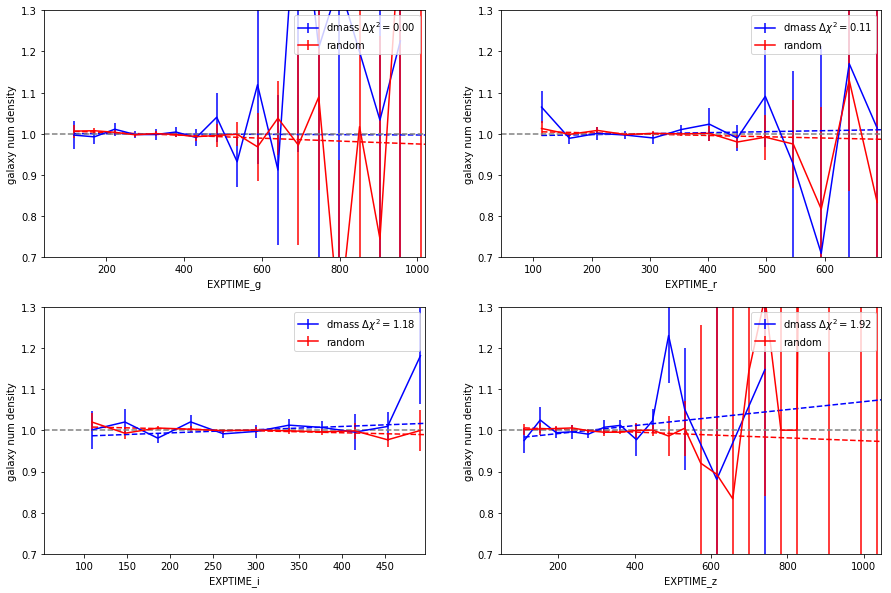

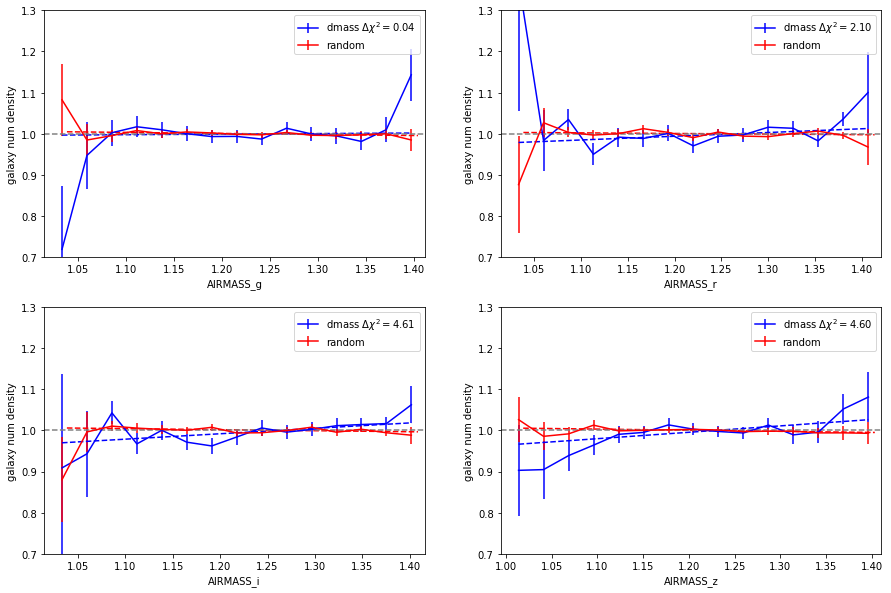

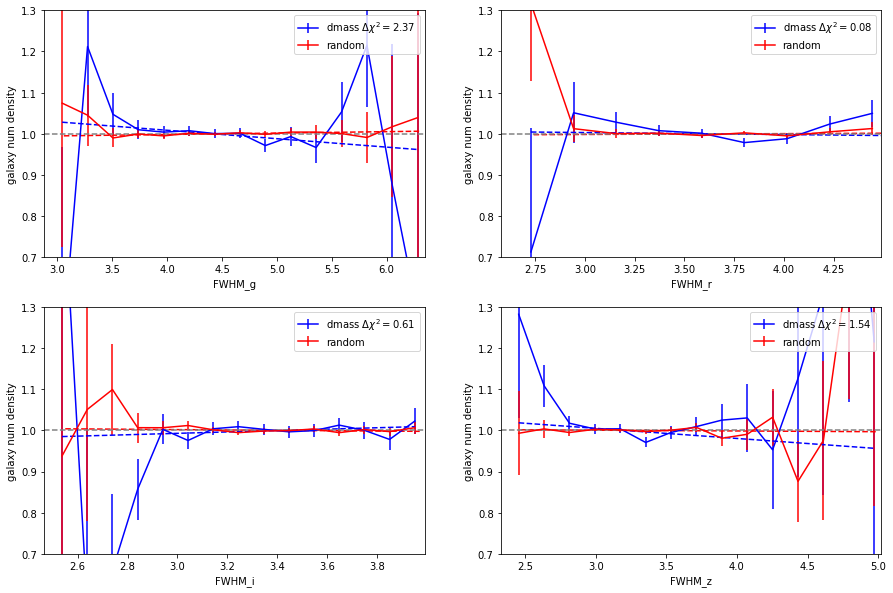

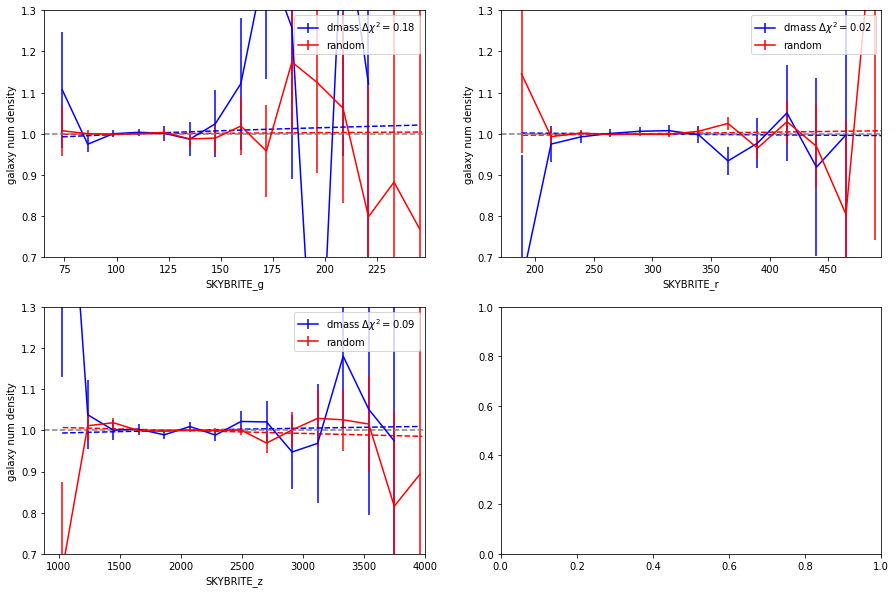

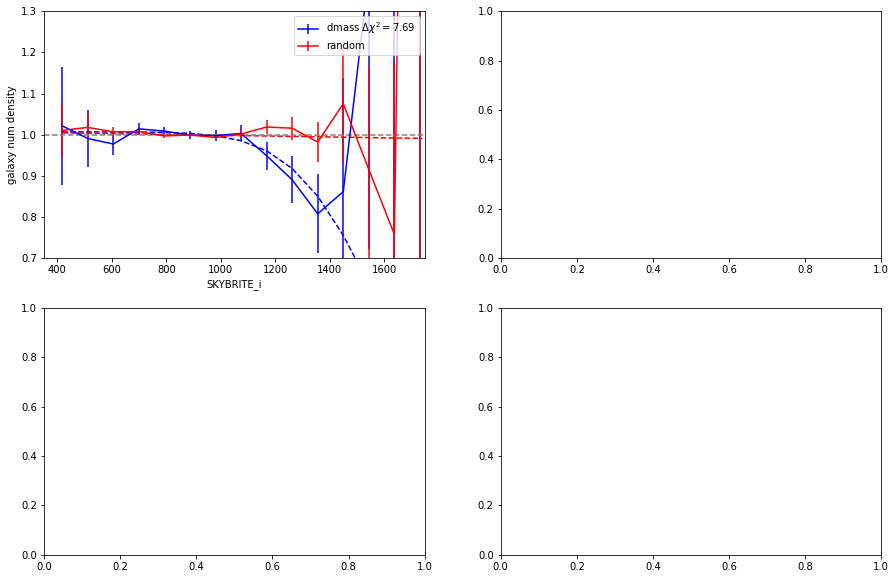

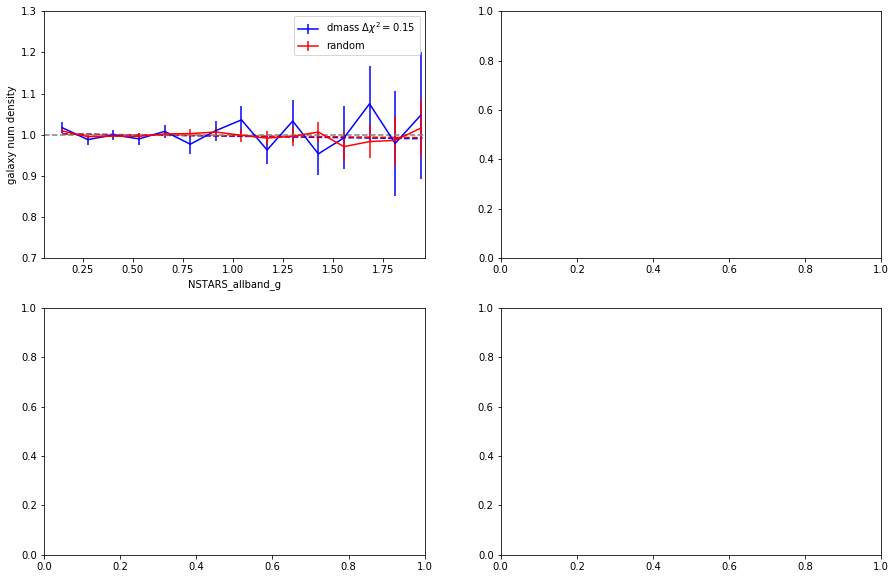

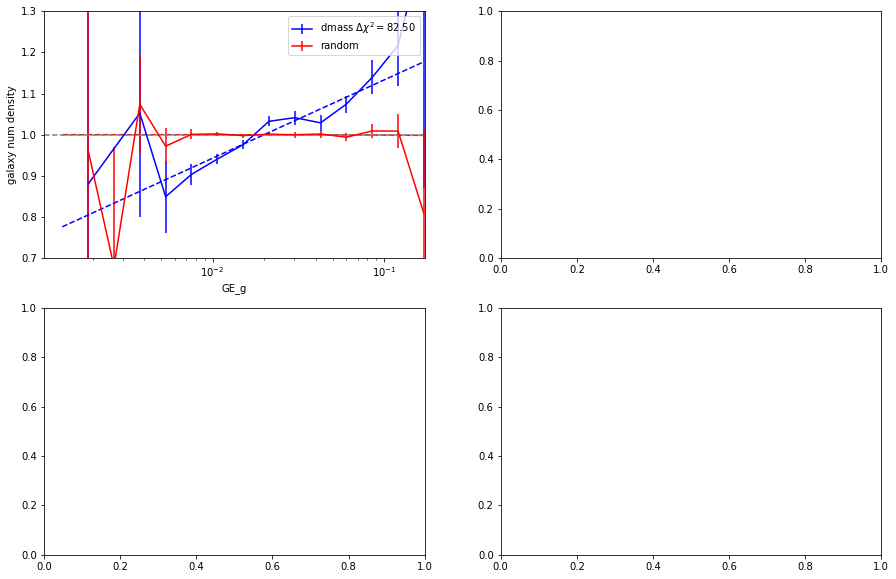

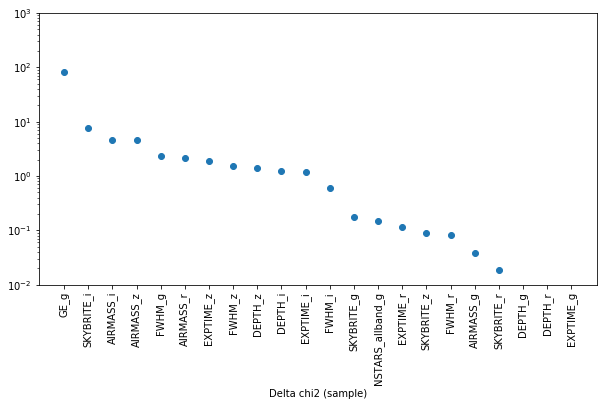

In [79]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)



In [81]:
suffix

'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g'

----------------------------------
initialize function  FWHM_g
linear
108272
store weight  FWHM_g
save weight to fits ../data_txt/systematics/4th//weights/wg_fwhm_g_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_a

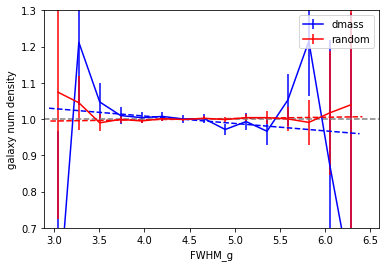

In [82]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i'] *\
* weightDic['SKYBRITE_i']* weightDic['SKYBRITE_r']  * weightDic['AIRMASS_r']  * weightDic['AIRMASS_g'] \
* weightDic['NSTARS_allband_g'] * weightDic['DEPTH_i']  * weightDic['EXPTIME_g'] 
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g'
nextweight = 'FWHM_g'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  4.730818688590218
chi2_mod. =  4.70440225418227
Delta chi2 (sample) = 0.026416434407948053
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g.txt.model

chi2_null =  3.332002636387475
chi2_mod. =  3.272969078492779
Delta chi2 (sample) = 0.059033557894695665
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g.txt.model

chi2_null =  3.4636523264955787
chi2_mod. =  2.3841353253103517
Delta chi2 (sample) = 1.079517001185227
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g.txt.model

chi2_null =  8.316790255927382
chi2_mod. =  6.925079420562523
Delta chi2 (sample) = 1.3917108353648588
output s

(['GE_g',
  'SKYBRITE_i',
  'AIRMASS_z',
  'AIRMASS_i',
  'FWHM_z',
  'EXPTIME_z',
  'AIRMASS_r',
  'DEPTH_z',
  'DEPTH_i',
  'EXPTIME_i',
  'FWHM_i',
  'NSTARS_allband_g',
  'SKYBRITE_g',
  'EXPTIME_r',
  'SKYBRITE_z',
  'DEPTH_r',
  'AIRMASS_g',
  'DEPTH_g',
  'FWHM_r',
  'EXPTIME_g',
  'FWHM_g',
  'SKYBRITE_r'],
 [82.10287253066244,
  8.21831698868293,
  4.214544408201462,
  3.5502941914701225,
  1.7397791174577666,
  1.7302614301570207,
  1.4455213461999374,
  1.3917108353648588,
  1.079517001185227,
  0.9196288082155606,
  0.8618115625766283,
  0.12990864428150495,
  0.07314925319317211,
  0.06276609359684837,
  0.05917635367964014,
  0.059033557894695665,
  0.04067704629073532,
  0.026416434407948053,
  0.009583521921349814,
  0.005970337155439154,
  0.0042726971287194715,
  0.003190339050589408])

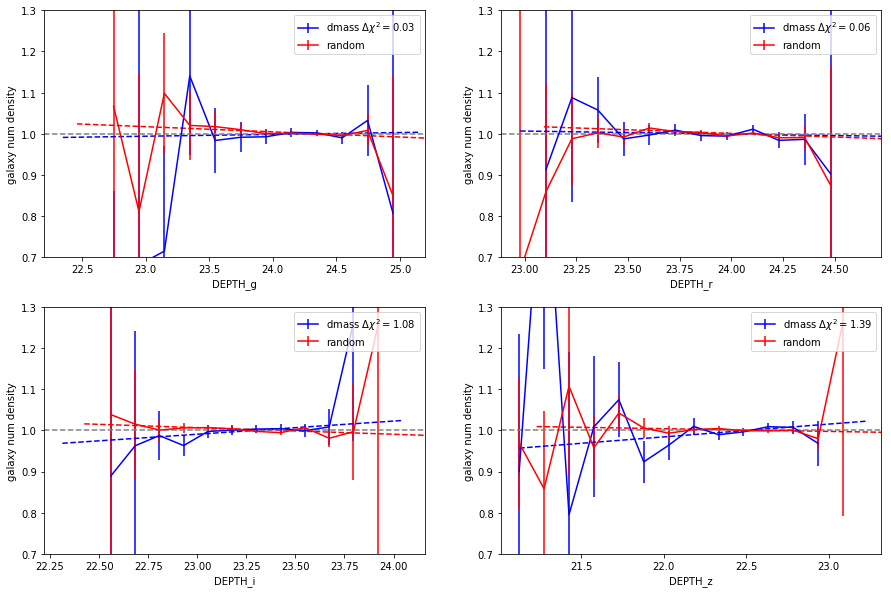

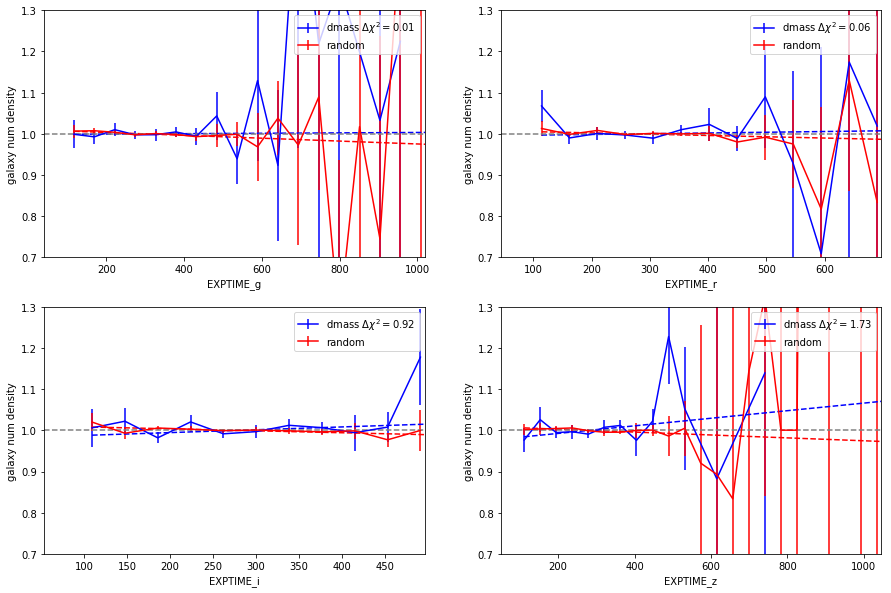

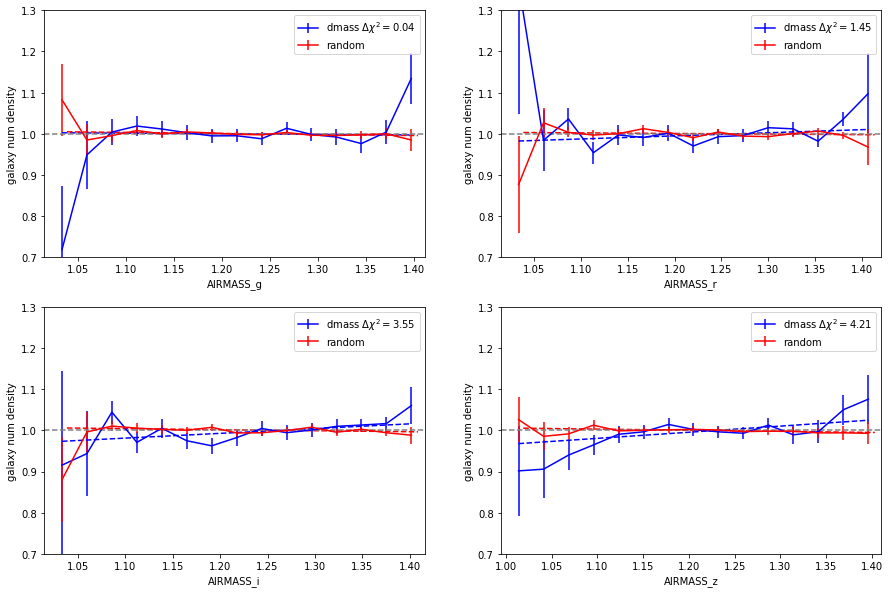

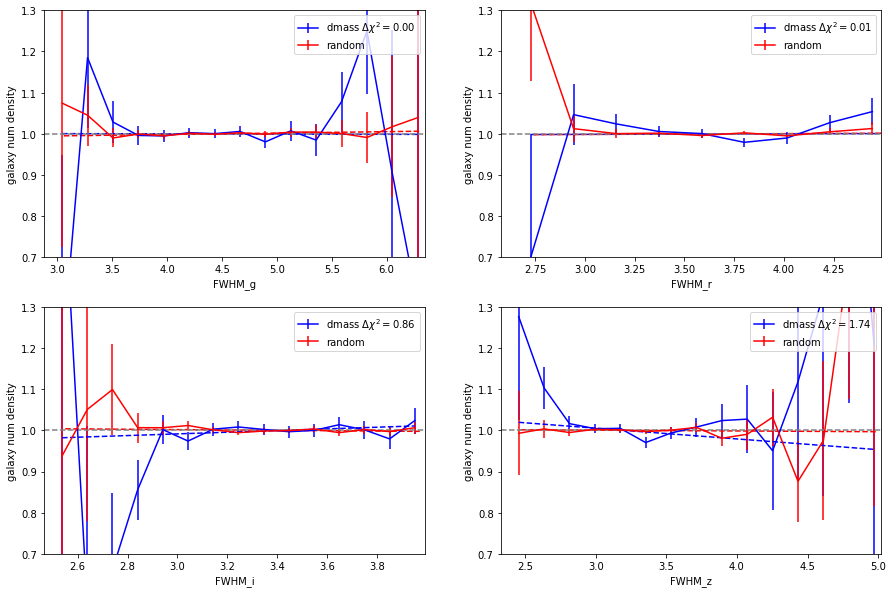

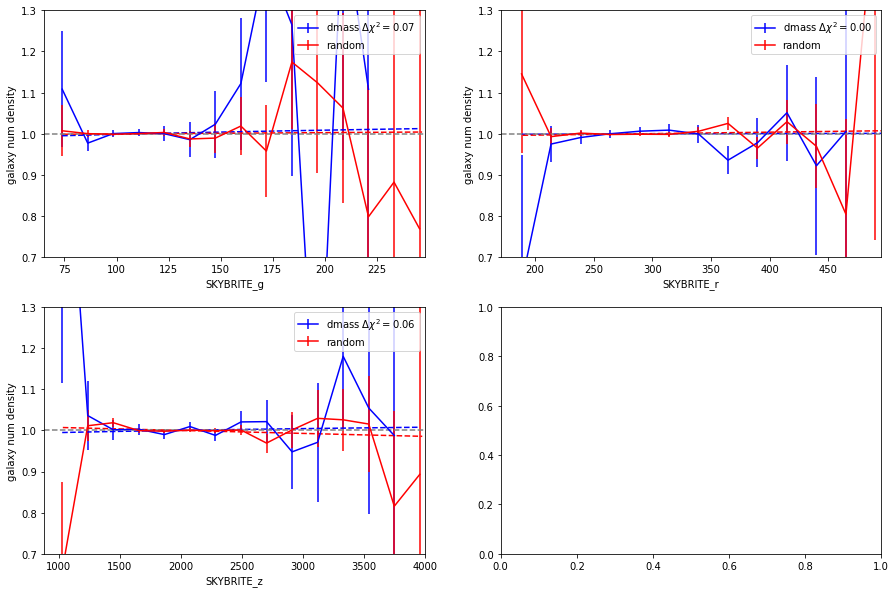

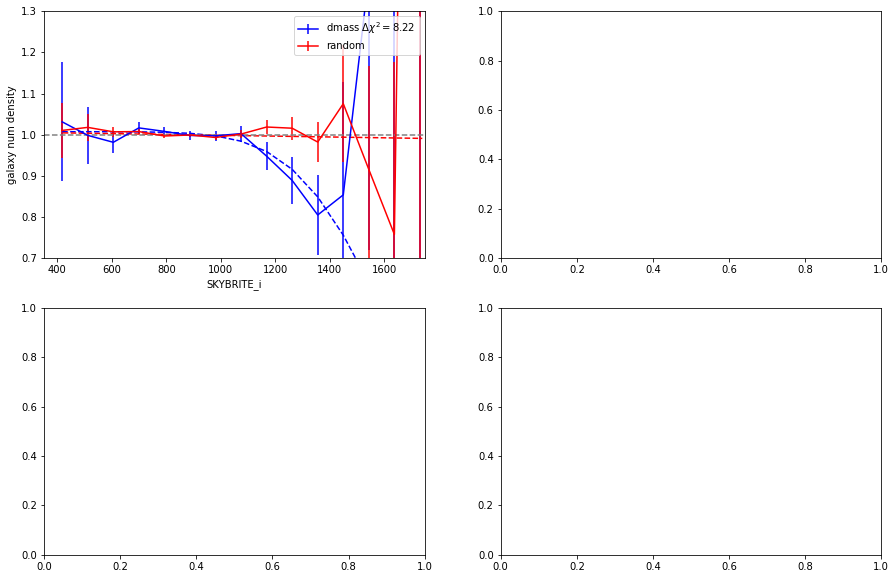

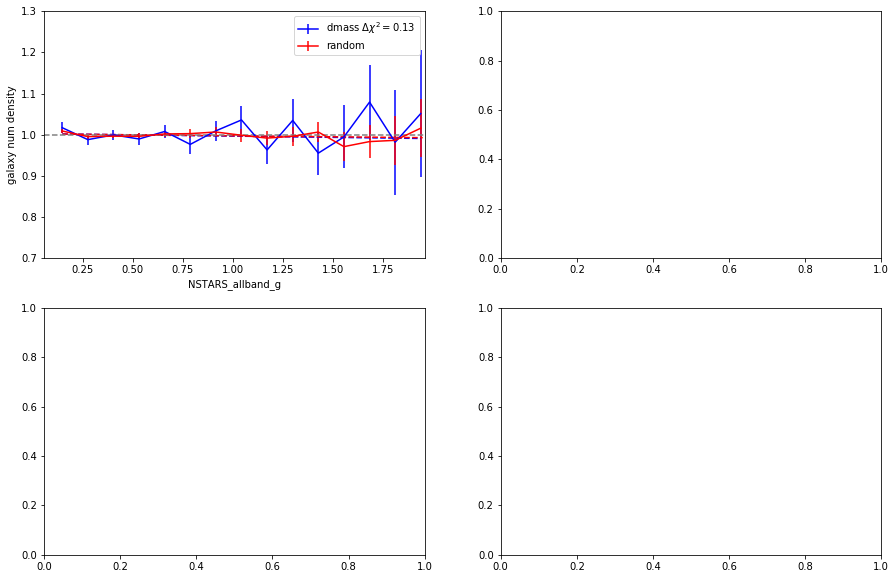

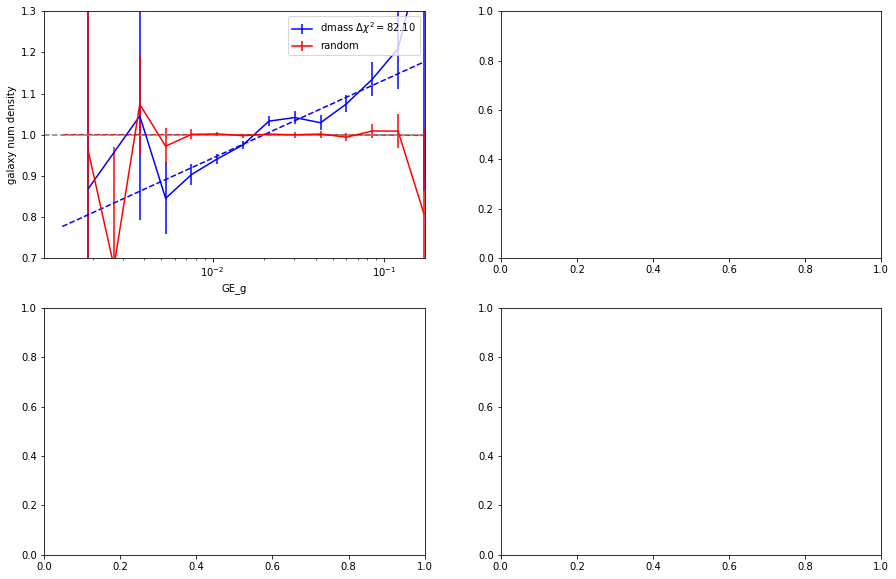

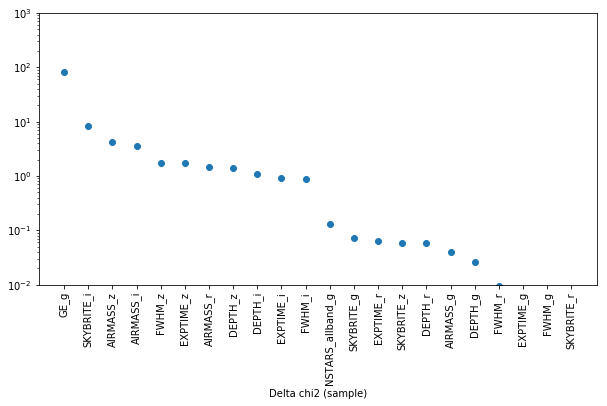

In [83]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_\
skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)

----------------------------------
initialize function  FWHM_z
linear
108272
store weight  FWHM_z
save weight to fits ../data_txt/systematics/4th//weights/wg_fwhm_z_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_

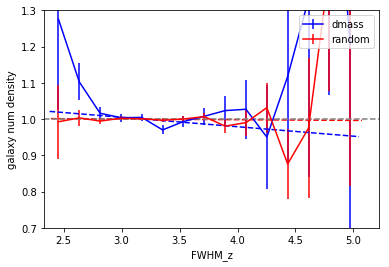

In [84]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i'] *\
* weightDic['SKYBRITE_i']* weightDic['SKYBRITE_r']  * weightDic['AIRMASS_r']  * weightDic['AIRMASS_g'] \
* weightDic['NSTARS_allband_g'] * weightDic['DEPTH_i']  * weightDic['EXPTIME_g'] * weightDic['FWHM_g'] 
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_\
airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g'
nextweight = 'FWHM_z'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  4.7531031488627615
chi2_mod. =  4.722896892923921
Delta chi2 (sample) = 0.03020625593884052
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z.txt.model

chi2_null =  3.3614624007467473
chi2_mod. =  3.316666372225535
Delta chi2 (sample) = 0.04479602852121234
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z.txt.model

chi2_null =  3.5357897075394855
chi2_mod. =  2.4216313288121523
Delta chi2 (sample) = 1.1141583787273333
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z.txt.model

chi2_null =  8.186039411569253
chi2_mod. =  6.759566762439711
Delta chi2 (sample) = 1.42

(['GE_g',
  'SKYBRITE_i',
  'AIRMASS_i',
  'AIRMASS_z',
  'AIRMASS_r',
  'EXPTIME_z',
  'DEPTH_z',
  'DEPTH_i',
  'FWHM_i',
  'EXPTIME_i',
  'NSTARS_allband_g',
  'SKYBRITE_g',
  'EXPTIME_r',
  'DEPTH_r',
  'SKYBRITE_z',
  'DEPTH_g',
  'FWHM_r',
  'SKYBRITE_r',
  'FWHM_g',
  'FWHM_z',
  'EXPTIME_g',
  'AIRMASS_g'],
 [79.37400968424362,
  7.837727547120914,
  4.133654787938767,
  3.776789011409445,
  1.9694941562092865,
  1.8524536561999998,
  1.4264726491295416,
  1.1141583787273333,
  1.0769501655873732,
  0.9701824495737377,
  0.19240241406735592,
  0.1275422617052726,
  0.08348025671560055,
  0.04479602852121234,
  0.040907378817999884,
  0.03020625593884052,
  0.02078376190512543,
  0.018514931174333782,
  0.013388197872345131,
  0.007445419841081602,
  0.005891671033704249,
  0.005375231635200706])

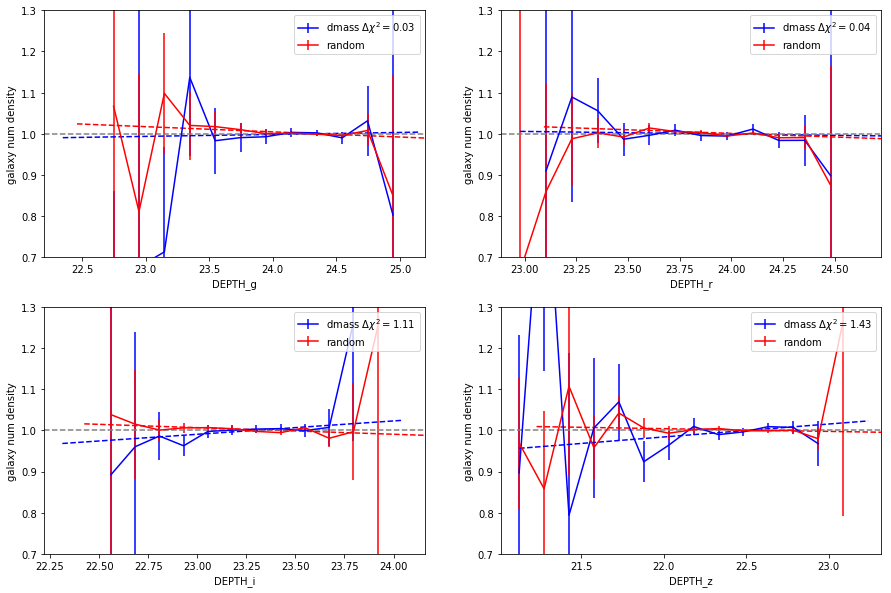

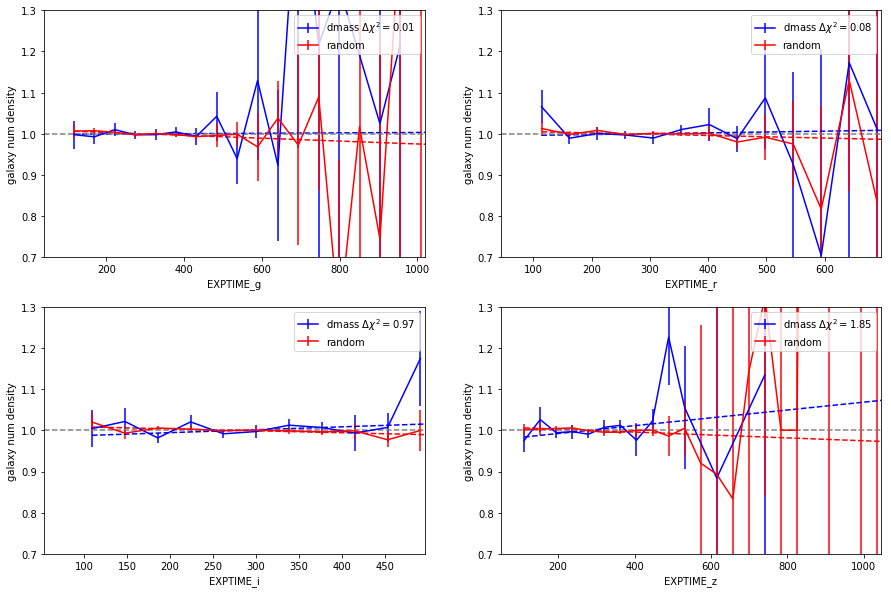

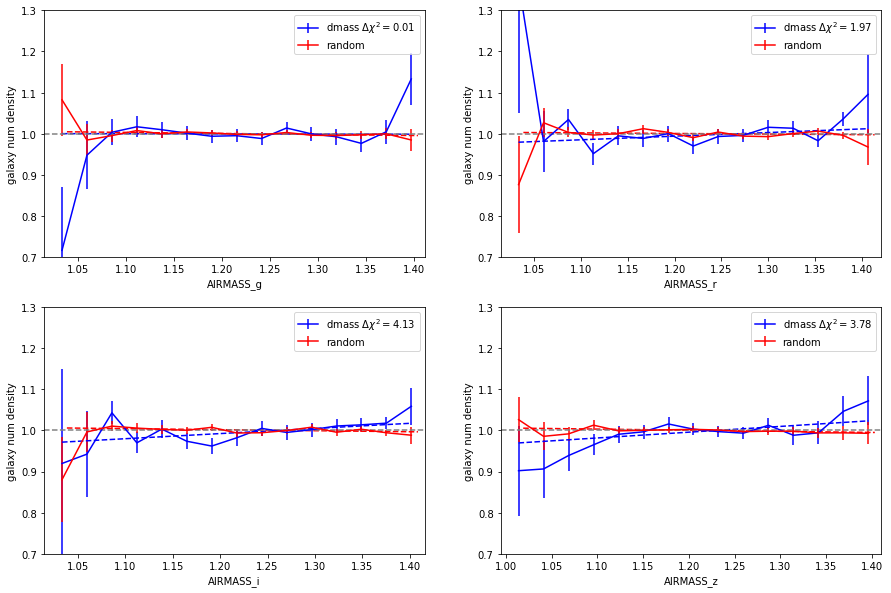

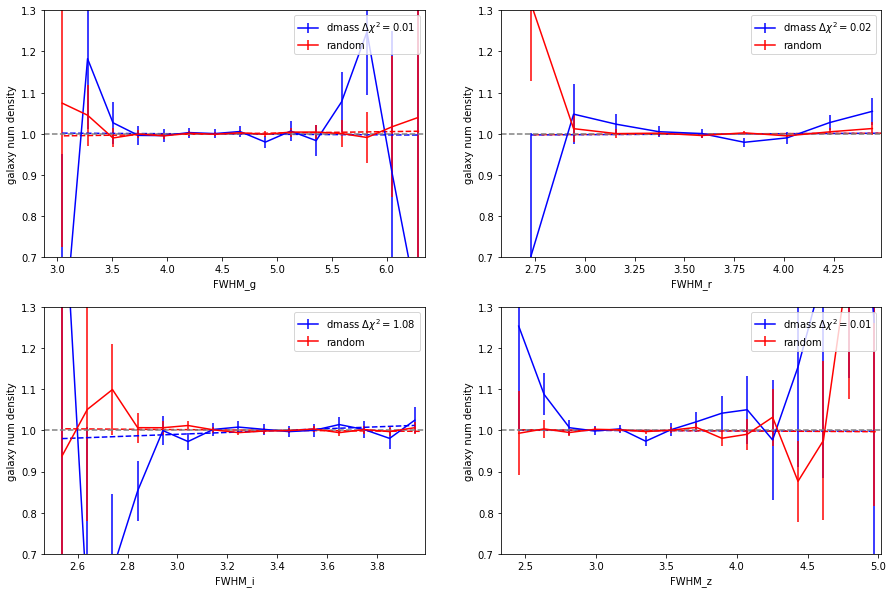

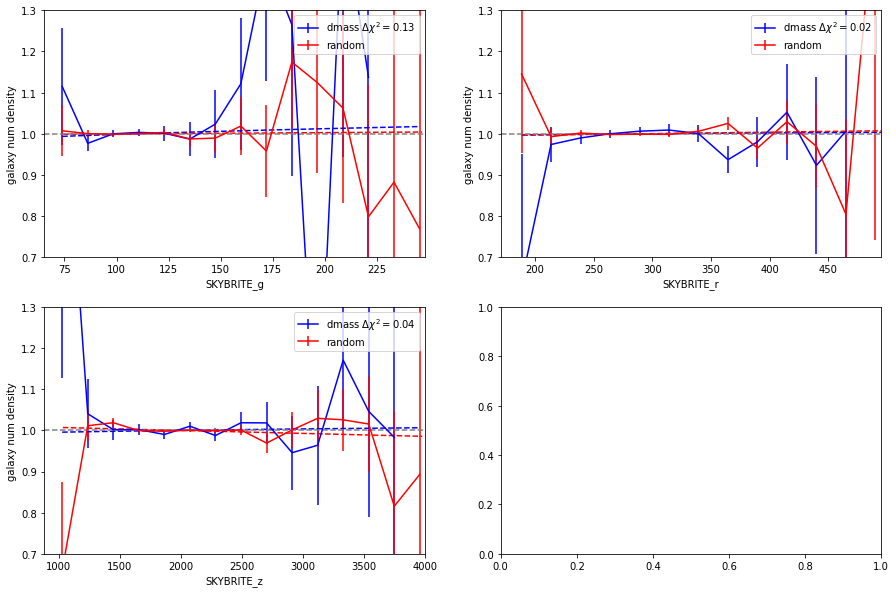

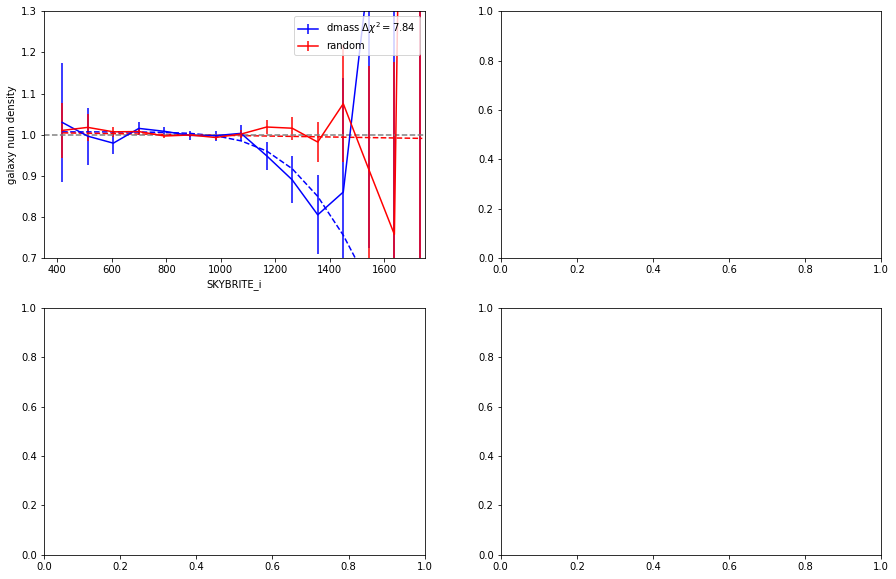

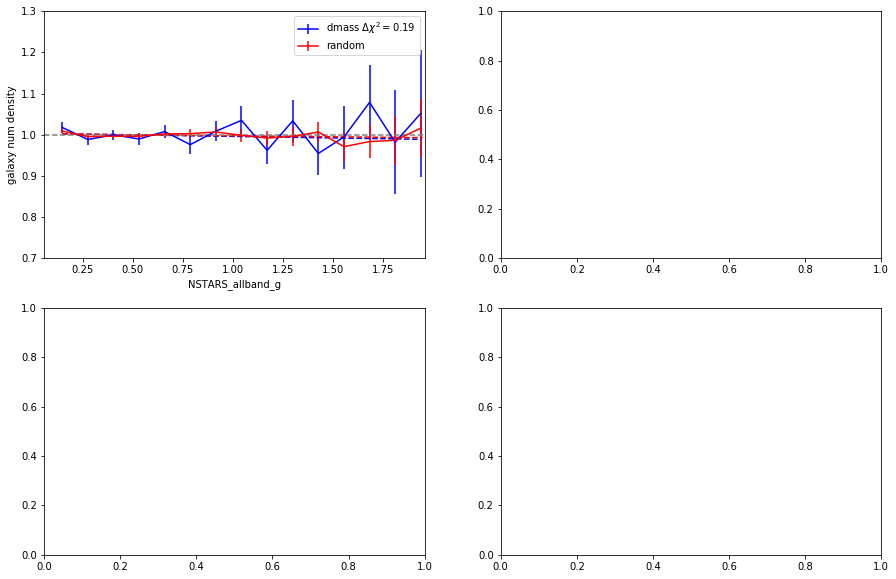

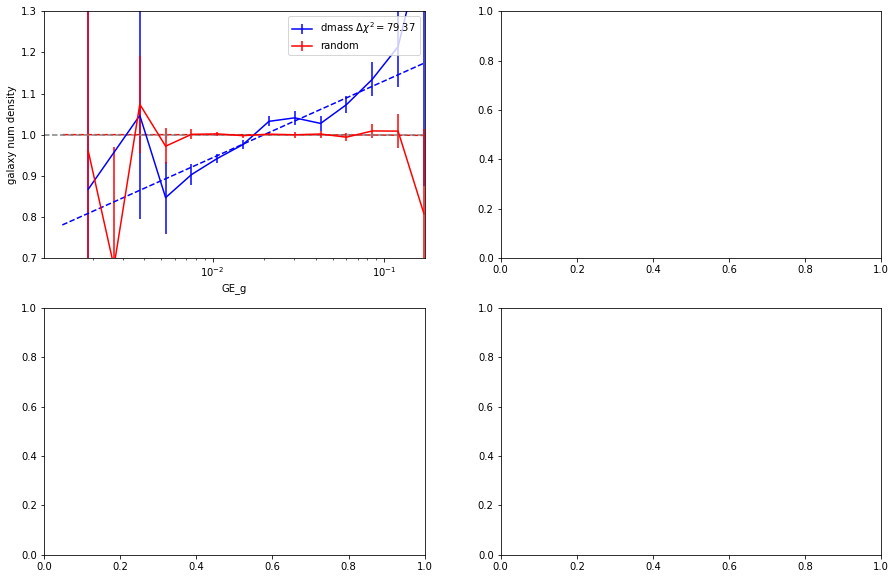

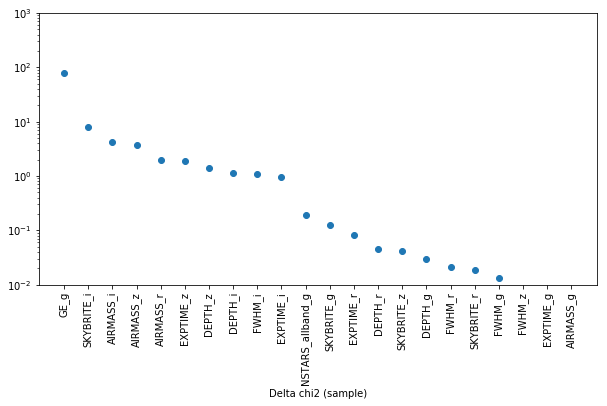

In [86]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_\
airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)

In [87]:
suffix

'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z'

----------------------------------
initialize function  EXPTIME_z
linear
108272
store weight  EXPTIME_z
save weight to fits ../data_txt/systematics/4th//weights/wg_exptime_z_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_z_SPT_wg_

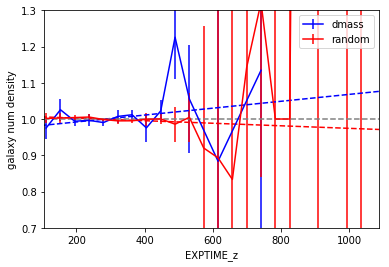

In [88]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i'] *\
* weightDic['SKYBRITE_i']* weightDic['SKYBRITE_r']  * weightDic['AIRMASS_r']  * weightDic['AIRMASS_g'] \
* weightDic['NSTARS_allband_g'] * weightDic['DEPTH_i']  * weightDic['EXPTIME_g'] * weightDic['FWHM_g'] \
* weightDic['FWHM_z'] 
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_\
airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z'
nextweight = 'EXPTIME_z'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  5.709819356332718
chi2_mod. =  5.31290825062408
Delta chi2 (sample) = 0.3969111057086385
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z.txt.model

chi2_null =  4.5091791728653785
chi2_mod. =  3.306521907946701
Delta chi2 (sample) = 1.2026572649186775
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z.txt.model

chi2_null =  2.7573578850747085
chi2_mod. =  2.7161216360125824
Delta chi2 (sample) = 0.041236249062126085
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z.txt.model

chi2_null =  6.862333470774211
chi2_mod. =  6.85918254263042

(['GE_g',
  'SKYBRITE_i',
  'AIRMASS_i',
  'AIRMASS_z',
  'AIRMASS_r',
  'DEPTH_r',
  'FWHM_i',
  'EXPTIME_g',
  'EXPTIME_r',
  'DEPTH_g',
  'NSTARS_allband_g',
  'SKYBRITE_g',
  'SKYBRITE_z',
  'SKYBRITE_r',
  'DEPTH_i',
  'FWHM_z',
  'AIRMASS_g',
  'FWHM_r',
  'FWHM_g',
  'DEPTH_z',
  'EXPTIME_i',
  'EXPTIME_z'],
 [79.65993125241076,
  7.604104969356616,
  3.6928206294391455,
  3.6725743221232445,
  1.6258763844139885,
  1.2026572649186775,
  1.0439168336192992,
  0.7208032764433092,
  0.4523119178342361,
  0.3969111057086385,
  0.21689866909447275,
  0.1757840394300274,
  0.07308313171302849,
  0.06776926143693807,
  0.041236249062126085,
  0.015788787886780398,
  0.013771841156035691,
  0.011517464091117091,
  0.004377824872399572,
  0.0031509281437900327,
  0.0017332203128965773,
  0.0005640242254028038])

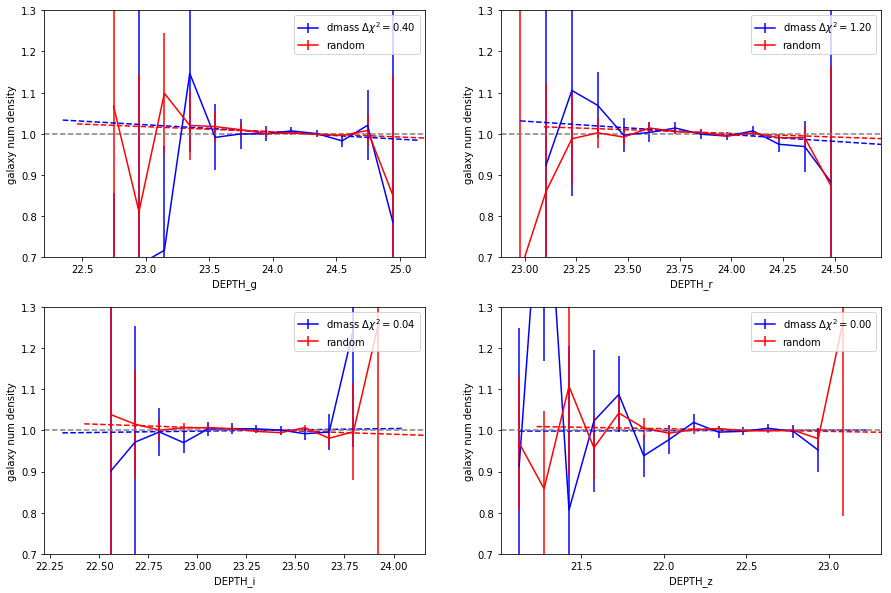

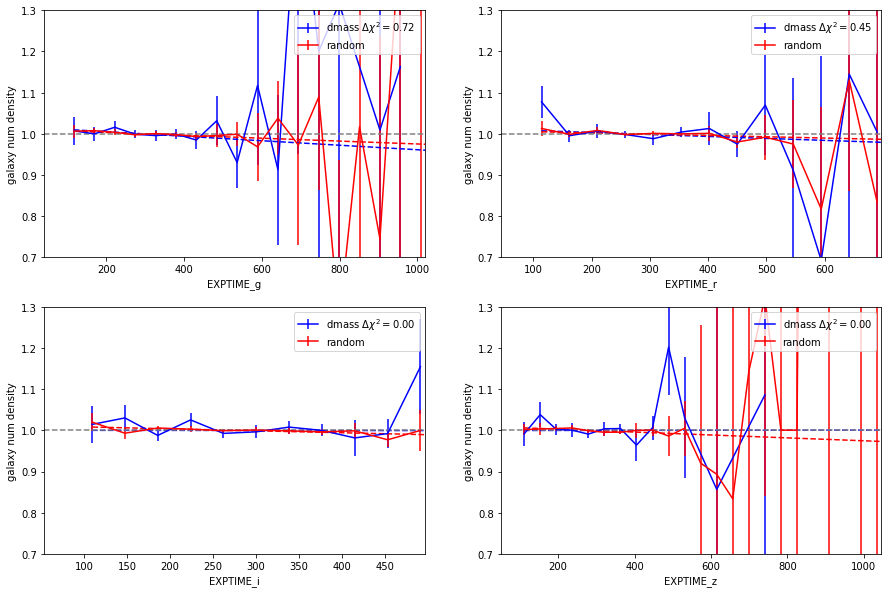

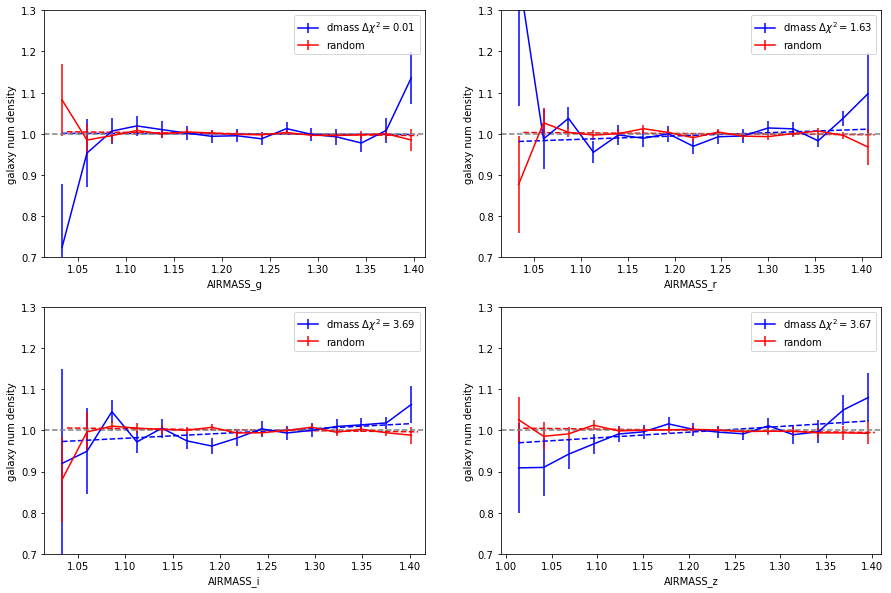

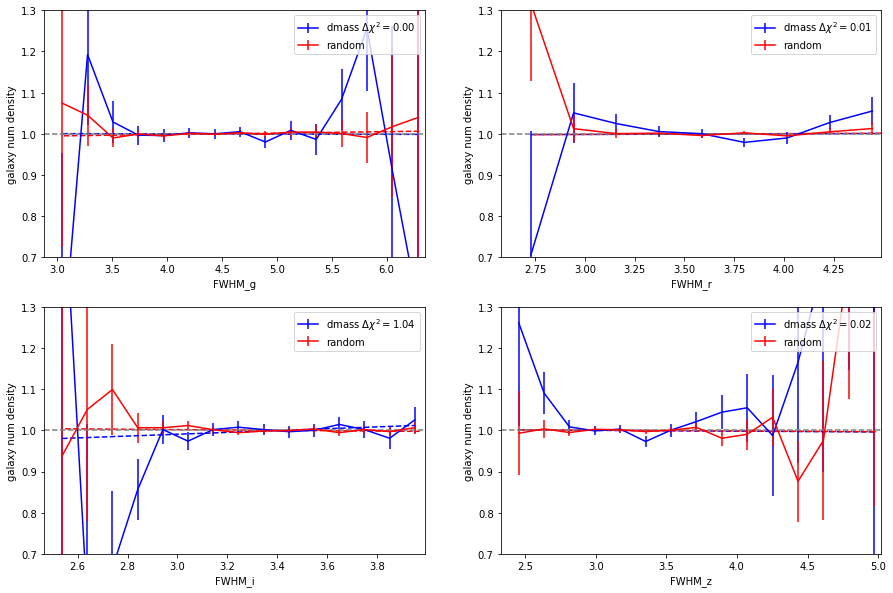

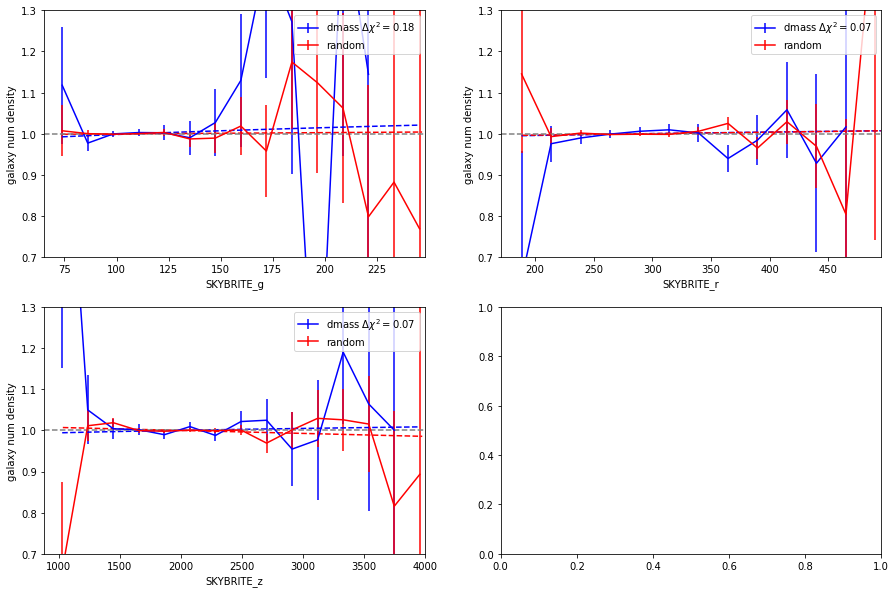

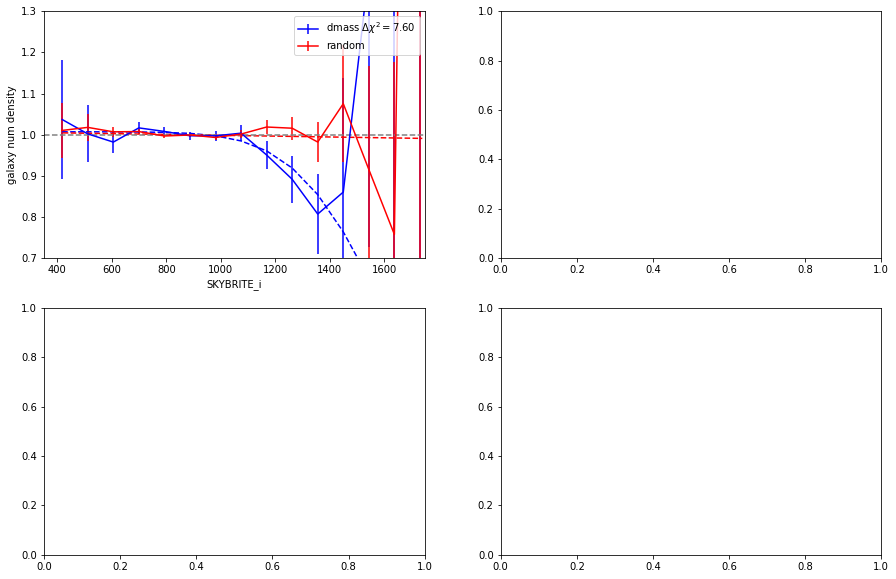

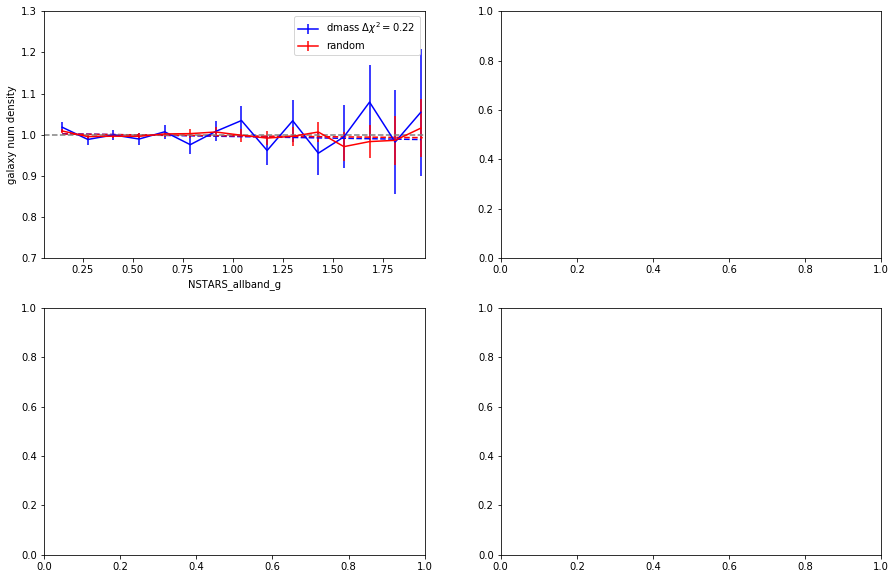

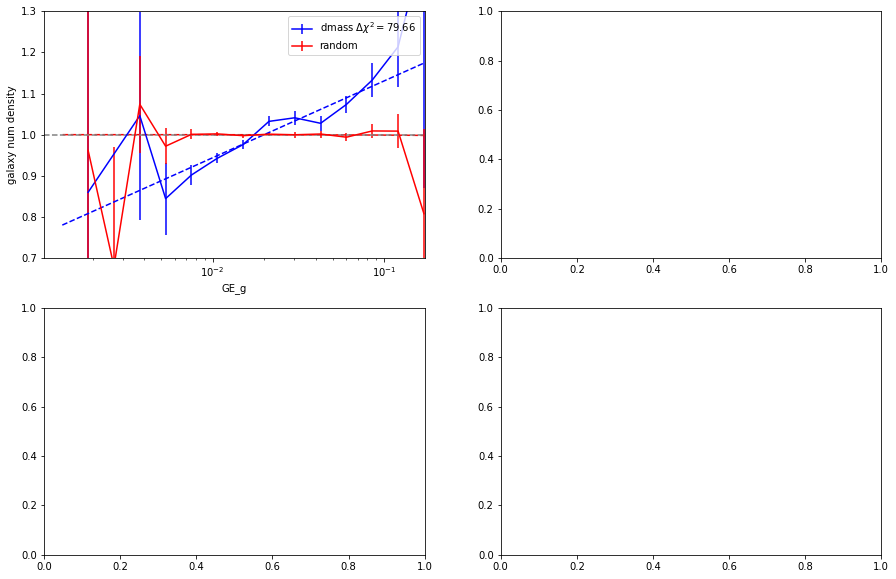

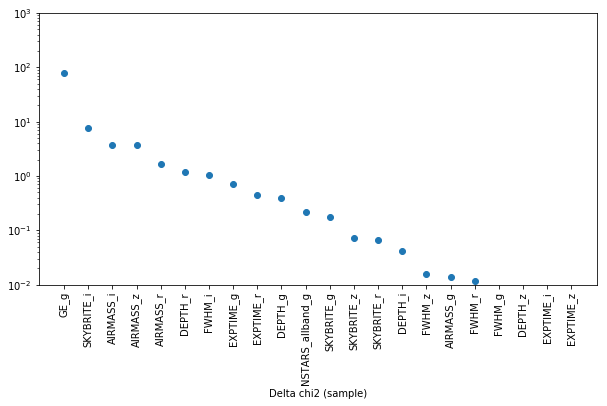

In [89]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_\
airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)

----------------------------------
initialize function  DEPTH_r
linear
108272
store weight  DEPTH_r
save weight to fits ../data_txt/systematics/4th//weights/wg_depth_r_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r.txt
saving data to  ../data_txt/systematics/4th/

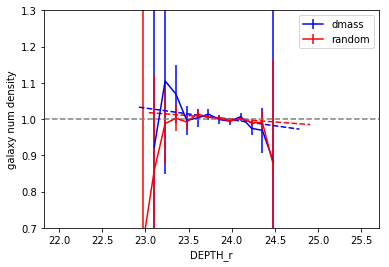

In [90]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i'] *\
* weightDic['SKYBRITE_i']* weightDic['SKYBRITE_r']  * weightDic['AIRMASS_r']  * weightDic['AIRMASS_g'] \
* weightDic['NSTARS_allband_g'] * weightDic['DEPTH_i']  * weightDic['EXPTIME_g'] * weightDic['FWHM_g'] \
* weightDic['FWHM_z'] * weightDic['EXPTIME_z'] 
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_\
airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z'
nextweight = 'DEPTH_r'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  5.092461984083431
chi2_mod. =  5.084122083492117
Delta chi2 (sample) = 0.008339900591313842
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r.txt.model

chi2_null =  3.354675529633482
chi2_mod. =  3.3527246899444343
Delta chi2 (sample) = 0.0019508396890475233
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r.txt.model

chi2_null =  3.5741164860031884
chi2_mod. =  2.625518208478155
Delta chi2 (sample) = 0.9485982775250332
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r.txt.model

chi2_null =  7.308377397148263
ch

(['GE_g',
  'SKYBRITE_i',
  'AIRMASS_i',
  'AIRMASS_z',
  'AIRMASS_r',
  'FWHM_i',
  'DEPTH_i',
  'EXPTIME_i',
  'EXPTIME_z',
  'DEPTH_z',
  'NSTARS_allband_g',
  'SKYBRITE_g',
  'EXPTIME_r',
  'SKYBRITE_r',
  'FWHM_r',
  'SKYBRITE_z',
  'FWHM_g',
  'EXPTIME_g',
  'FWHM_z',
  'DEPTH_g',
  'AIRMASS_g',
  'DEPTH_r'],
 [79.07066129992486,
  7.97279175886387,
  4.262044957437542,
  3.8711945116198017,
  1.8947874876508557,
  1.118391932595454,
  0.9485982775250332,
  0.6198415946874469,
  0.514556580586528,
  0.4611597179352014,
  0.22120516777652988,
  0.09225089682750465,
  0.07298009901754554,
  0.03949151266310302,
  0.038757095529318164,
  0.037482630089925806,
  0.0281484489149193,
  0.014632804928488952,
  0.010460118848870437,
  0.008339900591313842,
  0.0031174072348356674,
  0.0019508396890475233])

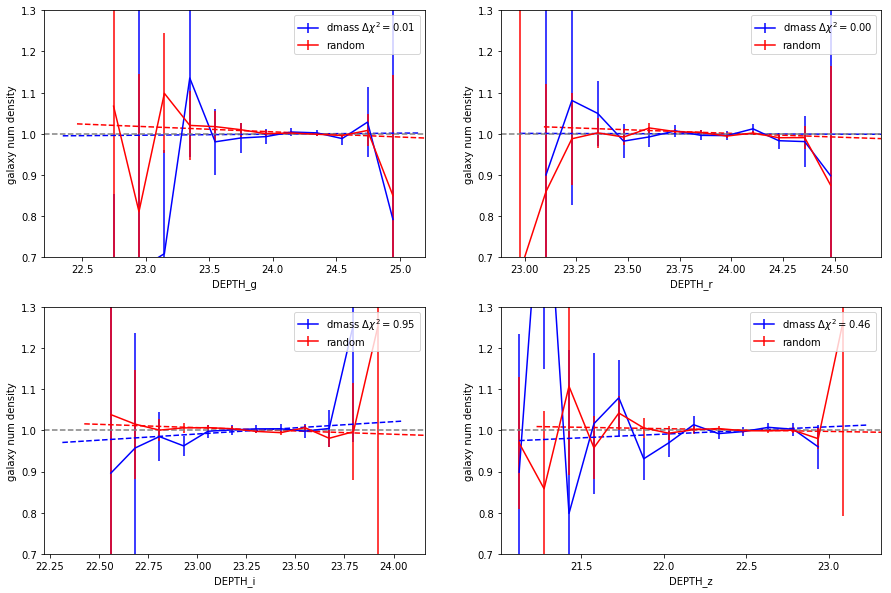

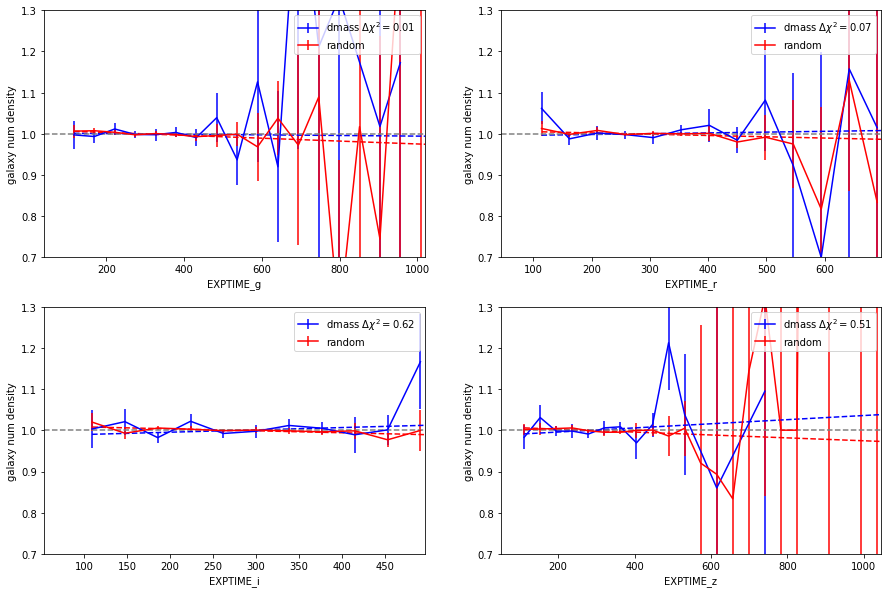

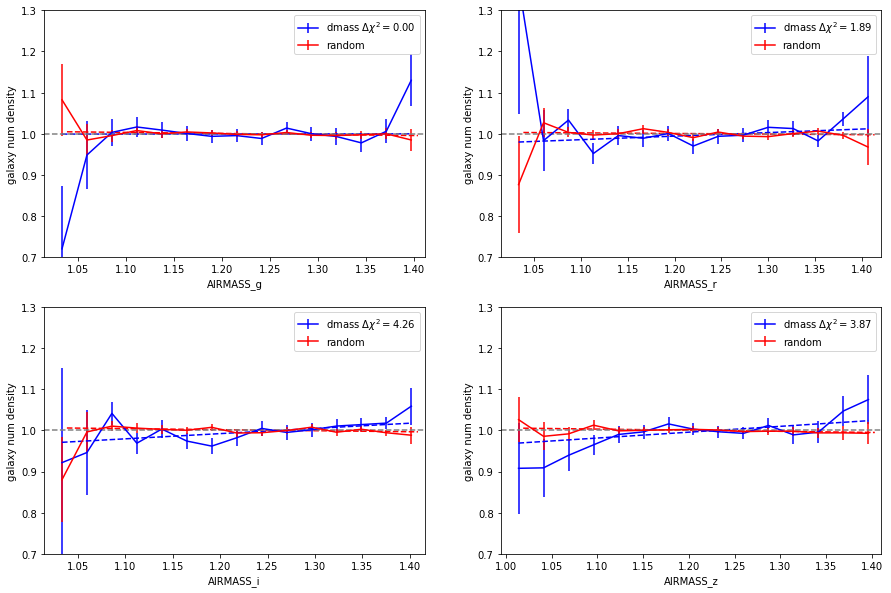

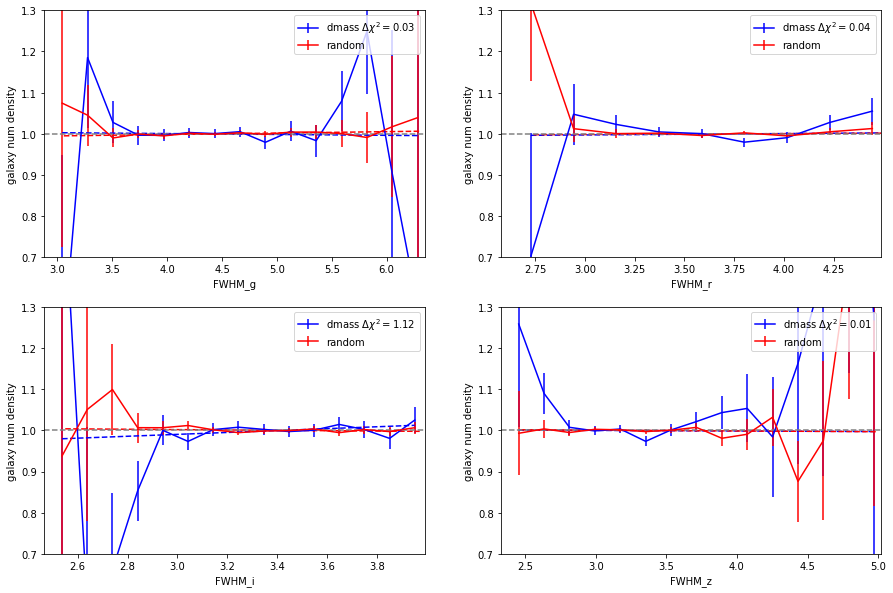

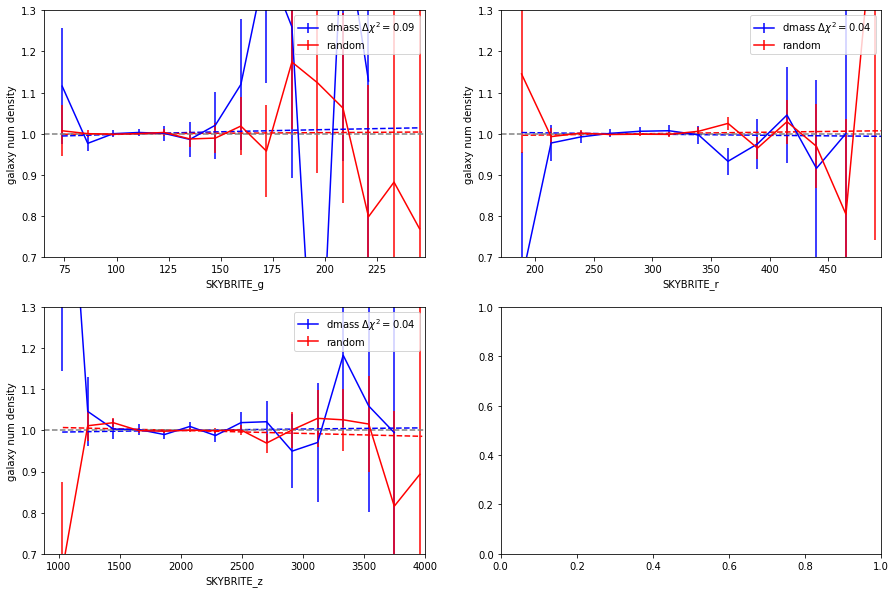

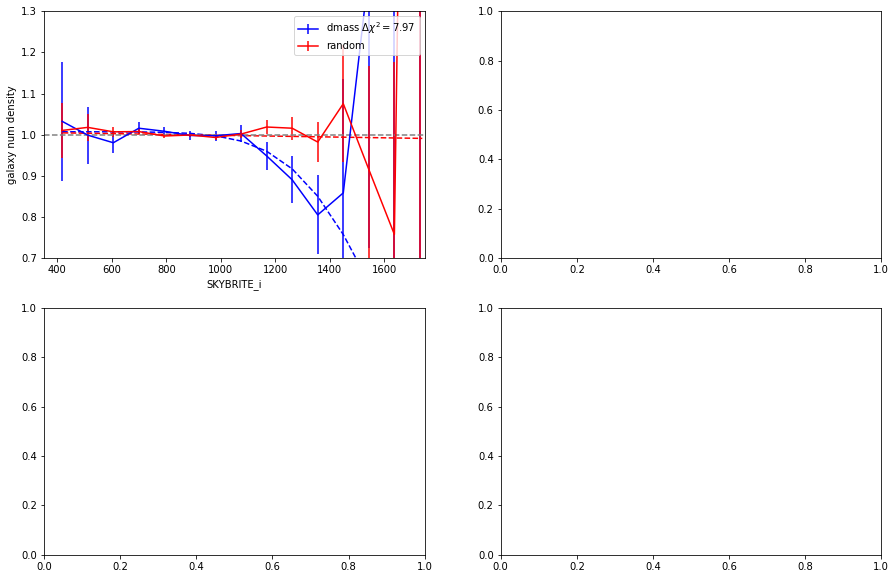

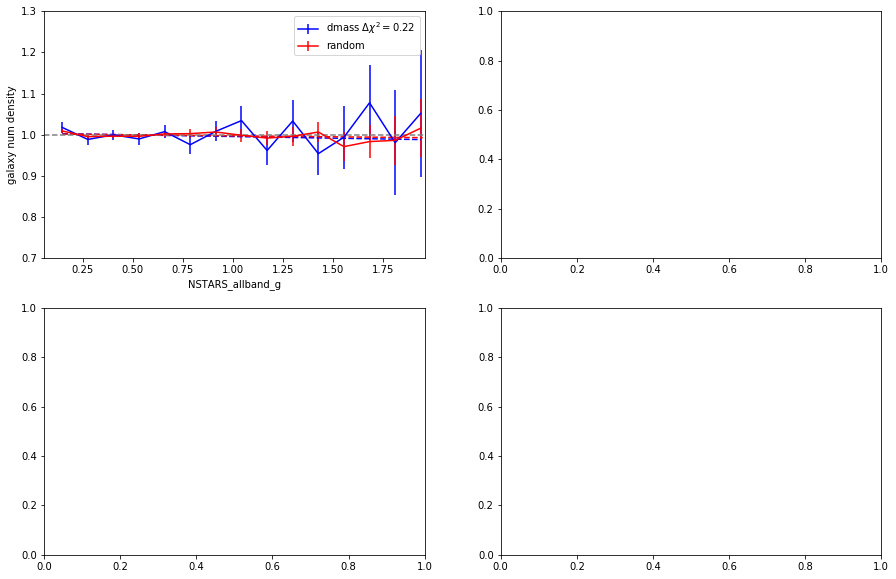

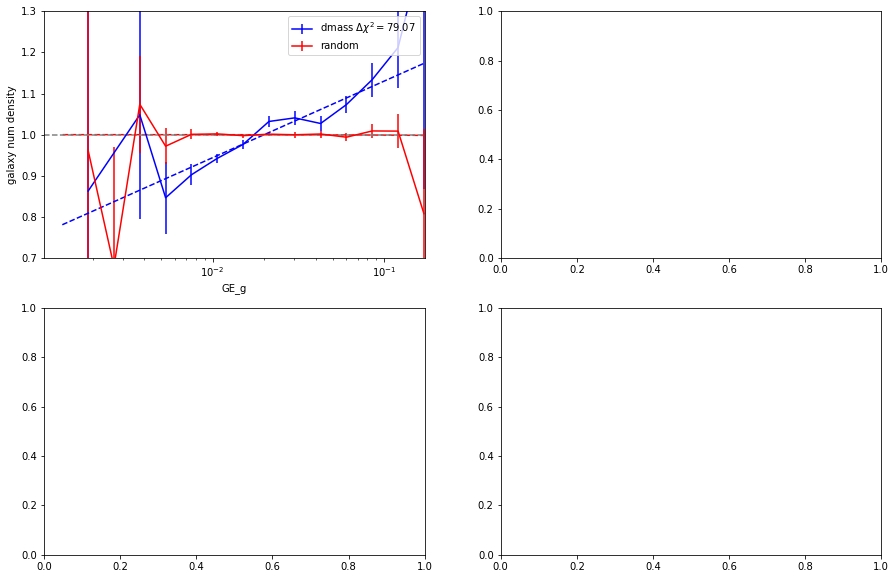

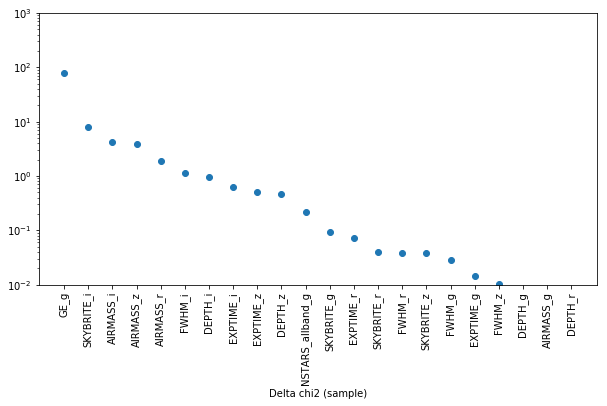

In [91]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_\
airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)

----------------------------------
initialize function  FWHM_i
linear
108272
store weight  FWHM_i
save weight to fits ../data_txt/systematics/4th//weights/wg_fwhm_i_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i.txt
saving data to  ../

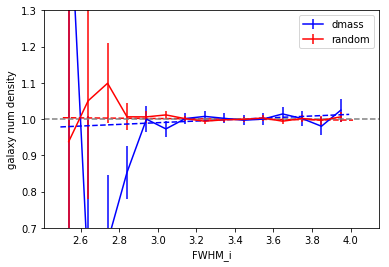

In [100]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i'] *\
* weightDic['SKYBRITE_i']* weightDic['SKYBRITE_r']  * weightDic['AIRMASS_r']  * weightDic['AIRMASS_g'] \
* weightDic['NSTARS_allband_g'] * weightDic['DEPTH_i']  * weightDic['EXPTIME_g'] * weightDic['FWHM_g'] \
* weightDic['FWHM_z'] * weightDic['EXPTIME_z'] * weightDic['DEPTH_r'] 
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_\
airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r'
nextweight = 'FWHM_i'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  5.06883210855318
chi2_mod. =  5.06357978503046
Delta chi2 (sample) = 0.005252323522720204
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i.txt.model

chi2_null =  3.3417196321168054
chi2_mod. =  3.336901765015155
Delta chi2 (sample) = 0.0048178671016505525
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i.txt.model

chi2_null =  3.3006996577942775
chi2_mod. =  2.5847336155486933
Delta chi2 (sample) = 0.7159660422455842
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i.txt.model

chi2_null =  

(['GE_g',
  'SKYBRITE_i',
  'AIRMASS_i',
  'AIRMASS_z',
  'AIRMASS_r',
  'DEPTH_i',
  'EXPTIME_i',
  'EXPTIME_z',
  'DEPTH_z',
  'NSTARS_allband_g',
  'SKYBRITE_g',
  'FWHM_g',
  'EXPTIME_r',
  'SKYBRITE_z',
  'SKYBRITE_r',
  'FWHM_r',
  'FWHM_z',
  'AIRMASS_g',
  'EXPTIME_g',
  'DEPTH_g',
  'DEPTH_r',
  'FWHM_i'],
 [78.61191704339713,
  6.854144611540004,
  5.364826633836994,
  3.9853398316195197,
  2.319024712253988,
  0.7159660422455842,
  0.5965491070864433,
  0.5061990472724274,
  0.44195433334931966,
  0.212984291296884,
  0.10636711621324224,
  0.0724499286834348,
  0.06187745122676702,
  0.05131603663344109,
  0.04705052987365388,
  0.031758640537578486,
  0.031619312679035616,
  0.022490020651961373,
  0.013634463058390445,
  0.005252323522720204,
  0.0048178671016505525,
  0.0037874862960531885])

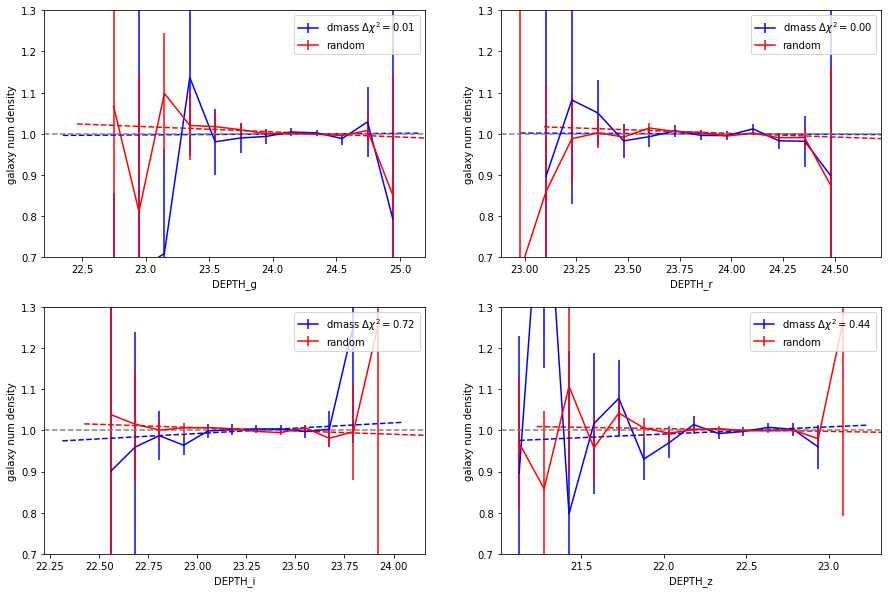

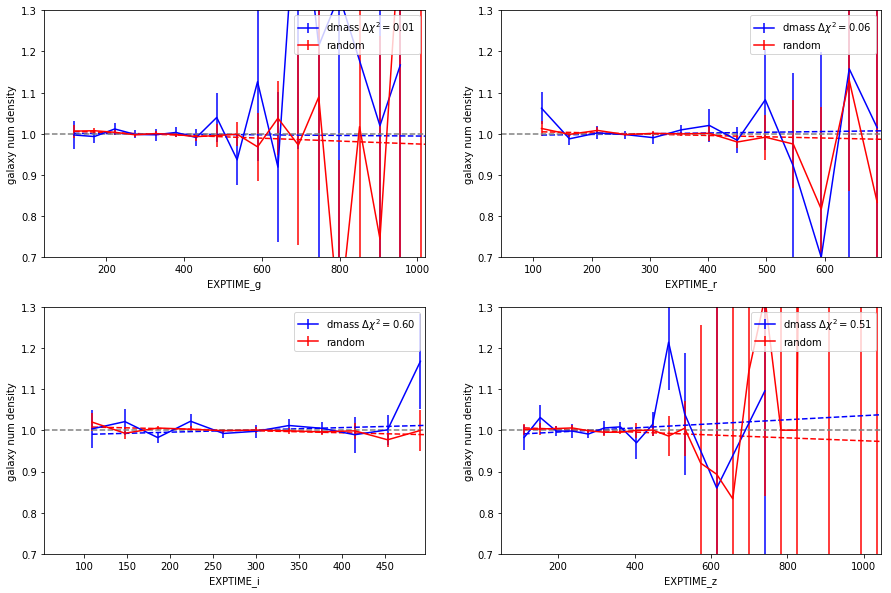

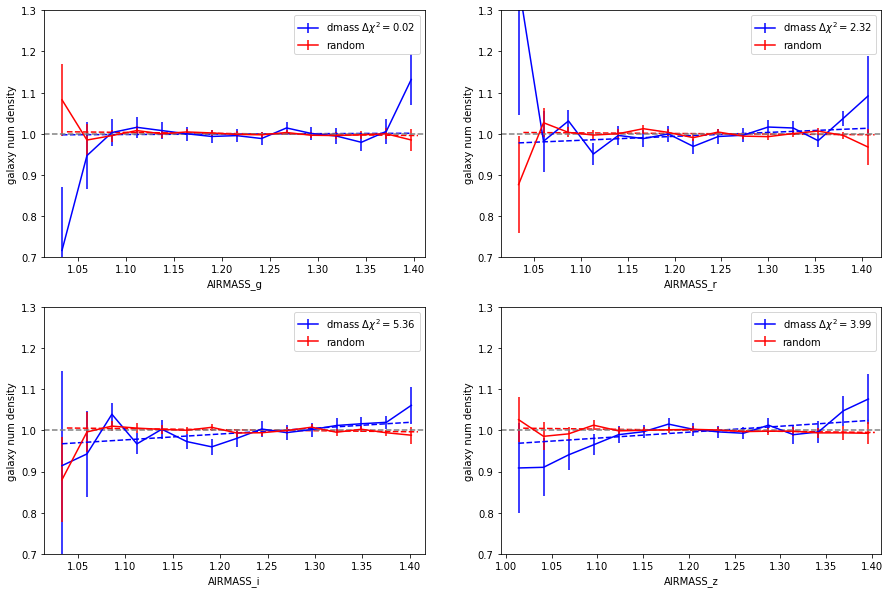

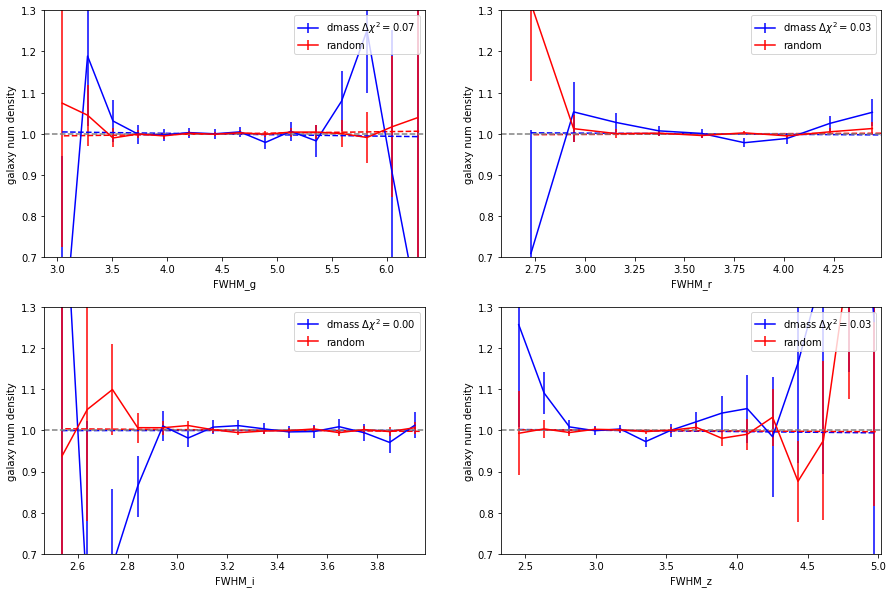

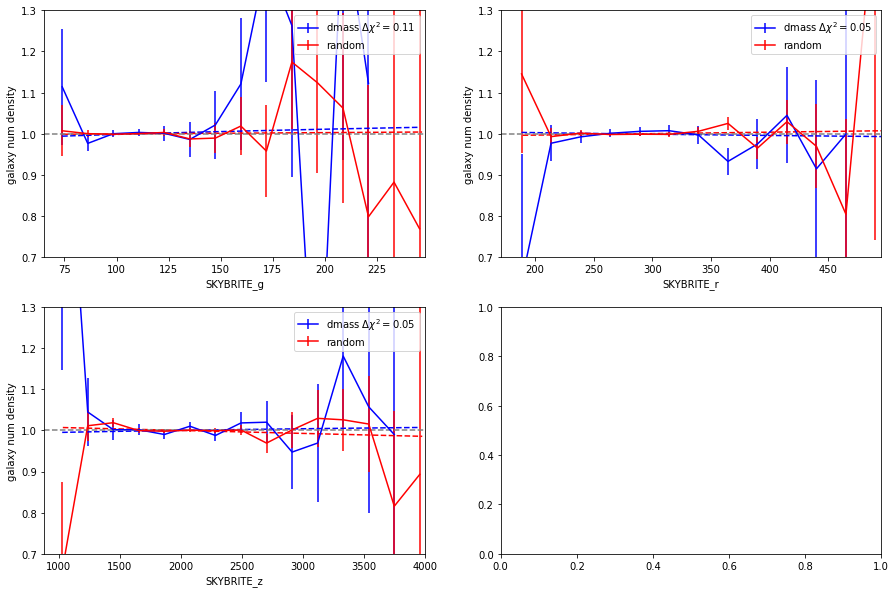

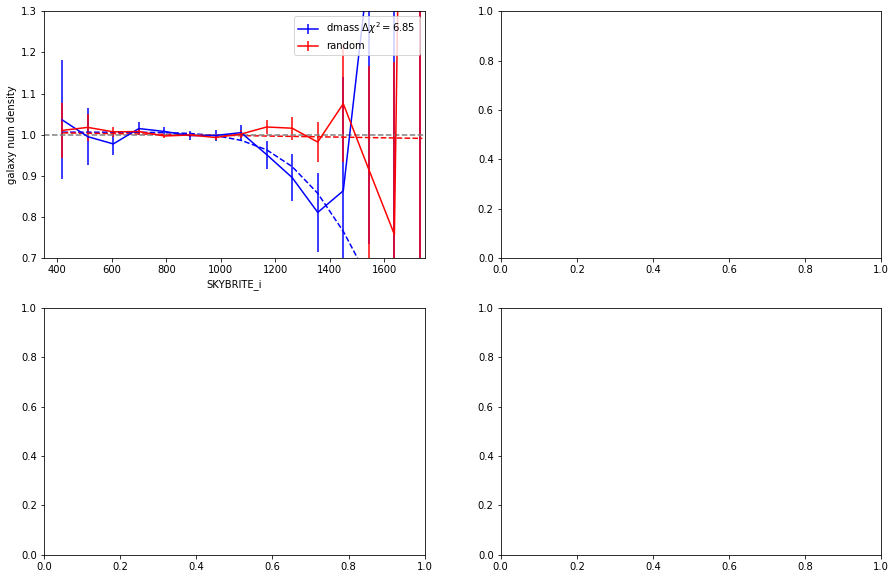

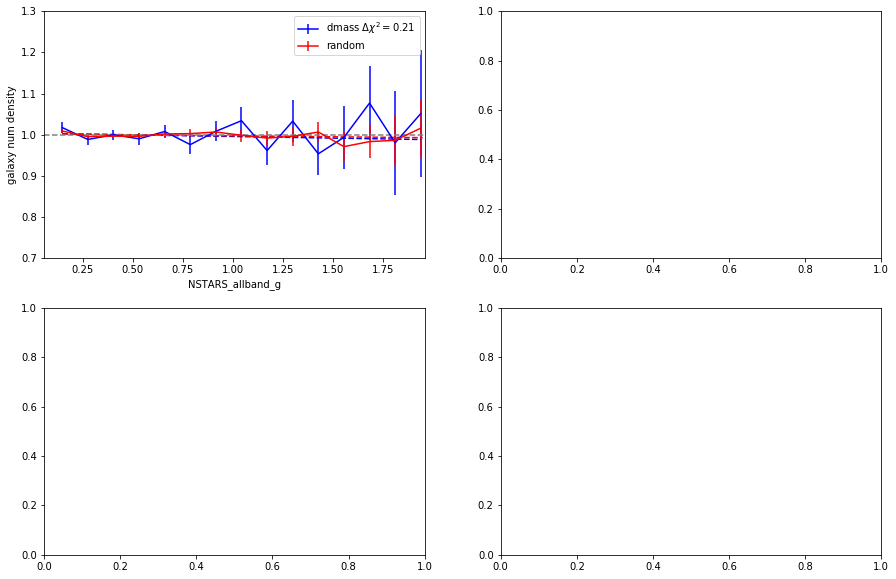

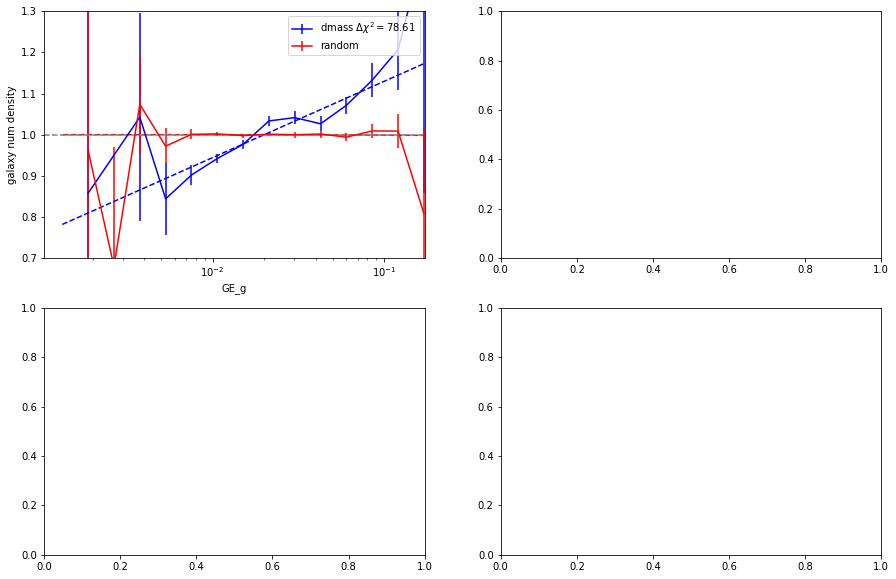

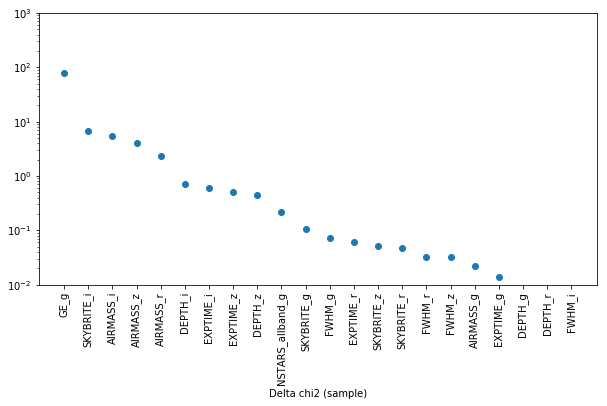

In [102]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_\
airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)

----------------------------------
initialize function  EXPTIME_i
linear
108272
store weight  EXPTIME_i
save weight to fits ../data_txt/systematics/4th//weights/wg_exptime_i_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z

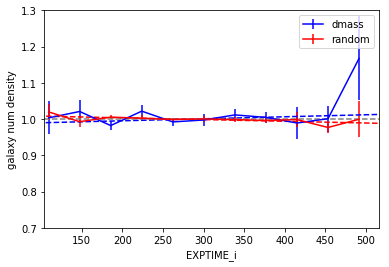

In [103]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i'] *\
* weightDic['SKYBRITE_i']* weightDic['SKYBRITE_r']  * weightDic['AIRMASS_r']  * weightDic['AIRMASS_g'] \
* weightDic['NSTARS_allband_g'] * weightDic['DEPTH_i']  * weightDic['EXPTIME_g'] * weightDic['FWHM_g'] \
* weightDic['FWHM_z'] * weightDic['EXPTIME_z'] * weightDic['DEPTH_r'] * weightDic['FWHM_i'] 
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_\
airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i'
nextweight = 'EXPTIME_i'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  5.5524328020049305
chi2_mod. =  5.394025720235957
Delta chi2 (sample) = 0.15840708176897333
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i.txt.model

chi2_null =  3.719862642430223
chi2_mod. =  3.323154415033816
Delta chi2 (sample) = 0.3967082273964069
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i.txt.model

chi2_null =  2.7885980630001947
chi2_mod. =  2.7377533025752125
Delta chi2 (sample) = 0.050844760424982205
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_expt

(['GE_g',
  'SKYBRITE_i',
  'AIRMASS_i',
  'AIRMASS_z',
  'AIRMASS_r',
  'EXPTIME_g',
  'DEPTH_r',
  'NSTARS_allband_g',
  'DEPTH_g',
  'EXPTIME_r',
  'SKYBRITE_g',
  'SKYBRITE_z',
  'DEPTH_i',
  'DEPTH_z',
  'FWHM_g',
  'FWHM_r',
  'FWHM_z',
  'EXPTIME_z',
  'SKYBRITE_r',
  'AIRMASS_g',
  'FWHM_i',
  'EXPTIME_i'],
 [77.25935818771615,
  6.626083932876821,
  5.0505952816684285,
  3.850915450268449,
  2.118837459220435,
  0.44248047757545184,
  0.3967082273964069,
  0.27218426218876424,
  0.15840708176897333,
  0.14457158318537378,
  0.10997946762163124,
  0.07302669323138922,
  0.050844760424982205,
  0.04326251393449798,
  0.042472241271182654,
  0.03775683464574442,
  0.0376328745189749,
  0.025327590226810415,
  0.01487626618016158,
  0.0058164710953203524,
  0.0034612739711601392,
  0.0019931687132945797])

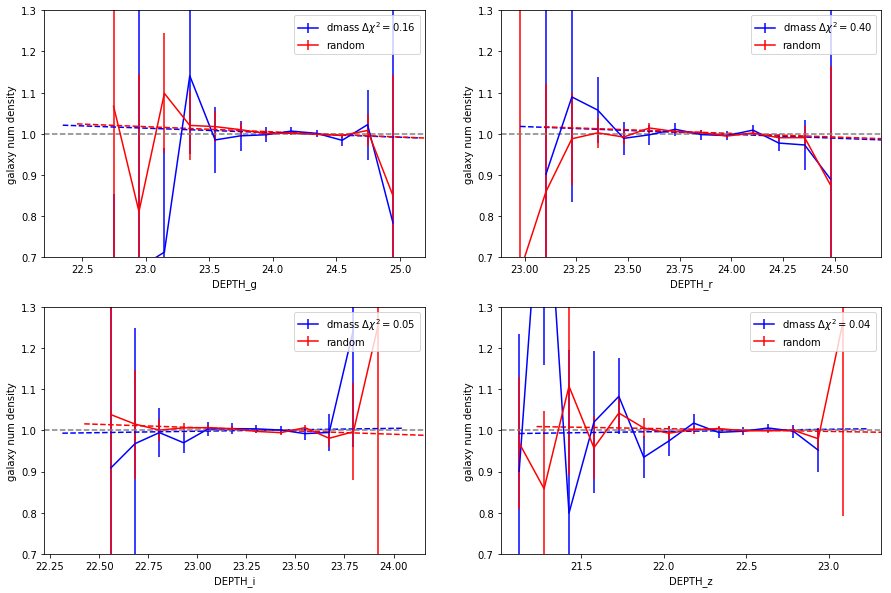

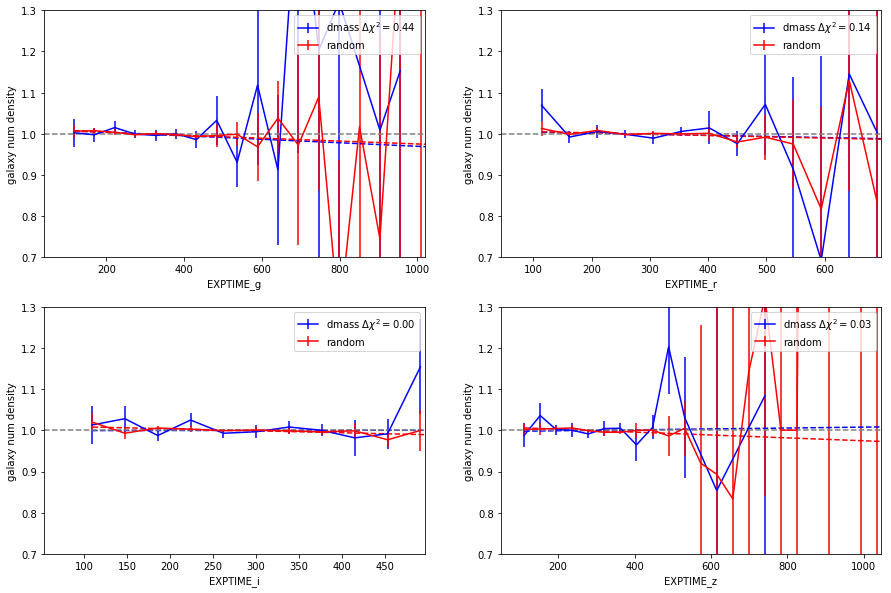

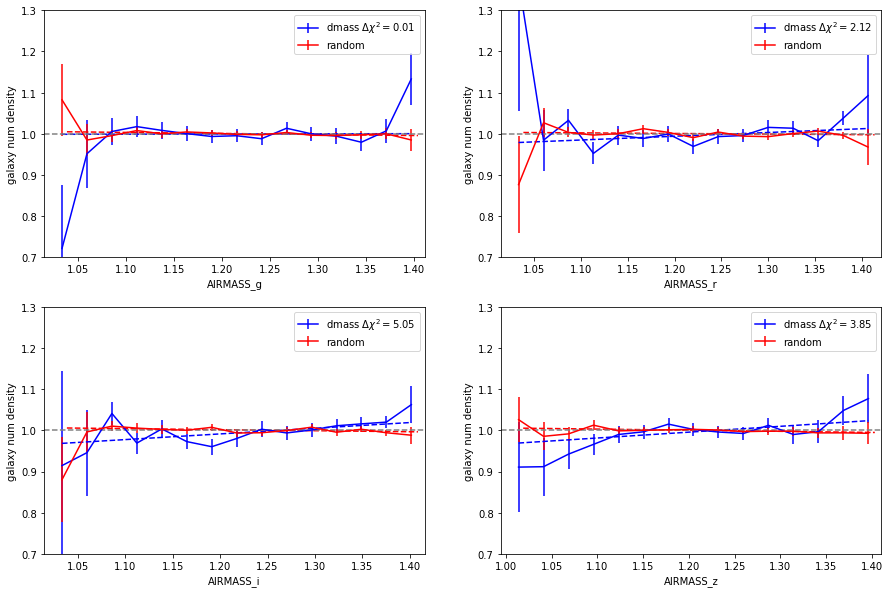

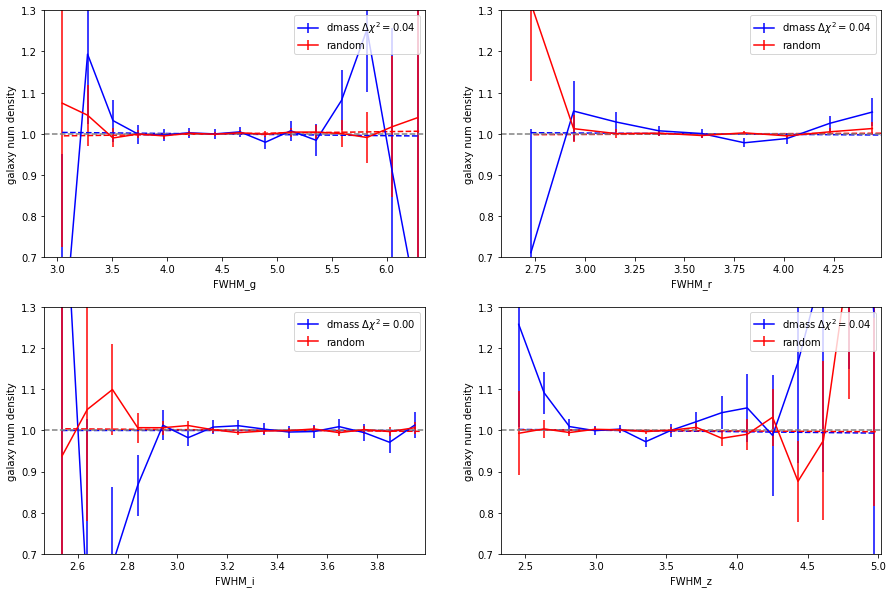

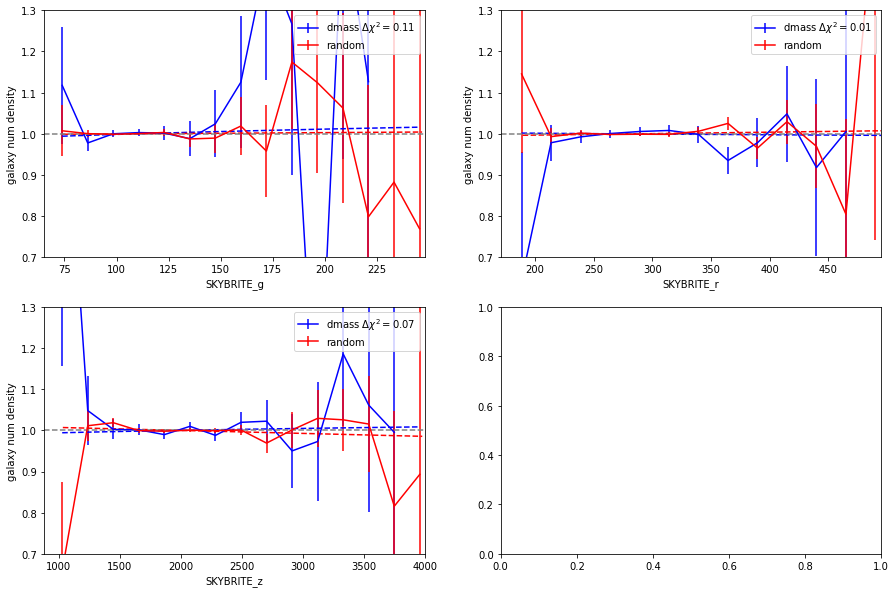

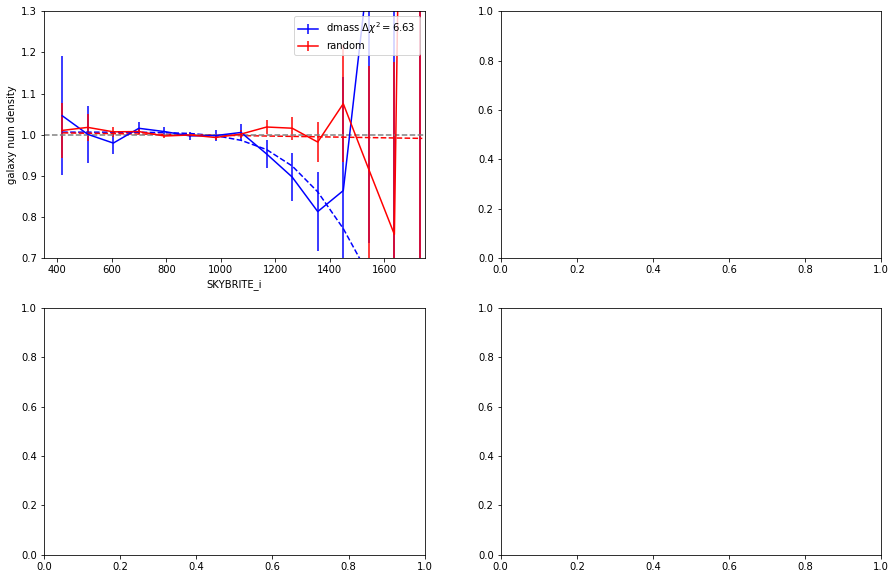

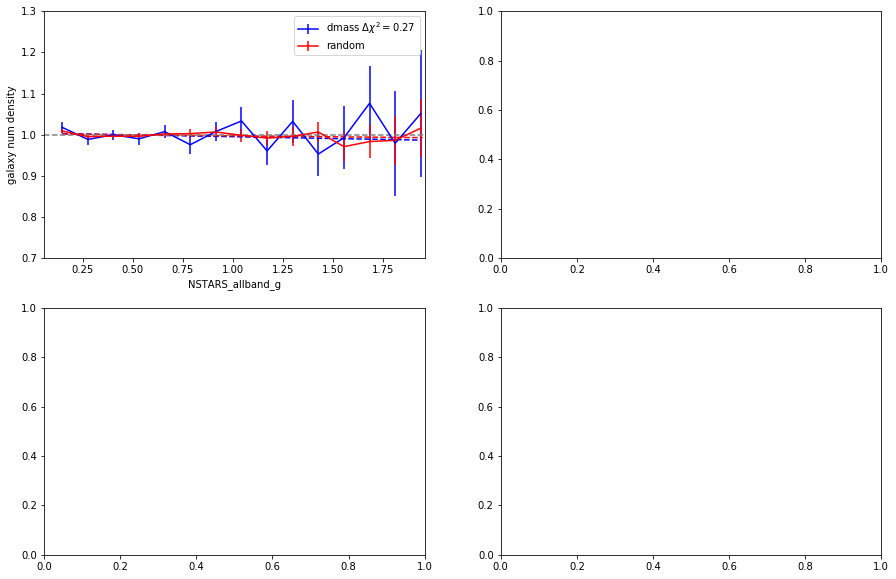

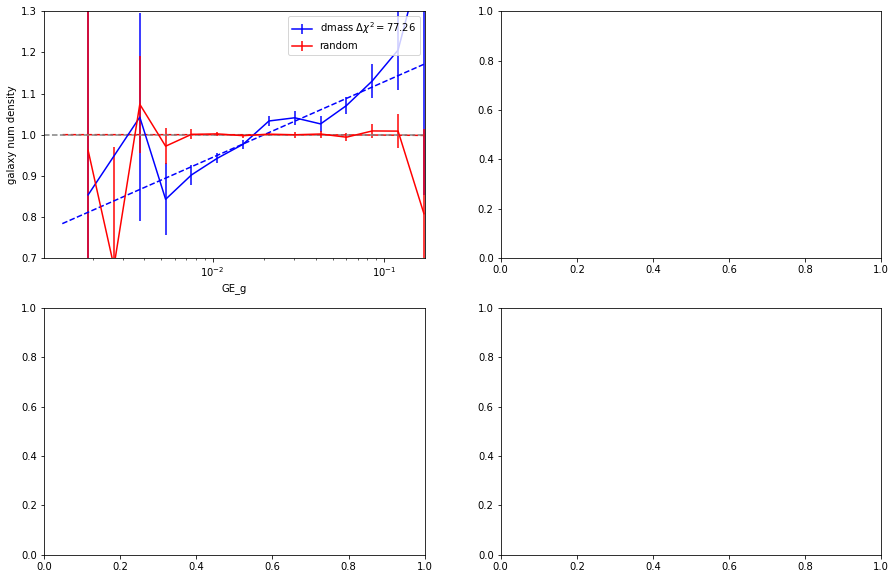

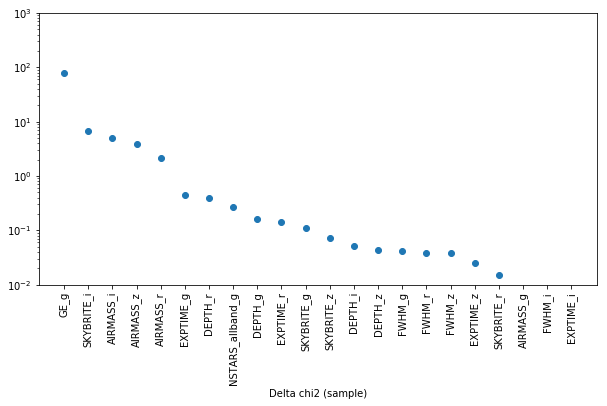

In [113]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_\
airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)

----------------------------------
initialize function  DEPTH_g
linear
108272
store weight  DEPTH_g
save weight to fits ../data_txt/systematics/4th//weights/wg_depth_g_SPT.fits
suffix =  wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g.txt
saving data to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_

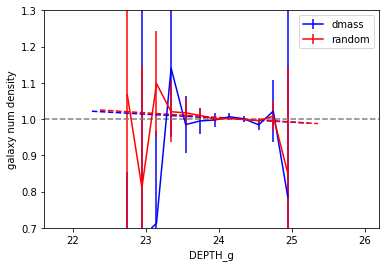

In [114]:
all_weight = weightDic['noweight'] * weightDic['FWHM_r'] * weightDic['AIRMASS_z'] * weightDic['AIRMASS_i'] *\
* weightDic['SKYBRITE_i']* weightDic['SKYBRITE_r']  * weightDic['AIRMASS_r']  * weightDic['AIRMASS_g'] \
* weightDic['NSTARS_allband_g'] * weightDic['DEPTH_i']  * weightDic['EXPTIME_g'] * weightDic['FWHM_g'] \
* weightDic['FWHM_z'] * weightDic['EXPTIME_z'] * weightDic['DEPTH_r'] * weightDic['FWHM_i']*weightDic['EXPTIME_i'] 
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_\
airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i'
nextweight = 'DEPTH_g'

sys_iteration( nextweight=nextweight, suffix=suffix, all_weight = all_weight, 
                  cat1=dmass_masked, cat2=rand_masked, rand1 = rand2_masked, rand2=rand2_masked,
                  sysMap = sysMap, nside=4096, kind='SPT', function='linear', function2 = None,
                  properties = properties, filters=['g', 'r', 'i', 'z'],
                  path=inputdir, plot=True, weightDic=weightDic, FullArea=SPTMaparea )

chi2_null =  6.732564626944481
chi2_mod. =  5.929251219357381
Delta chi2 (sample) = 0.8033134075871002
output save to  ../data_txt/systematics/4th/systematic_DEPTH_g_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g.txt.model

chi2_null =  4.48642230714307
chi2_mod. =  3.376037639994839
Delta chi2 (sample) = 1.1103846671482311
output save to  ../data_txt/systematics/4th/systematic_DEPTH_r_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g.txt.model

chi2_null =  2.973317791143142
chi2_mod. =  2.9503934250227113
Delta chi2 (sample) = 0.022924366120430584
output save to  ../data_txt/systematics/4th/systematic_DEPTH_i_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r

(['GE_g',
  'SKYBRITE_i',
  'AIRMASS_i',
  'AIRMASS_z',
  'AIRMASS_r',
  'EXPTIME_g',
  'DEPTH_r',
  'DEPTH_g',
  'EXPTIME_r',
  'NSTARS_allband_g',
  'EXPTIME_i',
  'EXPTIME_z',
  'FWHM_g',
  'SKYBRITE_g',
  'SKYBRITE_z',
  'FWHM_r',
  'FWHM_z',
  'DEPTH_i',
  'DEPTH_z',
  'SKYBRITE_r',
  'FWHM_i',
  'AIRMASS_g'],
 [76.63304645210606,
  6.674241379779318,
  4.6723353200222775,
  3.7235289503912483,
  1.8977425723413361,
  1.7972944565671236,
  1.1103846671482311,
  0.8033134075871002,
  0.7835517094931435,
  0.28870964024891066,
  0.22489307770364242,
  0.08849568785302608,
  0.07545819320633207,
  0.06489724132092078,
  0.06453543204467493,
  0.04091568185483041,
  0.036387017783725994,
  0.022924366120430584,
  0.02259164803386149,
  0.011270323144374927,
  0.0033770948246107935,
  0.002529356153690543])

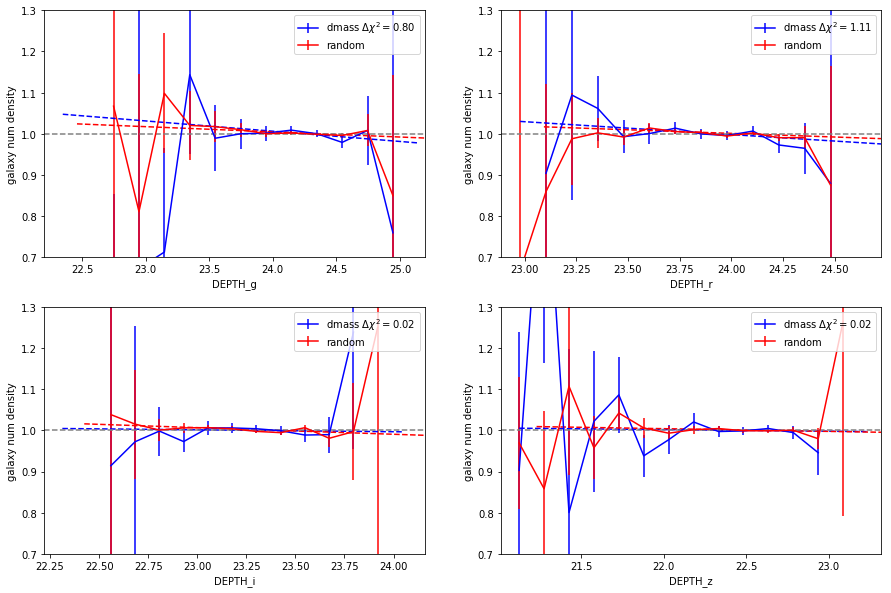

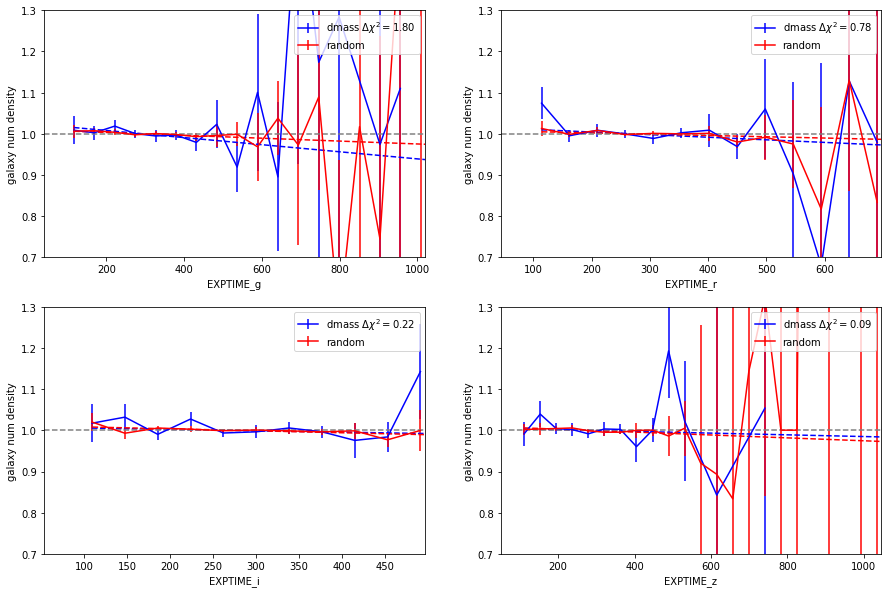

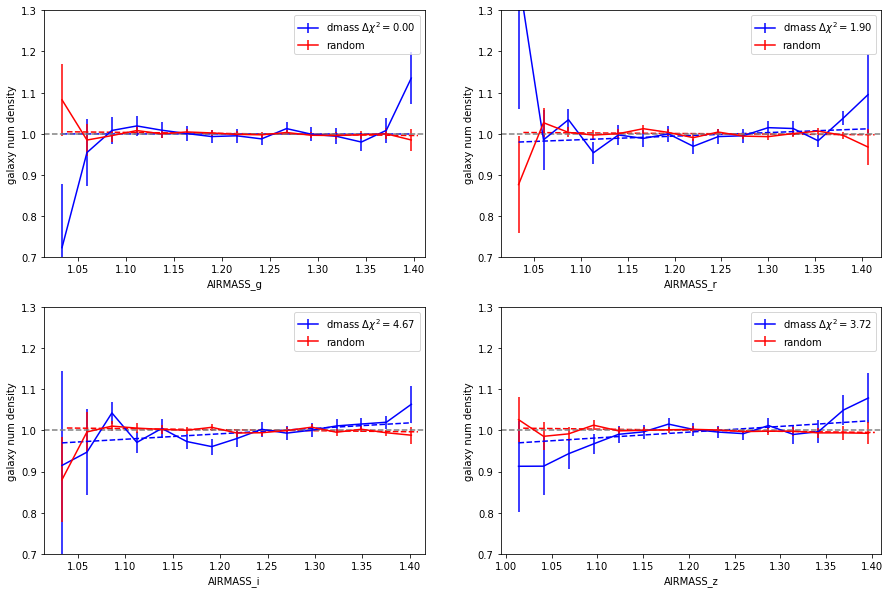

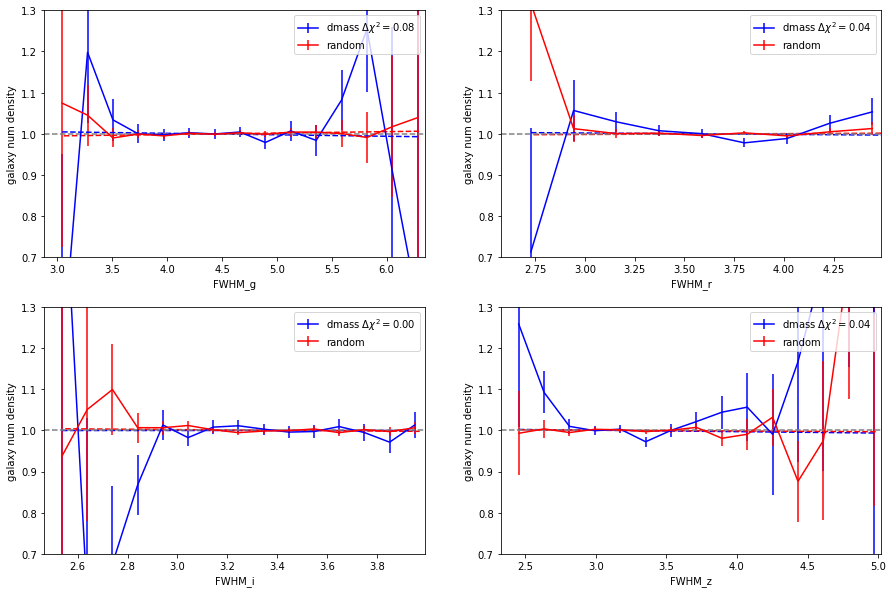

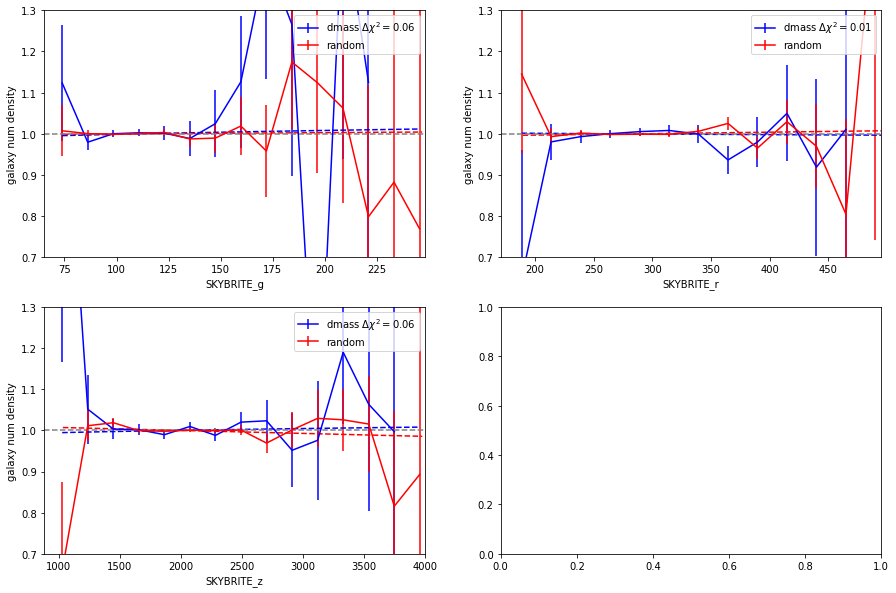

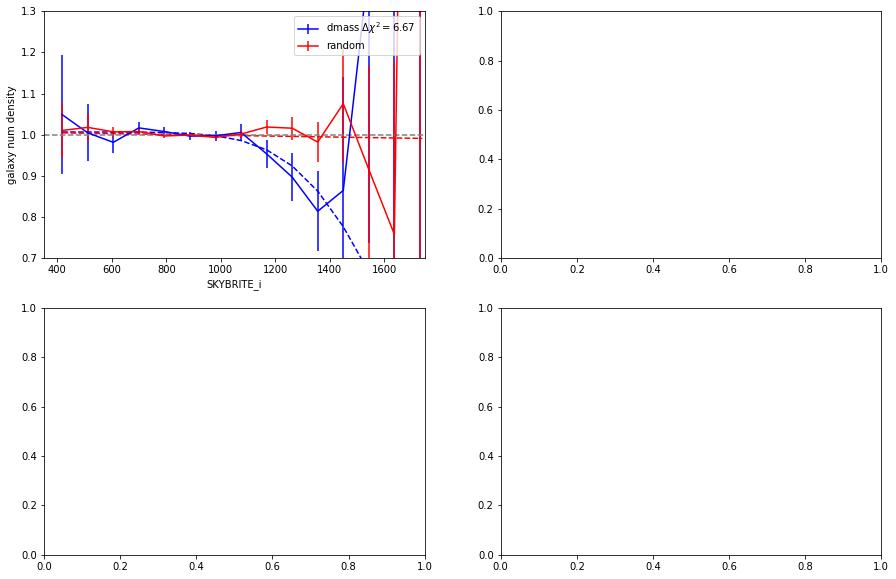

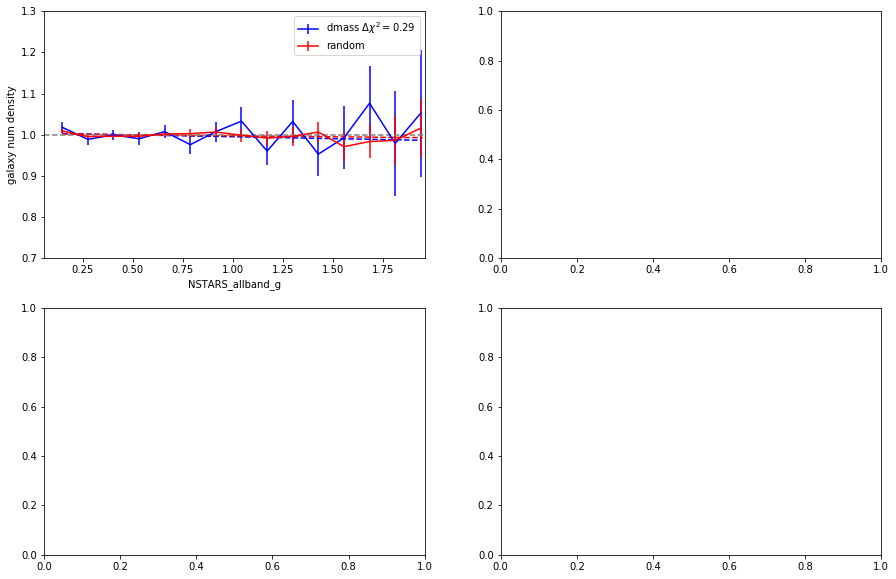

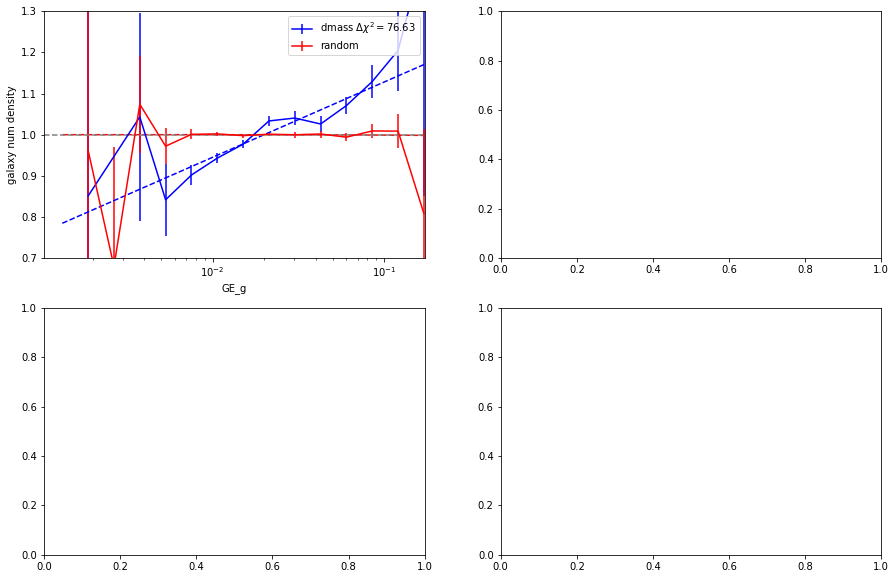

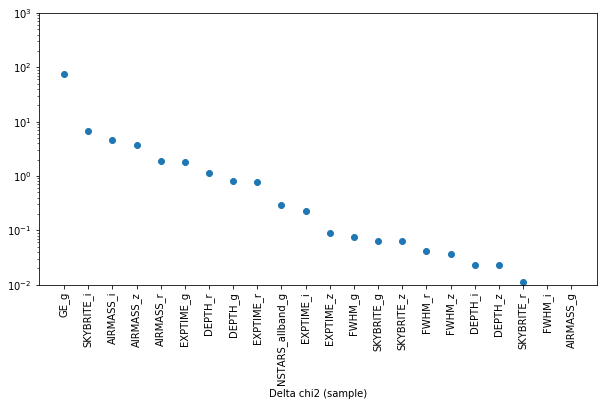

In [119]:
suffix = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_\
airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g'
filters = ['g', 'r', 'i', 'z']

fitting_SP( property = ['DEPTH', 'EXPTIME', 'AIRMASS', 'FWHM'], filter=filters, kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter= ['g', 'r', 'z'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'sqrt',
                path = inputdir )

fitting_SP( property = ['SKYBRITE'], filter=['i'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'errftn',
            path = inputdir )

fitting_SP( property = ['NSTARS_allband'], filter=['g'], kind = 'SPT', 
           suffix=suffix, plot=True, function = 'linear',
                path = inputdir )

fitting_SP( property = ['GE'], filter=['g'], kind = 'SPT', suffix=suffix, plot=True, function = 'log',
                path = inputdir )



plotting_significance( property = properties, filter=['g', 'r', 'i','z'], kind = kind, 
                      suffix=suffix, 
                path = inputdir, deltachi2=True)

In [140]:
suffix

'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g'

[79.83735512899429, 53.49617865476577, 28.509744706065348, 26.760437131711505, 18.367289560103742, 17.471874037287286, 13.953920005412595, 11.590416835281749, 7.180282678905282, 5.015956513125536, 3.9620365550386714, 1.8176606759773017, 1.042187768236305, 0.8288005497627875, 0.6149681116305241, 0.45263595633948484, 0.2764250508388004, 0.13316766113053813, 0.12007363708290963, 0.11243766010556655, 0.010894676698766759, 0.005140852971523557]
[76.63304645210606, 6.674241379779318, 4.6723353200222775, 3.7235289503912483, 1.8977425723413361, 1.7972944565671236, 1.1103846671482311, 0.8033134075871002, 0.7835517094931435, 0.28870964024891066, 0.22489307770364242, 0.08849568785302608, 0.07545819320633207, 0.06489724132092078, 0.06453543204467493, 0.04091568185483041, 0.036387017783725994, 0.022924366120430584, 0.02259164803386149, 0.011270323144374927, 0.0033770948246107935, 0.002529356153690543]


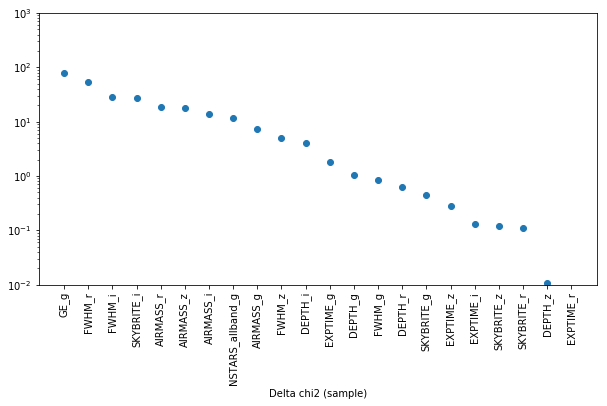

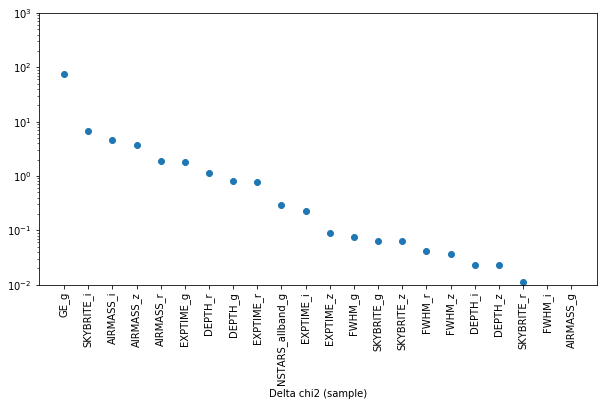

In [153]:
label_no_weight, values_no_weight = \
plotting_significance( property = properties, filter=filters, kind = kind, suffix='no_weight', 
                    path = inputdir, deltachi2=True)


#suf = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z'

suf = 'wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r\
_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z\
_exptime_z_depth_r_fwhm_i_exptime_i_depth_g'
label_full_weight, values_full_weight = \
plotting_significance( property = properties, filter=filters, kind = kind, suffix=suf, 
                    path = inputdir, deltachi2=True)
#_ = plotting_significance( property = properties, filter=filters, kind = kind, suffix='1', 
#                    path = path, deltachi2=False)

In [155]:
inputdir

'../data_txt/systematics/4th/'

In [156]:
print 'chisquare_'+suffix+'.png'

chisquare_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g.png


fig save to  ../data_txt/systematics/4th/chisquare_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g.png


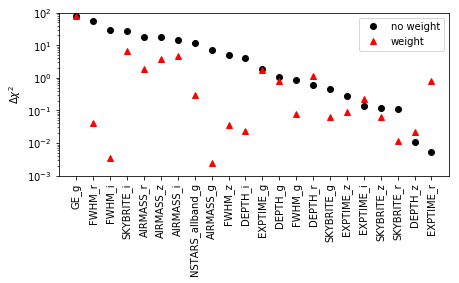

In [158]:

values_full_weight_reorder = []
for la in label_no_weight:
    for j in range(len(label_full_weight)):
        if la == label_full_weight[j]: 
            values_full_weight_reorder.append(values_full_weight[j])
            break

values_full_weight_reorder = np.array(values_full_weight_reorder)

fig, ax = plt.subplots(figsize = (7,3))

ax.plot( np.arange( len(values_no_weight) ), values_no_weight,  'ko' , label='no weight'  )
ax.plot( np.arange( len(values_no_weight) ), values_full_weight_reorder, 'r^', label='weight'  )


#ax.plot( values_no_weight, np.arange( len(values_no_weight) ),  'ko'  )
#ax.plot( values_full_weight_reorder, np.arange( len(values_no_weight) ),  'ro'  )
#ax.axhline(y = 1, ls = '--', color='grey')
#ax.axhline(y = 3, ls = '--', color='grey')
ax.set_ylim(0.001,100)
ax.set_ylabel(r'$\Delta \chi^2$')
ax.set_xticks( np.arange(len(values_no_weight)))
ax.set_xticklabels(label_no_weight, rotation = 90)
ax.set_yscale('log')
ax.legend(loc='best')

fig.savefig(inputdir + 'chisquare_'+suffix+'.png')
print 'fig save to ', inputdir + 'chisquare_'+suffix+'.png'

saving fig to  ../data_txt/systematics/4th/figure/comparison_systematic_GE_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g.png


0

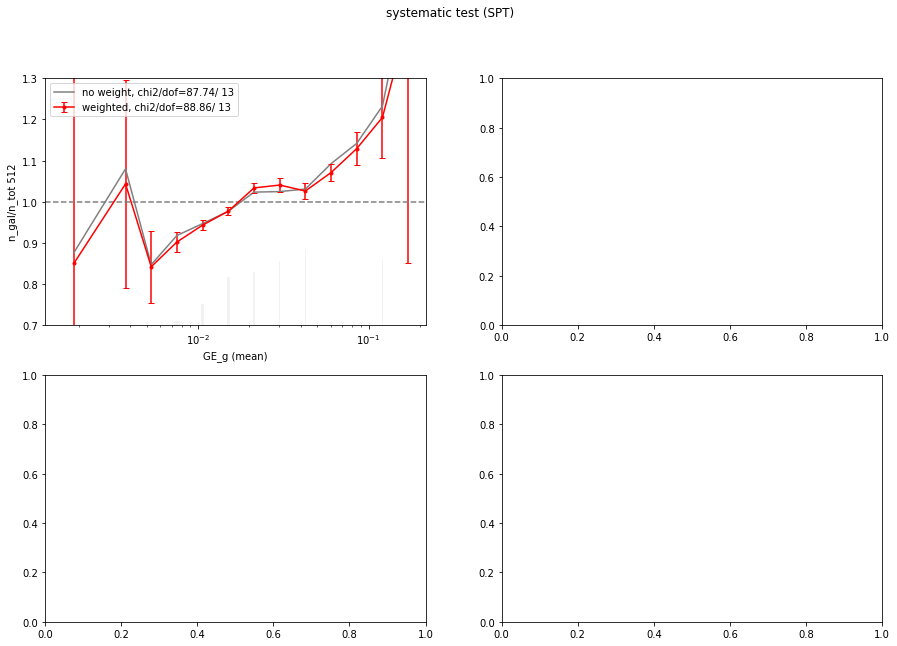

In [129]:
from systematics_module.contCorrection import plot_sysweight
plot_sysweight(property = 'GE', nside = 1024, kind = 'SPT', 
           suffix1='no_weight', suffix2=suffix, inputdir1 = inputdir, inputdir2 = inputdir, outdir=figoutdir)

saving fig to  ../data_txt/systematics/4th/figure/comparison_systematic_DEPTH_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g.png
saving fig to  ../data_txt/systematics/4th/figure/comparison_systematic_EXPTIME_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g.png
saving fig to  ../data_txt/systematics/4th/figure/comparison_systematic_AIRMASS_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth_g.png
saving fig to  ../data_txt/systematics/4th/figure/comparison_systematic_SKYBRITE_SPT_wg_fwhm_r_airmass_z_airmass_i_skybrite_i_skybrite_r_airmass_r_airmass_g_nstars_allband_g_depth_i_exptime_g_fwhm_g_fwhm_z_exptime_z_depth_r_fwhm_i_exptime_i_depth

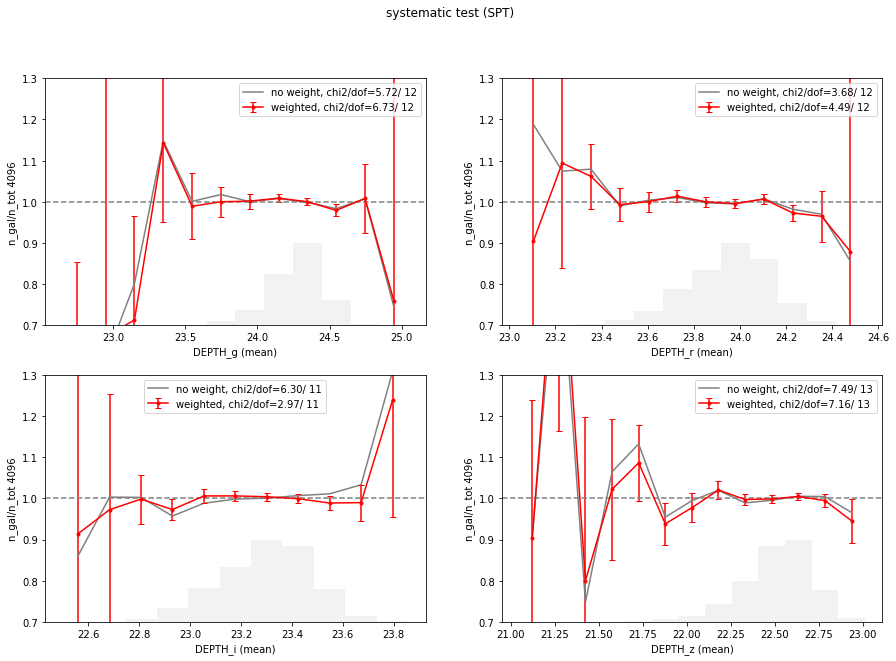

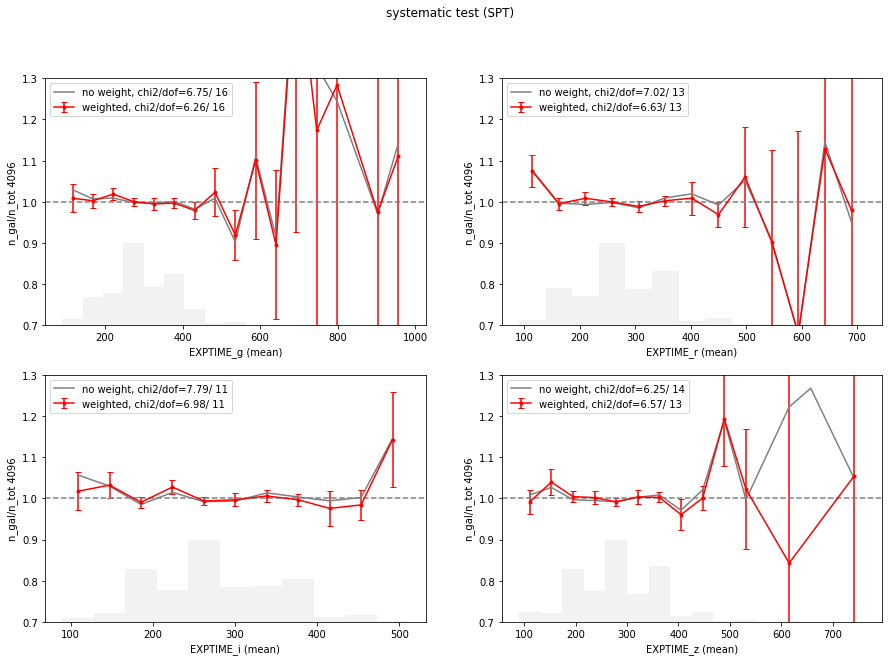

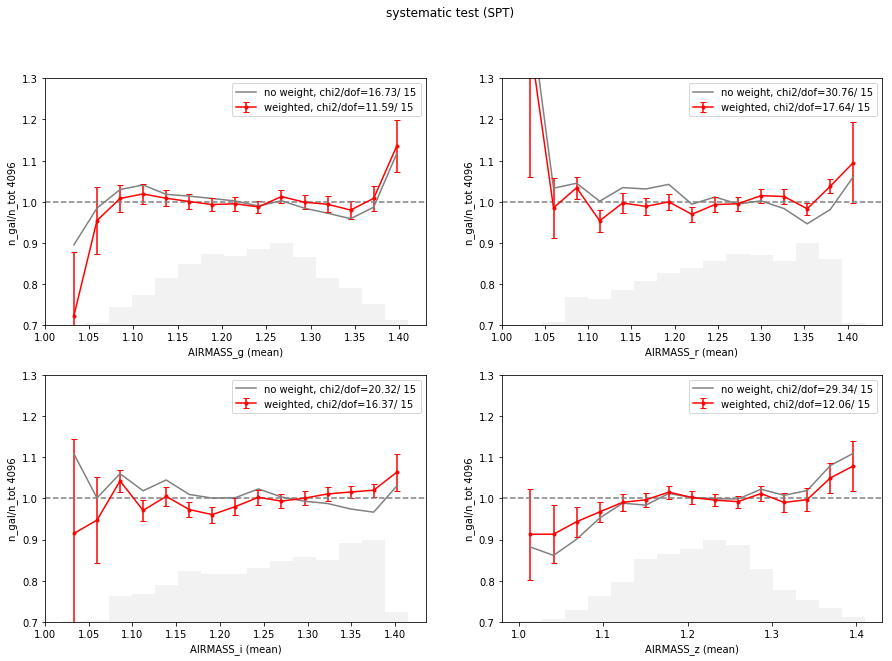

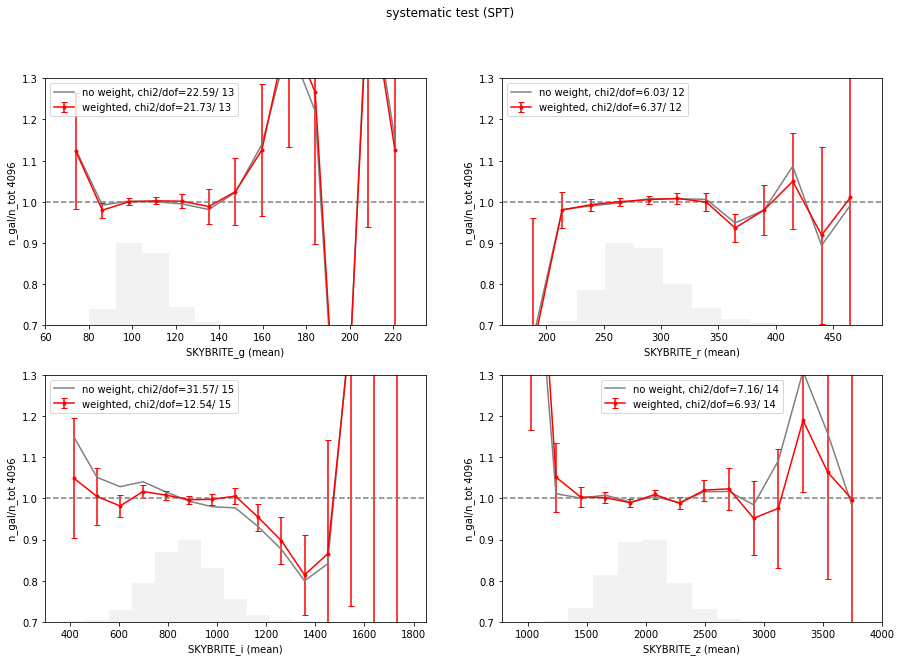

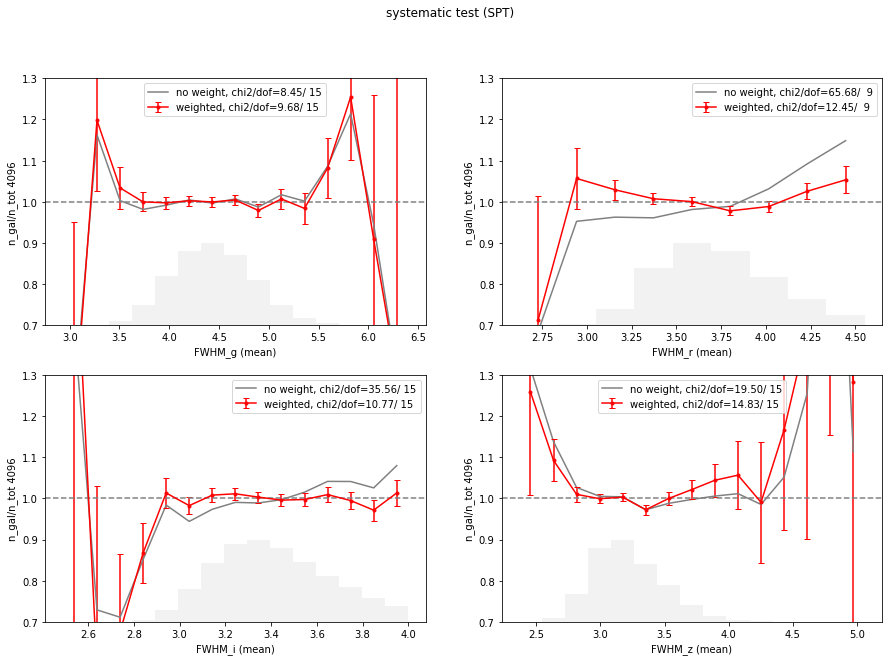

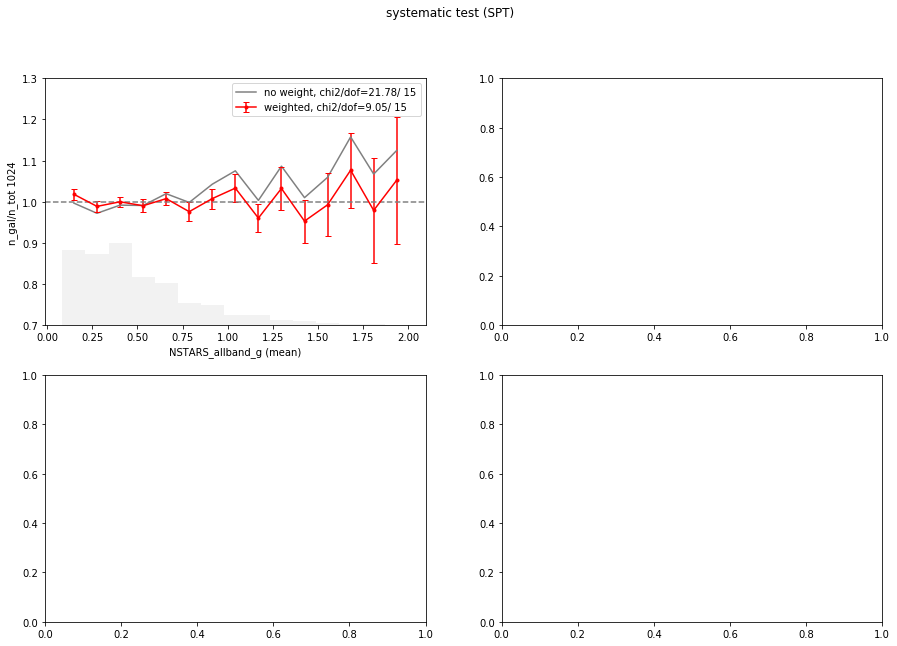

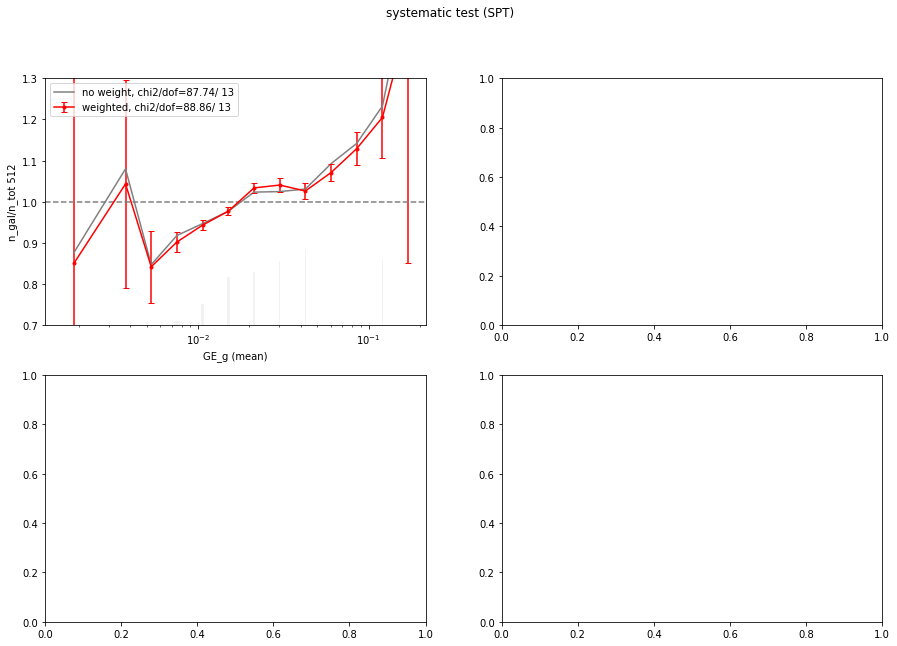

In [130]:
from systematics_module.contCorrection import plot_sysweight
for pr in properties:
    plot_sysweight(property = pr, nside = 4096, kind = 'SPT', 
               suffix1='no_weight', suffix2=suffix, inputdir1 = inputdir, inputdir2 = inputdir, outdir=figoutdir)

